In [1]:
%run import_libs.py

### get data

In [2]:
df_train = get_train_data(TRAIN_PATH='./data/train.parquet')
df_train_target = get_target(TARGET_PATH='./data/train_labels.csv')
df_train = get_train_data_with_target_merged(df_train=df_train, df_train_target=df_train_target)

df_test = get_test_data(TEST_PATH='./data/test.parquet')

In [25]:
all_features = get_all_features(df_train)
cat_features = get_cat_features()
num_features = get_num_features(all_features, cat_features)

# len(all_features), len(cat_features), len(num_features) -> (190, 11, 178)

### % null

In [17]:
df_train_not_null_share = get_not_null_share_df(df_train)
df_test_not_null_share = get_not_null_share_df(df_test)

df_merged_not_null_share = (
    df_train_not_null_share.merge(df_test_not_null_share, on='column_name', how='inner')
)

df_merged_not_null_share.columns = ['column_name', 'train_%not_null', 'test_%not_null']

df_merged_not_null_share.head(3)

,column_name,train_%not_null,test_%not_null
0,customer_ID,1.0,1.0
1,S_2,1.0,1.0
2,D_39,1.0,1.0


In [18]:
df_merged_not_null_share.to_csv('train_test_not_null_share.csv', index=False)

In [20]:
df_merged_not_null_share[df_merged_not_null_share["train_%not_null"] < 0.1]

,column_name,train_%not_null,test_%not_null
182,D_132,0.098089,0.119225
183,B_29,0.068954,0.249618
184,D_134,0.035199,0.031860
185,B_42,0.012922,0.017716
186,D_73,0.010098,0.013163
187,B_39,0.006080,0.012108
188,D_110,0.005665,0.010234
189,D_88,0.001085,0.000991


In [22]:
thresh = 0.05  # -> хотим сохранить колонки, где missing‑rate <= 5 %

cols_to_drop = df_merged_not_null_share[(df_merged_not_null_share["train_%not_null"] <= thresh) | 
                                        (df_merged_not_null_share["test_%not_null"] <= thresh)].column_name.tolist()

cols_to_drop

['D_134', 'B_42', 'D_73', 'B_39', 'D_110', 'D_88']

### PSI features

In [35]:
len(num_features)

177

In [36]:
# remove features from previous step
num_features = [feat for feat in num_features if feat not in cols_to_drop]
len(num_features)

171

In [38]:
psi_report = calc_psi(df_train[num_features], df_test[num_features], n_bins=10)
print(psi_report.head())

  feature        psi category
0     R_1  10.733114   remove
1    S_11   0.851822   remove
2    D_59   0.793348   remove
3     S_9   0.138131    watch
4    S_27   0.098031   stable


In [39]:
flagged = psi_report.query("category in ['watch', 'remove']")['feature'].tolist()
flagged

['R_1', 'S_11', 'D_59', 'S_9']

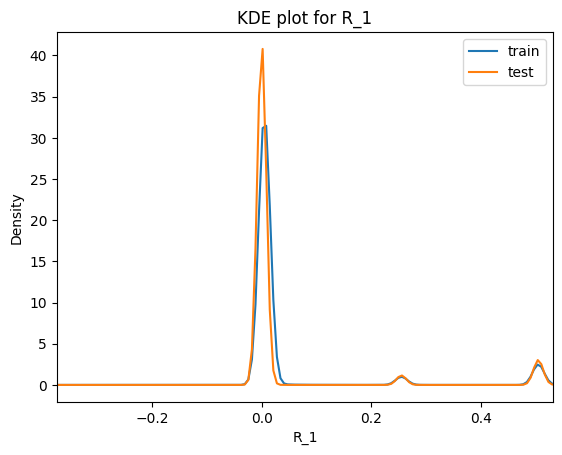

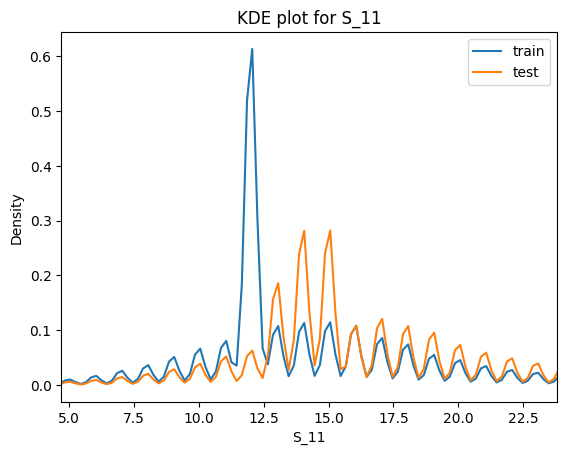

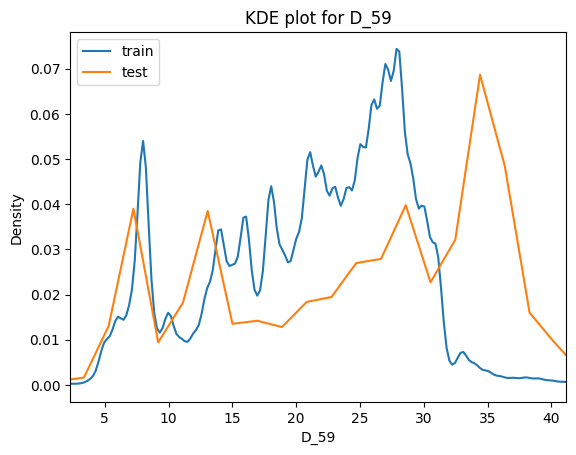

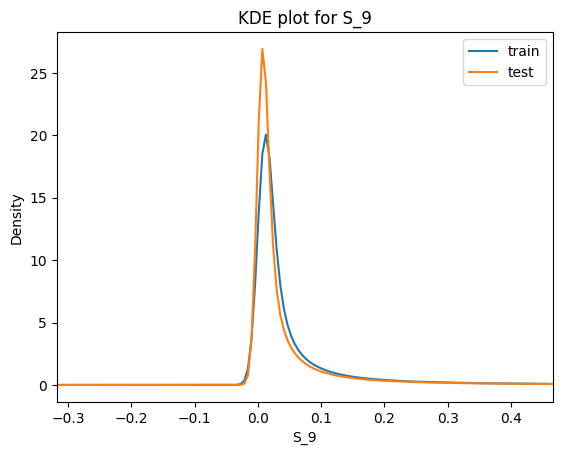

In [ ]:
for col in flagged:
    plt.figure()
    
    mean = df_train[col].mean(skipna=True)
    std  = df_train[col].std(skipna=True)
    a, b = mean - 2*std, mean + 2*std
    
    df_train[col].plot(kind='kde', label='train', linewidth=1.5)
    df_test[col].plot(kind='kde', label='test',  linewidth=1.5)
    plt.title(f"KDE plot for {col}")
    plt.xlabel(col)
    plt.ylabel("Density")
    plt.xlim(a, b)
    plt.legend()
    plt.show()

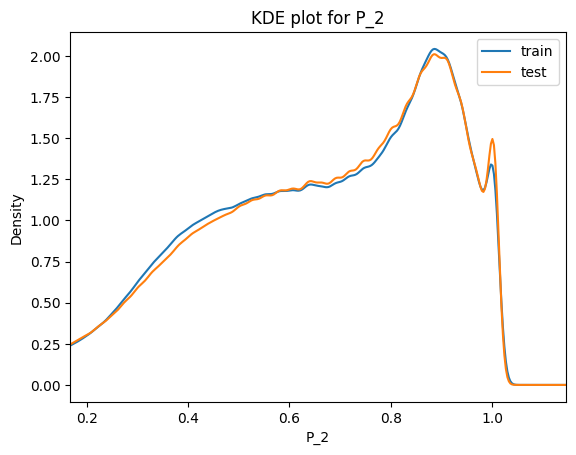

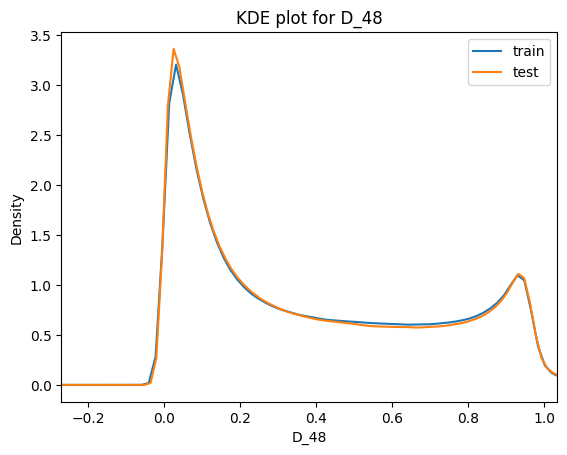

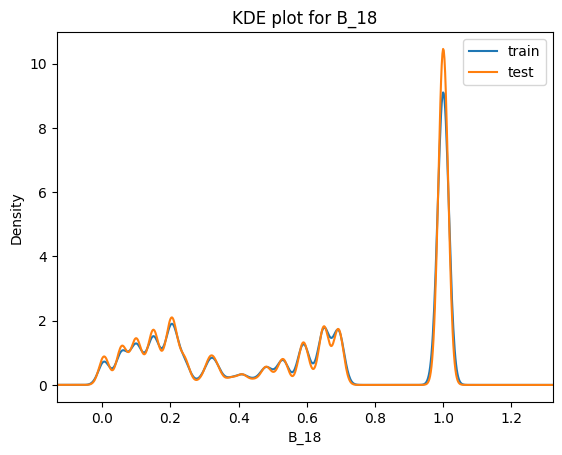

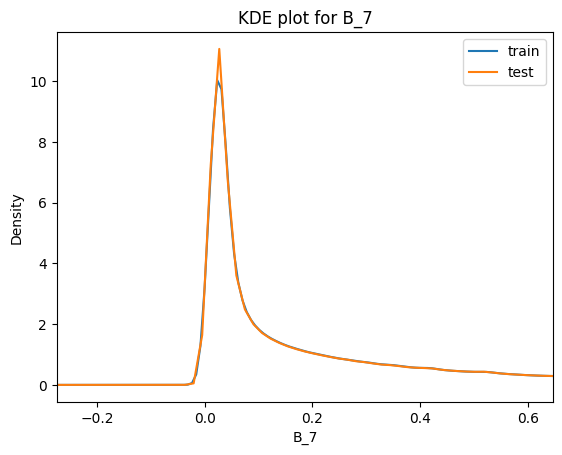

In [5]:
# Факторы со стабильным PSI
for col in ['P_2', 'D_48', 'B_18', 'B_7']:
    plt.figure()
    
    mean = df_train[col].mean(skipna=True)
    std  = df_train[col].std(skipna=True)
    a, b = mean - 2*std, mean + 2*std
    
    df_train[col].plot(kind='kde', label='train', linewidth=1.5)
    df_test[col].plot(kind='kde', label='test',  linewidth=1.5)
    plt.title(f"KDE plot for {col}")
    plt.xlabel(col)
    plt.ylabel("Density")
    plt.xlim(a, b)
    plt.legend()
    plt.show()

In [41]:
# Optional: save to CSV
psi_report.to_csv("psi_report.csv", index=False)

In [30]:
col = "R_1"
print("Unique in train:", df_train[col].nunique(),
      "Unique in test :", df_test[col].nunique())

Unique in train: 4788285 Unique in test : 487240


In [44]:
print(df_train["R_1"].describe(percentiles=[.25, .5, .75, .9, .95, .99]))
print()
print(df_test["R_1"].describe(percentiles=[.25, .5, .75, .9, .95, .99]))

count    5.531451e+06
mean     7.880273e-02
std      2.263971e-01
min      1.534223e-09
25%      2.895934e-03
50%      5.782230e-03
75%      8.660590e-03
90%      2.595166e-01
95%      5.073617e-01
99%      1.009118e+00
max      3.256284e+00
Name: R_1, dtype: float64

count    1.136376e+07
mean     7.043231e-02
std      2.171522e-01
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
90%      2.585193e-01
95%      5.067948e-01
99%      1.000000e+00
max      3.258507e+00
Name: R_1, dtype: float64


### Попарная корреляция признаков

In [ ]:
len(num_features)

171

In [ ]:
# remove features from previous step
num_features = [feat for feat in num_features if feat not in psi_report.query("category in ['remove']")['feature'].tolist()]
len(num_features)

168

In [55]:
payment_feats = []
delinq_feats = []
spend_feats = []
balance_feats = []
risk_feats = []

for feat in num_features:
    if feat[0] == 'P':
        #print(feat)
        payment_feats.append(feat)
    elif feat[0] == 'D':
        delinq_feats.append(feat)
    elif feat[0] == 'S':
        spend_feats.append(feat)
    elif feat[0] == 'B':
        balance_feats.append(feat)
    elif feat[0] == 'R':
        risk_feats.append(feat)

In [58]:
print(len(payment_feats))
print(len(delinq_feats))
print(len(spend_feats))
print(len(balance_feats))
print(len(risk_feats))
print()

print(len(payment_feats) + len(delinq_feats) + len(spend_feats) + len(balance_feats) + len(risk_feats))

3
82
20
36
27

168


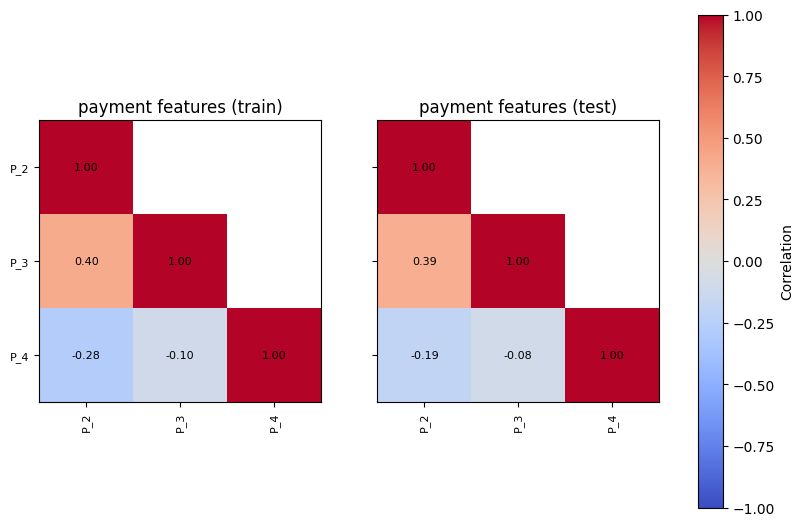

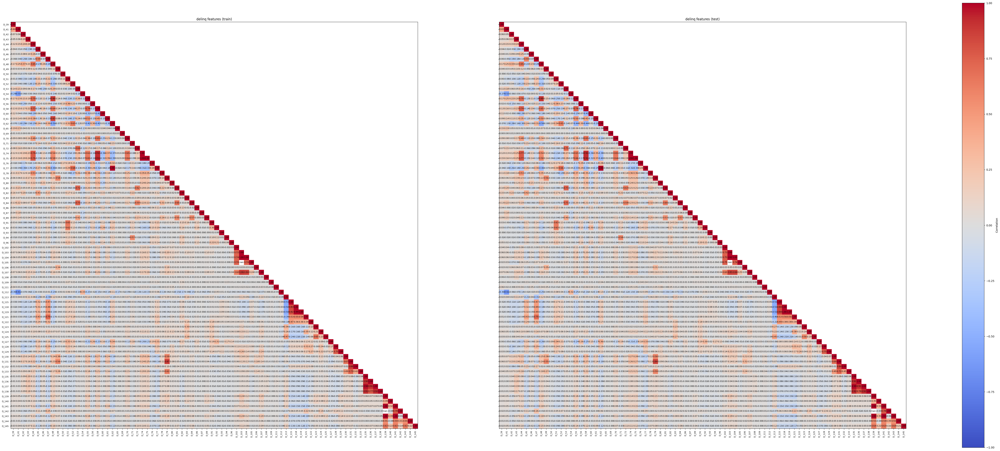

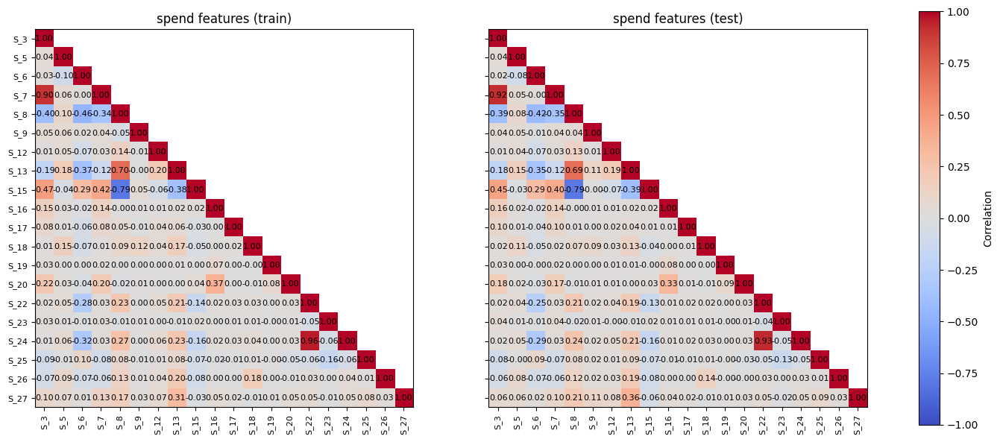

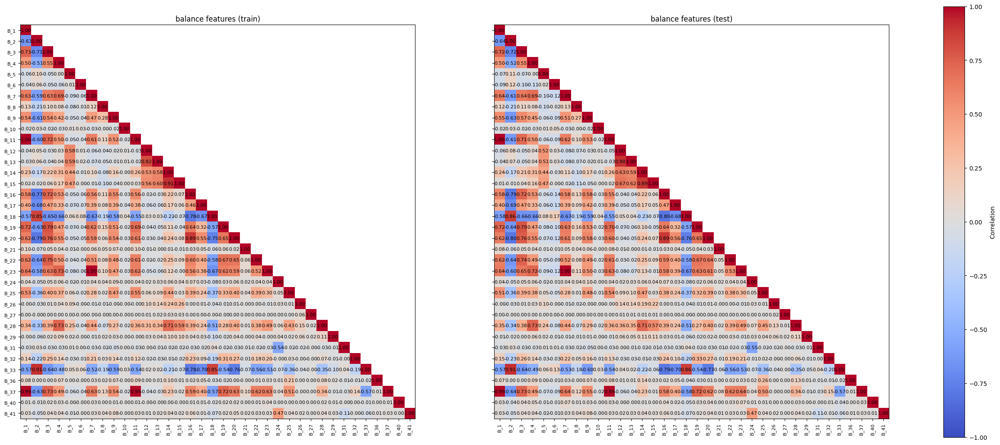

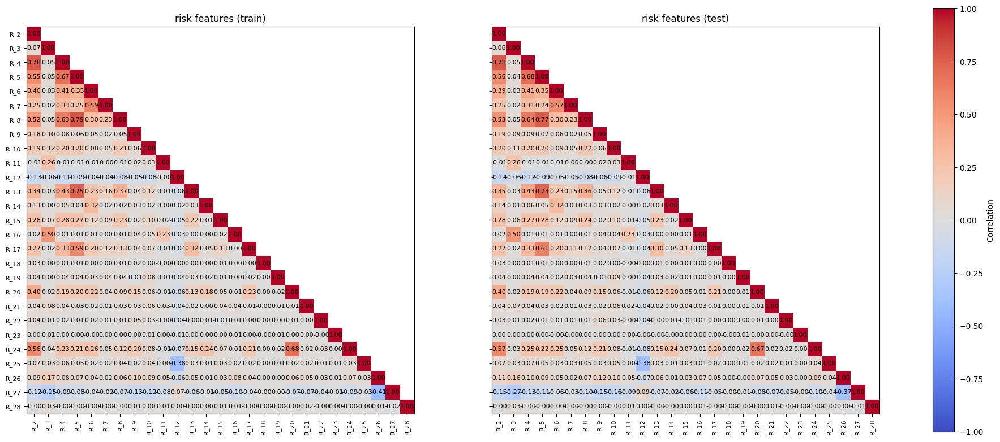

In [ ]:
groups = {
    "payment":  payment_feats,
    "delinq":   delinq_feats,
    "spend":    spend_feats,
    "balance":  balance_feats,
    "risk":     risk_feats
}

for name, feat_list in groups.items():
    plot_group_corr_pair(df_train, df_test, feat_list, f"{name} features")


In [ ]:
# payment: no correlations > 90%

# delinq: D_74 - D_58, 
#         D_75 - D_58,
#         D_77 - D_62,
#         D_74 - D_75
#         D_104 - D_103
#         D_118 - D_119
#         D_135 - D_136
#         D_135 - D_137
#         D_135 - D_138
#         D_139 - D_141
#         D_139 - D_143
#         D_141 - D_143
 

# spend: S_7 - S_3
#        S_24 - S_22

# balance: B_1 - B_11
#          B_1 - B_37
#          B_2 - B_33
#          B_7 - B_23
#          B_11 - B_37
#          B_15 - B_14   


# risk: no correlations > 90%

**after dropping correlated**

In [77]:
delinq_to_drop = ["D_74", "D_75", "D_77", "D_103", "D_118", "D_136", "D_137", "D_138", "D_141", "D_143"]

spend_to_drop = ["S_7", "S_24"]

balance_to_drop = ["B_11", "B_15", "B_23", "B_33", "B_37"]

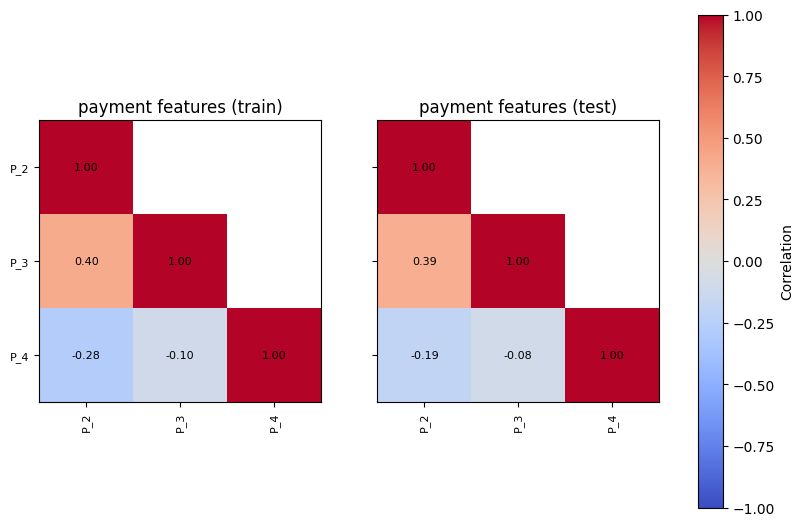

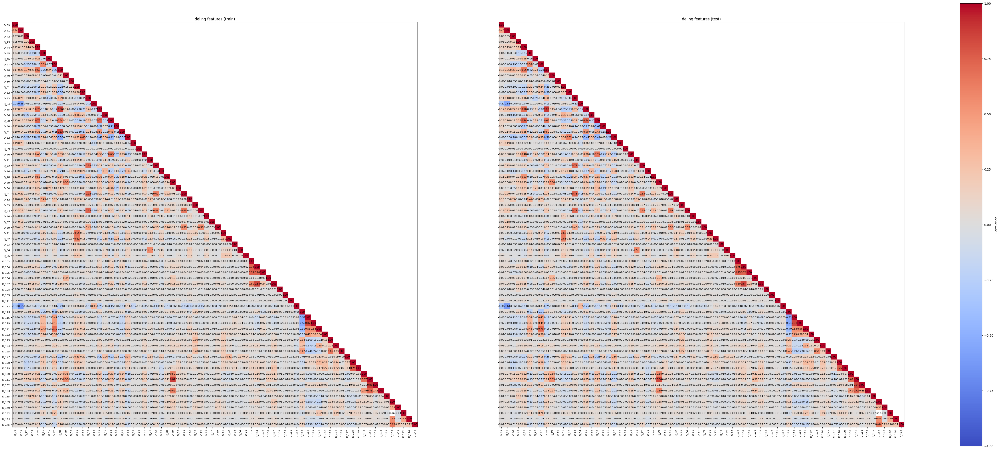

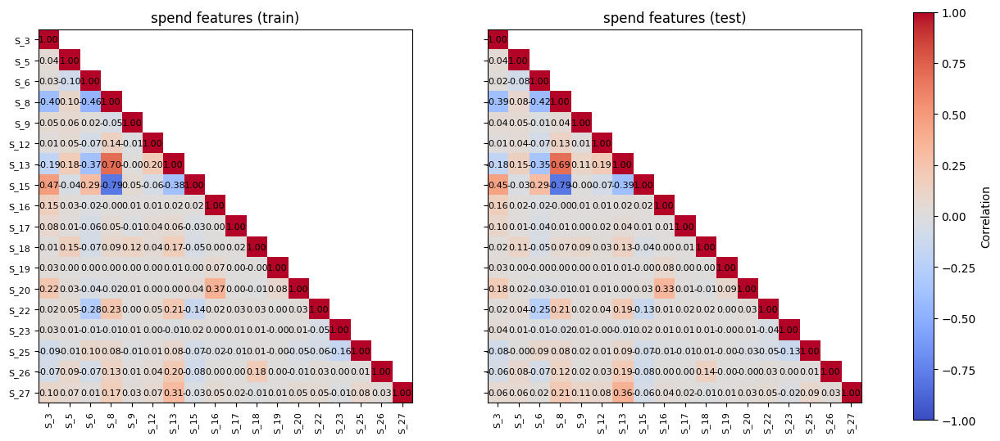

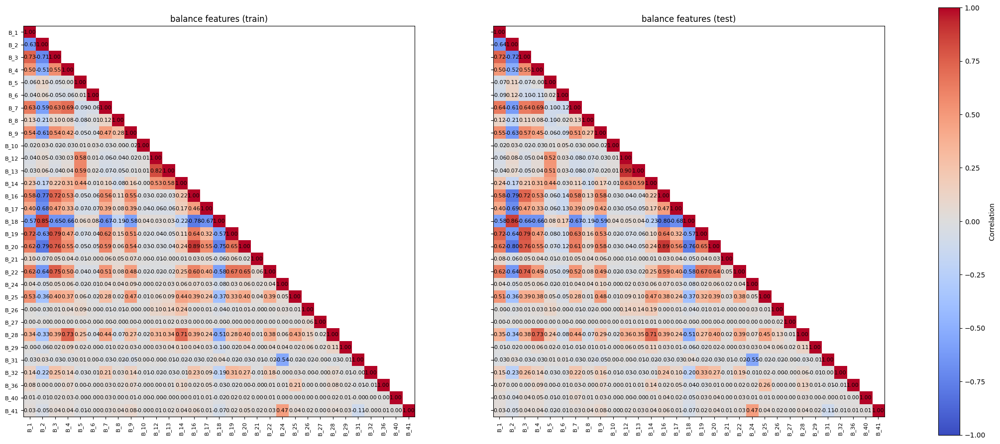

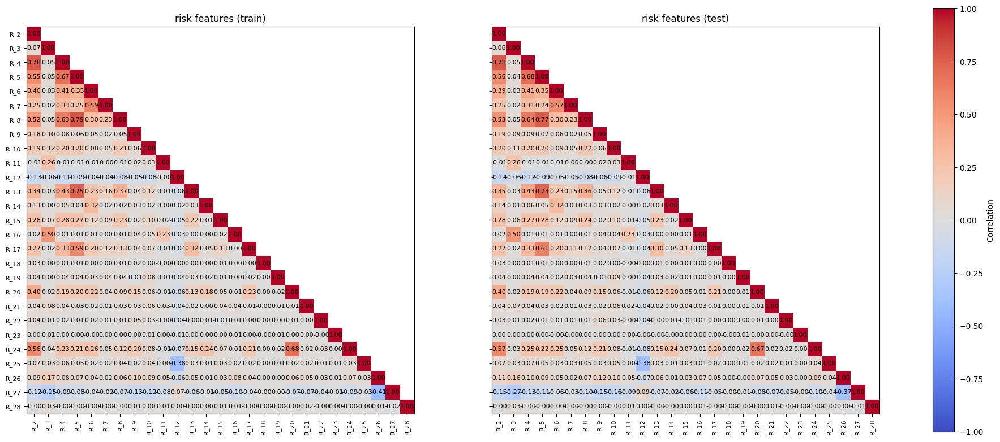

In [78]:
groups = {
    "payment":  payment_feats,
    "delinq":   [feat for feat in delinq_feats if feat not in delinq_to_drop],
    "spend":    [feat for feat in spend_feats if feat not in spend_to_drop],
    "balance":  [feat for feat in balance_feats if feat not in balance_to_drop],
    "risk":     risk_feats
}

for name, feat_list in groups.items():
    plot_group_corr_pair(df_train, df_test, feat_list, f"{name} features")

In [79]:
len(num_features)

168

In [81]:
num_features = (payment_feats +\
                [feat for feat in delinq_feats if feat not in delinq_to_drop] +\
                [feat for feat in spend_feats if feat not in spend_to_drop] +\
                [feat for feat in balance_feats if feat not in balance_to_drop] +\
                risk_feats)

In [82]:
len(num_features)

151

In [96]:
pd.DataFrame(num_features).to_csv("num_feats_after_filtering.csv", index=False)

### Plot_distr

In [83]:
len(num_features)

151

  0%|          | 0/151 [00:00<?, ?it/s]

-------------------------
feat = P_2
-------------------------


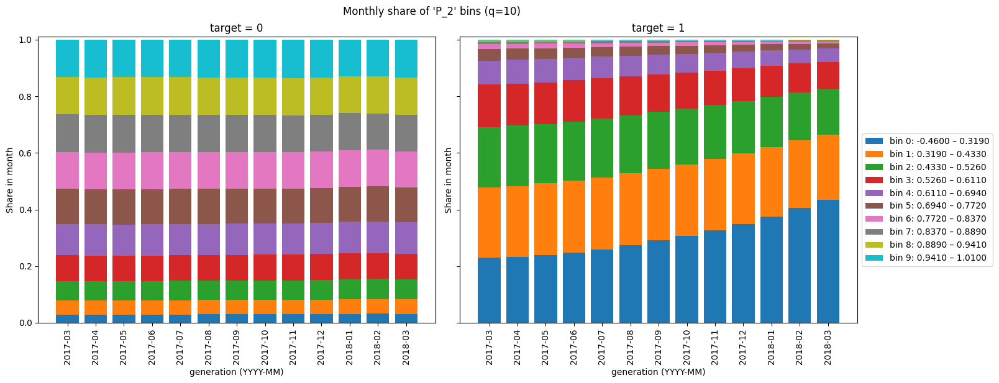

  1%|          | 1/151 [00:13<33:40, 13.47s/it]

-------------------------
feat = P_3
-------------------------


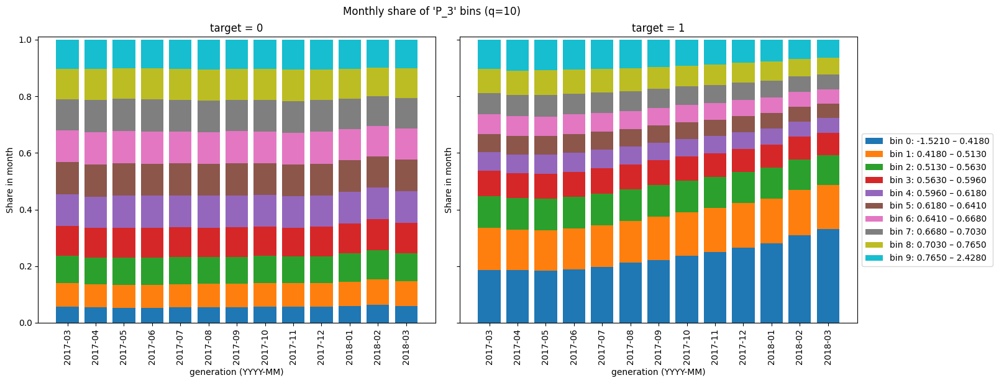

  1%|▏         | 2/151 [00:21<25:38, 10.33s/it]

-------------------------
feat = P_4
-------------------------


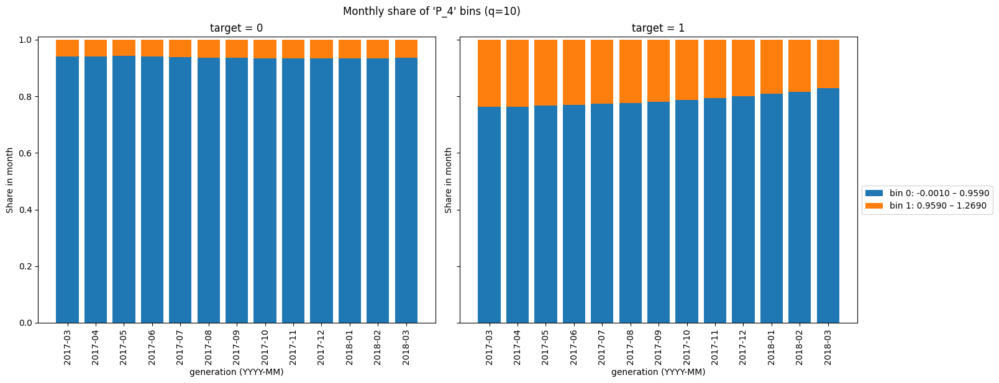

  2%|▏         | 3/151 [00:28<21:23,  8.67s/it]

-------------------------
feat = D_39
-------------------------


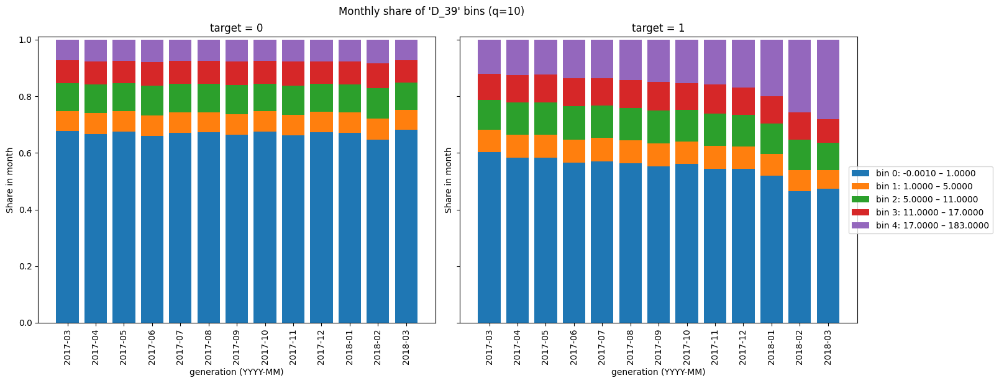

  3%|▎         | 4/151 [00:35<19:37,  8.01s/it]

-------------------------
feat = D_41
-------------------------


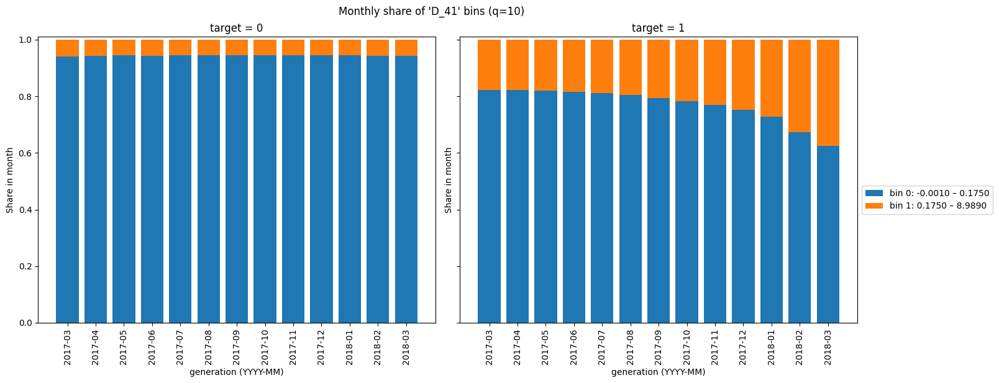

  3%|▎         | 5/151 [00:42<18:41,  7.68s/it]

-------------------------
feat = D_42
-------------------------


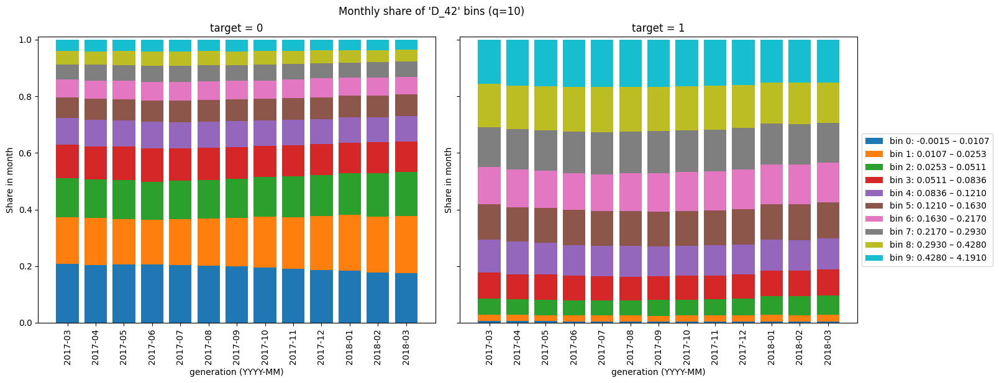

  4%|▍         | 6/151 [00:50<18:56,  7.84s/it]

-------------------------
feat = D_43
-------------------------


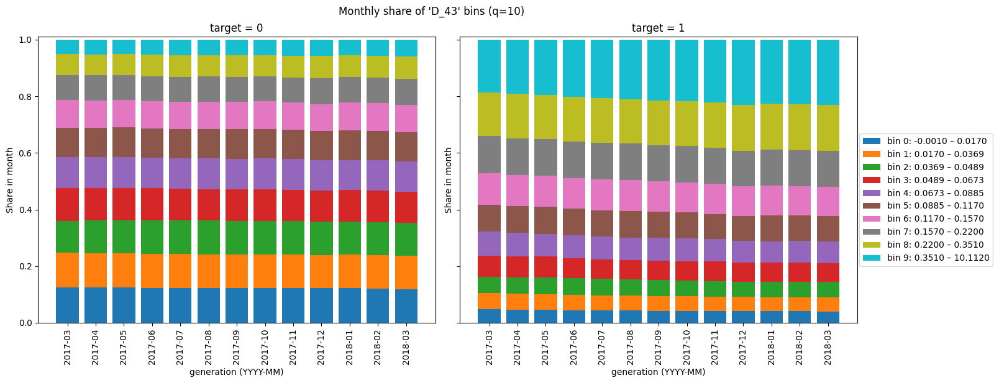

  5%|▍         | 7/151 [00:57<18:13,  7.60s/it]

-------------------------
feat = D_44
-------------------------


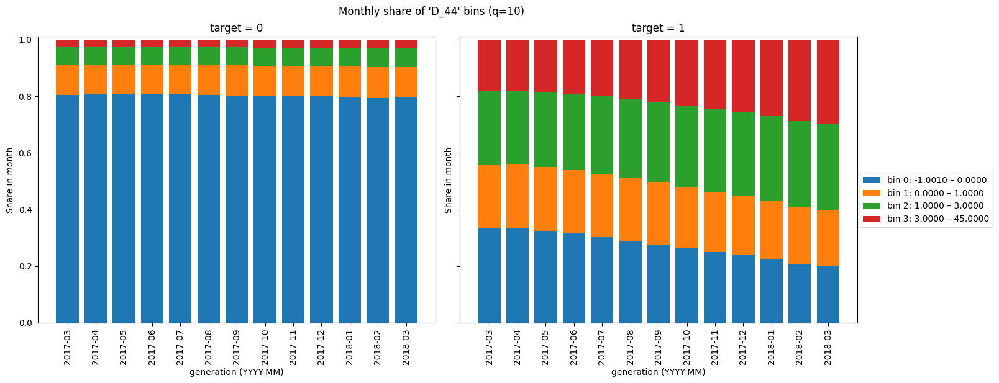

  5%|▌         | 8/151 [01:04<17:30,  7.35s/it]

-------------------------
feat = D_45
-------------------------


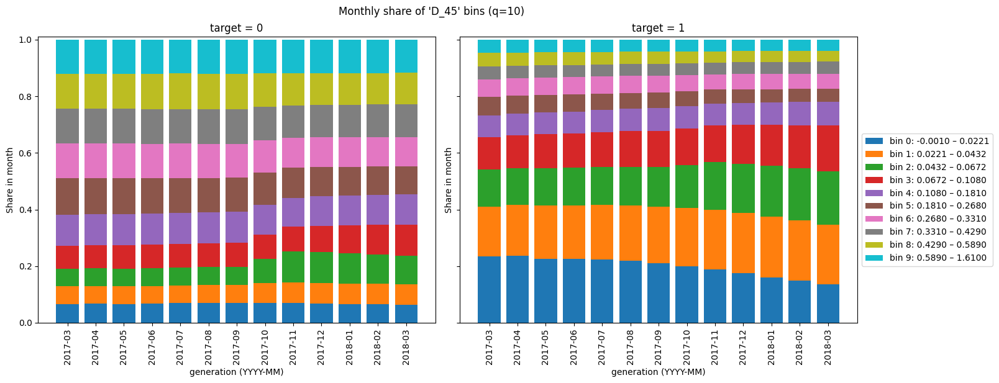

  6%|▌         | 9/151 [01:11<17:23,  7.35s/it]

-------------------------
feat = D_46
-------------------------


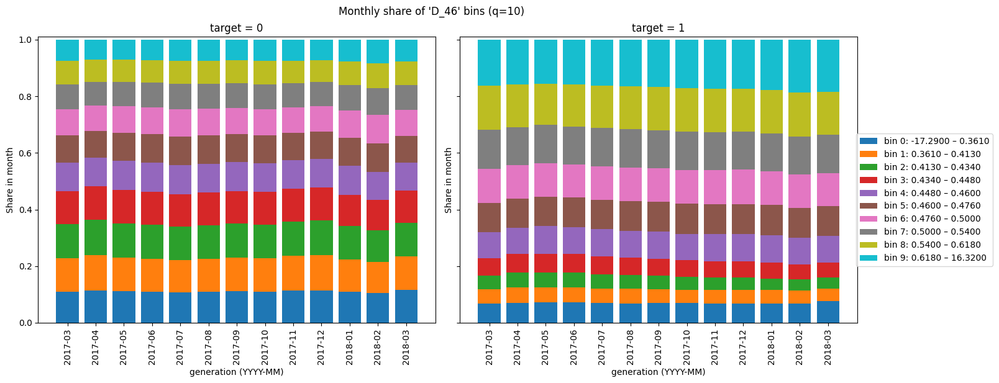

  7%|▋         | 10/151 [01:19<17:14,  7.34s/it]

-------------------------
feat = D_47
-------------------------


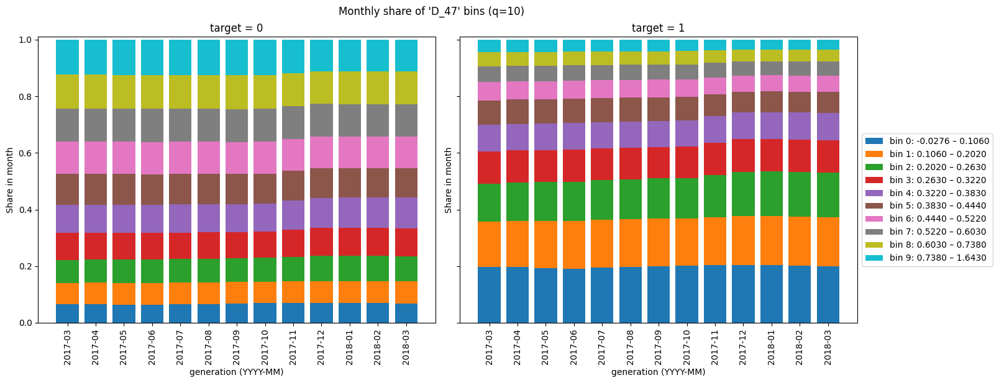

  7%|▋         | 11/151 [01:26<17:07,  7.34s/it]

-------------------------
feat = D_48
-------------------------


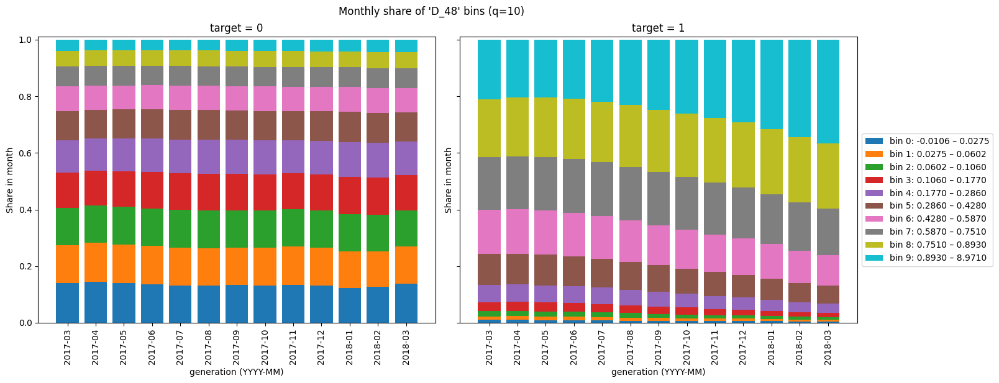

  8%|▊         | 12/151 [01:34<17:10,  7.42s/it]

-------------------------
feat = D_49
-------------------------


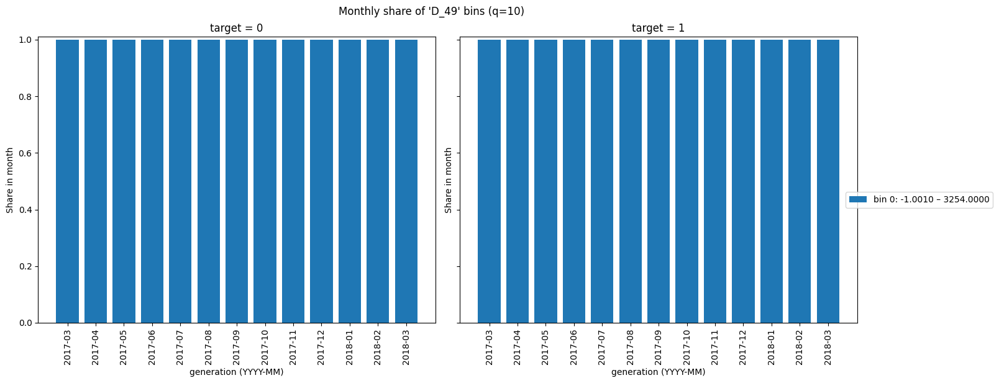

  9%|▊         | 13/151 [01:41<17:04,  7.43s/it]

-------------------------
feat = D_50
-------------------------


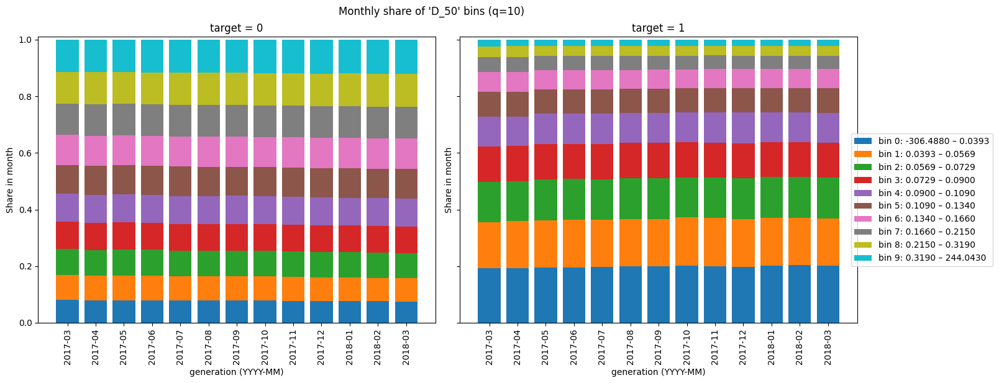

  9%|▉         | 14/151 [01:49<17:17,  7.57s/it]

-------------------------
feat = D_51
-------------------------


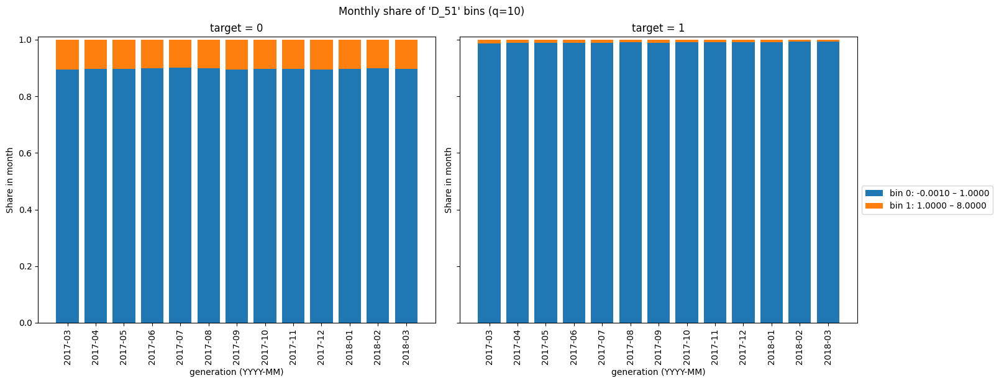

 10%|▉         | 15/151 [01:56<16:40,  7.36s/it]

-------------------------
feat = D_52
-------------------------


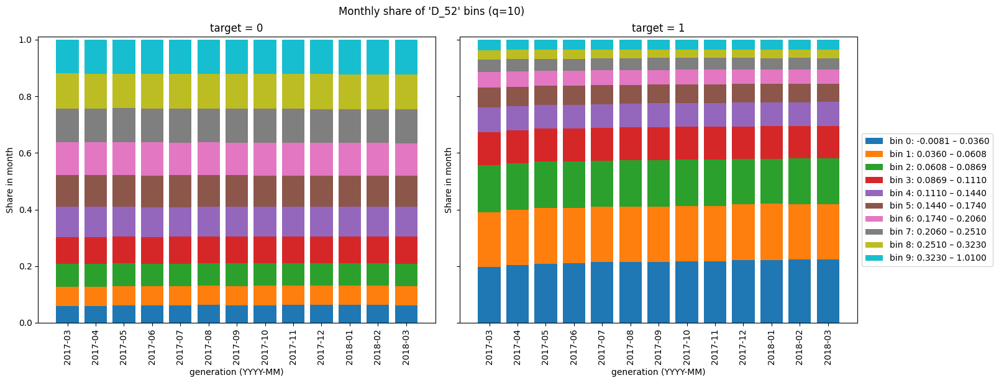

 11%|█         | 16/151 [02:03<16:28,  7.32s/it]

-------------------------
feat = D_53
-------------------------


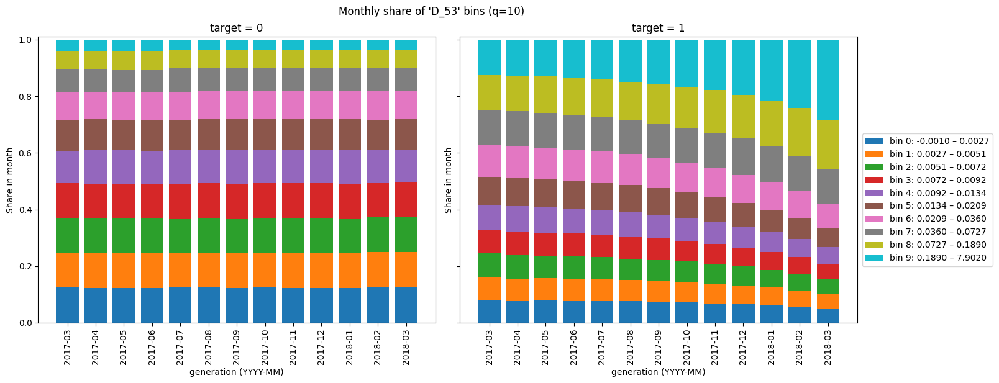

 11%|█▏        | 17/151 [02:10<16:08,  7.22s/it]

-------------------------
feat = D_54
-------------------------


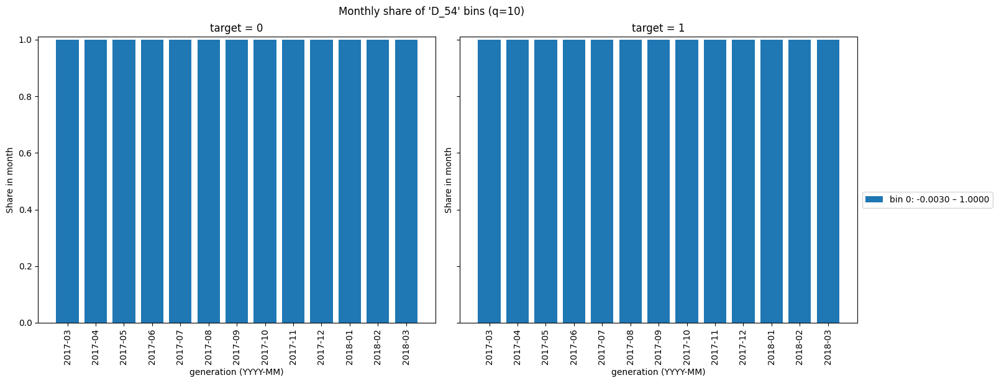

 12%|█▏        | 18/151 [02:17<15:48,  7.13s/it]

-------------------------
feat = D_55
-------------------------


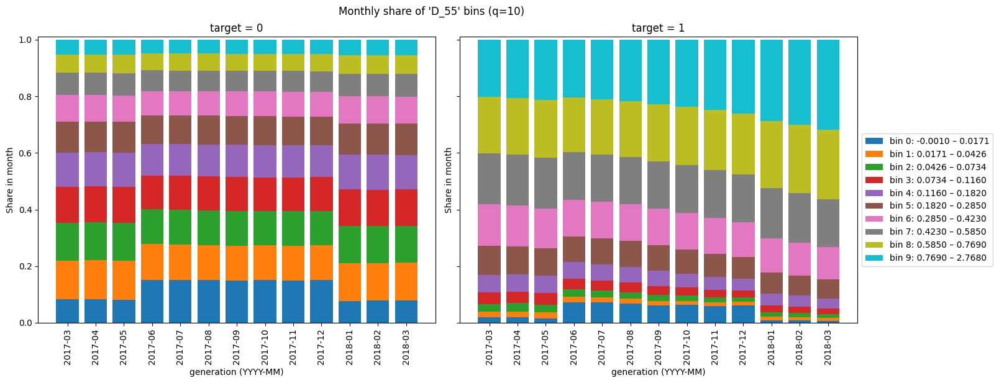

 13%|█▎        | 19/151 [02:24<15:41,  7.13s/it]

-------------------------
feat = D_56
-------------------------


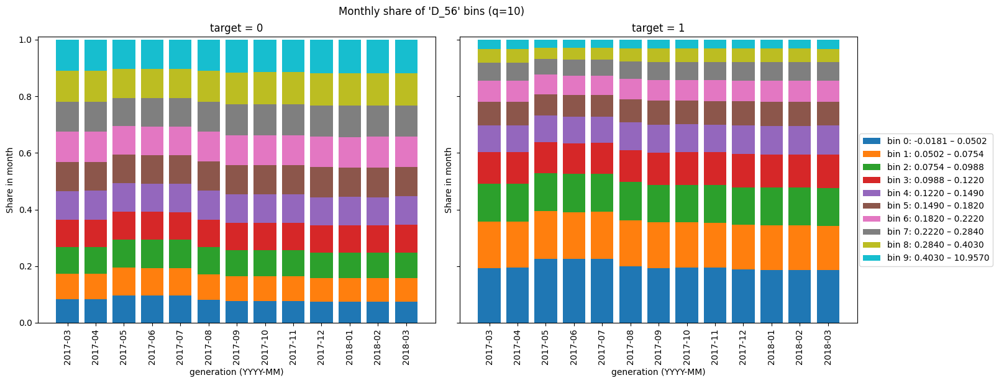

 13%|█▎        | 20/151 [02:31<15:32,  7.12s/it]

-------------------------
feat = D_58
-------------------------


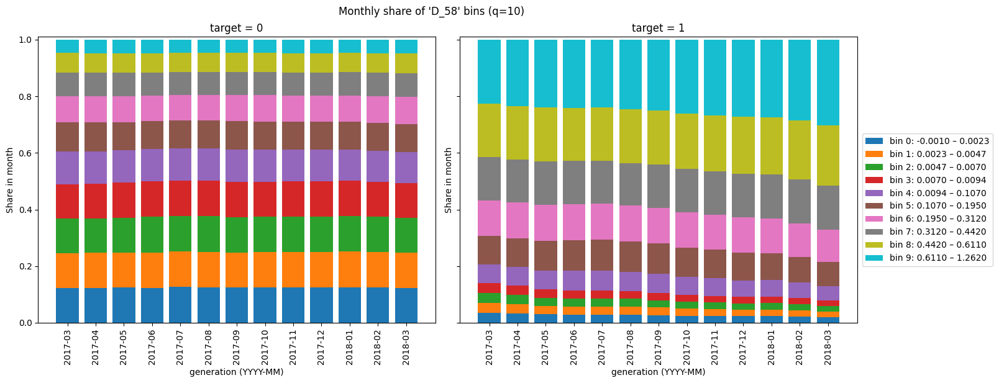

 14%|█▍        | 21/151 [02:39<15:47,  7.29s/it]

-------------------------
feat = D_60
-------------------------


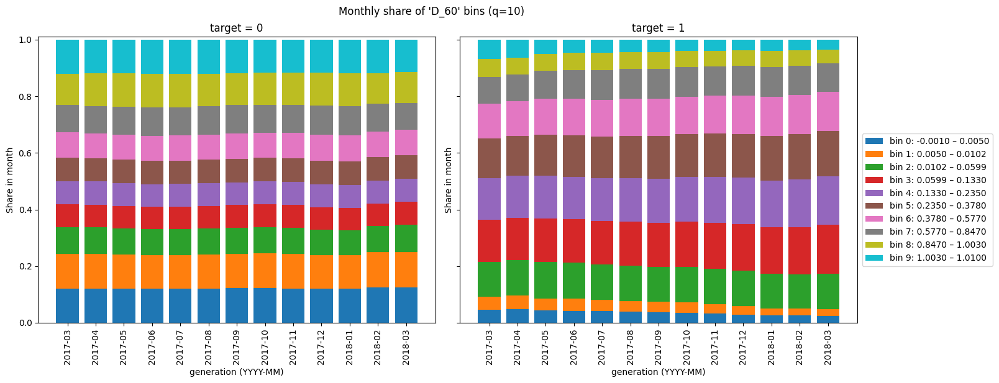

 15%|█▍        | 22/151 [02:47<16:00,  7.45s/it]

-------------------------
feat = D_61
-------------------------


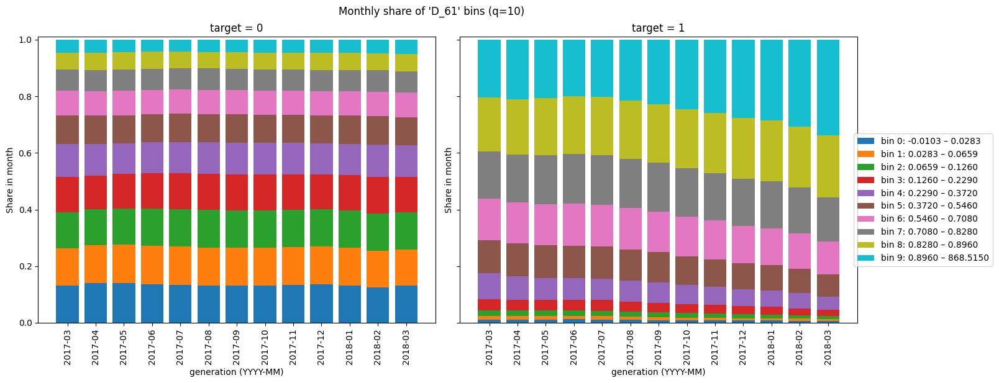

 15%|█▌        | 23/151 [02:54<16:07,  7.56s/it]

-------------------------
feat = D_62
-------------------------


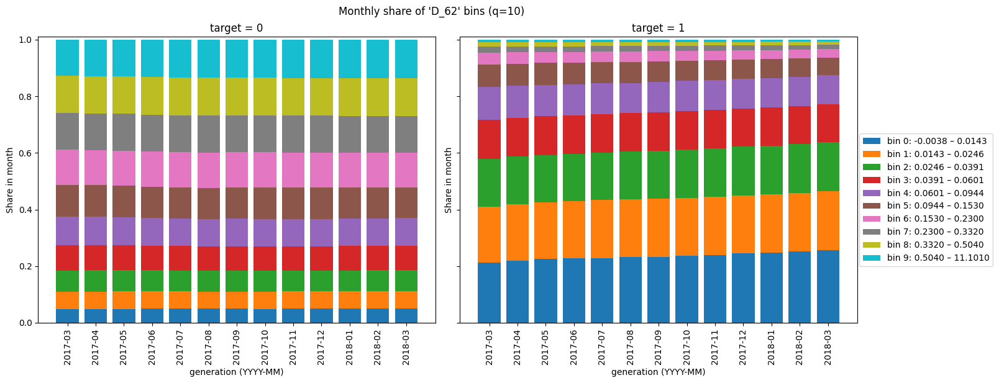

 16%|█▌        | 24/151 [03:02<16:02,  7.58s/it]

-------------------------
feat = D_65
-------------------------


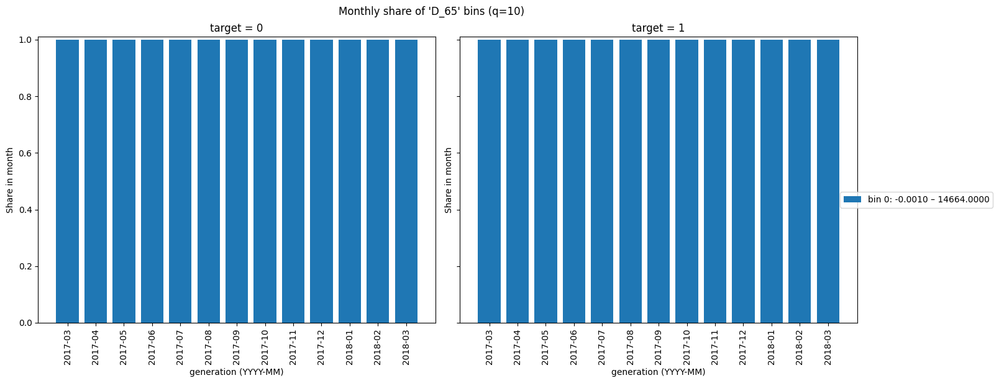

 17%|█▋        | 25/151 [03:10<15:56,  7.59s/it]

-------------------------
feat = D_69
-------------------------


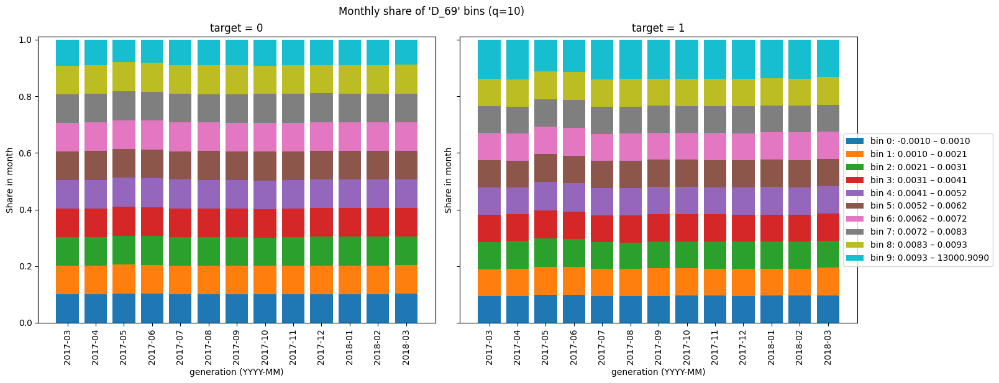

 17%|█▋        | 26/151 [03:18<15:57,  7.66s/it]

-------------------------
feat = D_70
-------------------------


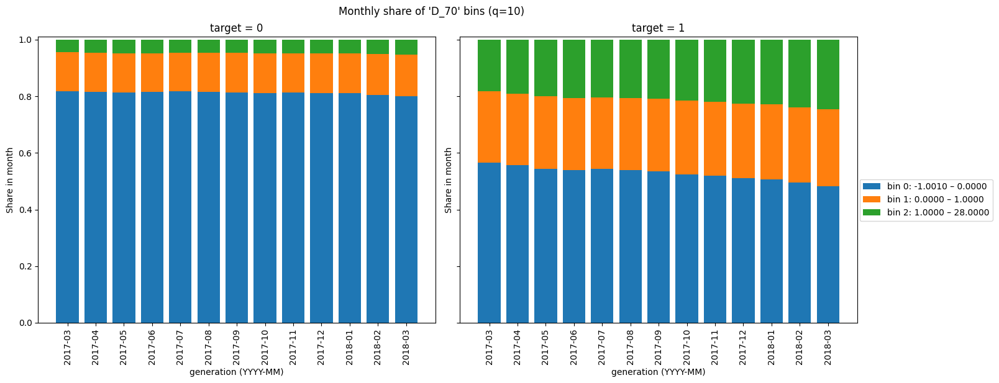

 18%|█▊        | 27/151 [03:25<15:40,  7.58s/it]

-------------------------
feat = D_71
-------------------------


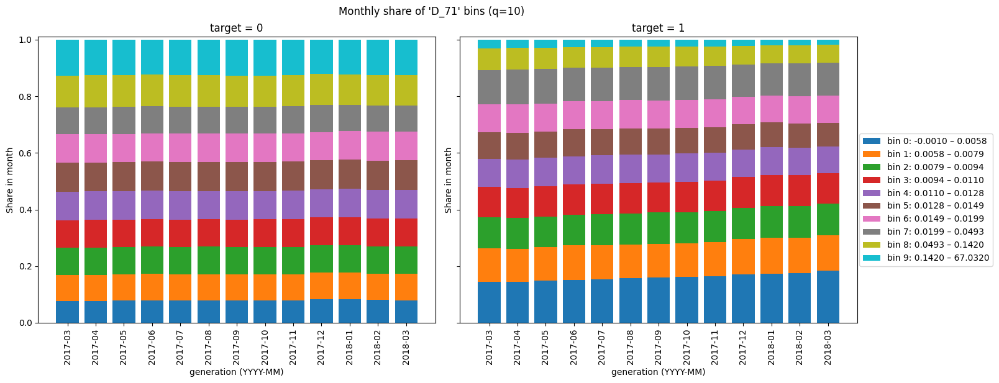

 19%|█▊        | 28/151 [03:33<16:06,  7.86s/it]

-------------------------
feat = D_72
-------------------------


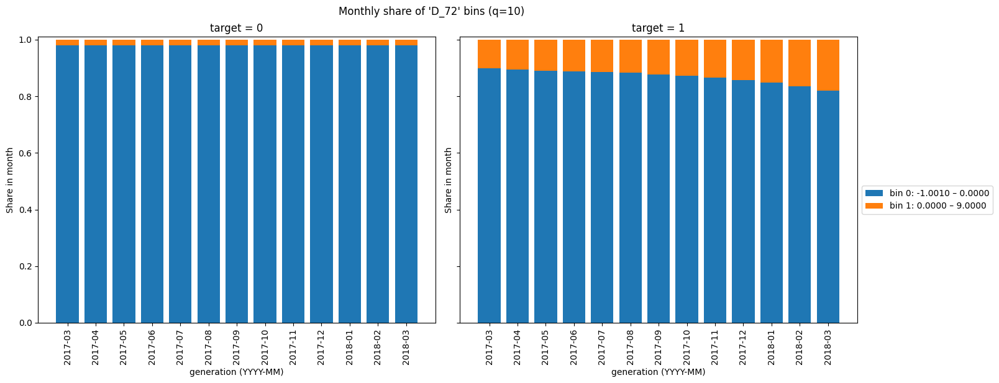

 19%|█▉        | 29/151 [03:42<16:30,  8.12s/it]

-------------------------
feat = D_76
-------------------------


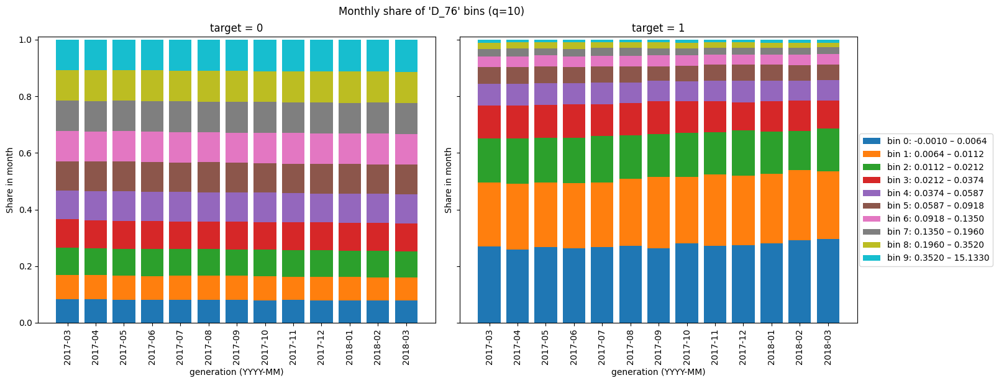

 20%|█▉        | 30/151 [03:50<16:17,  8.08s/it]

-------------------------
feat = D_78
-------------------------


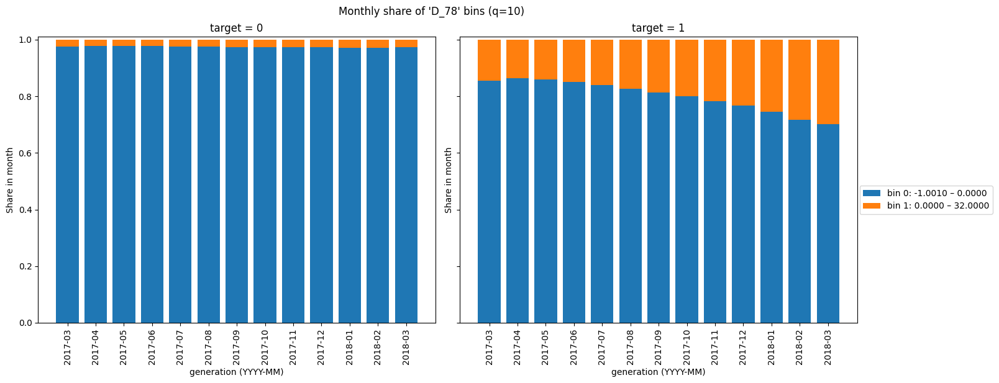

 21%|██        | 31/151 [03:58<15:59,  7.99s/it]

-------------------------
feat = D_79
-------------------------


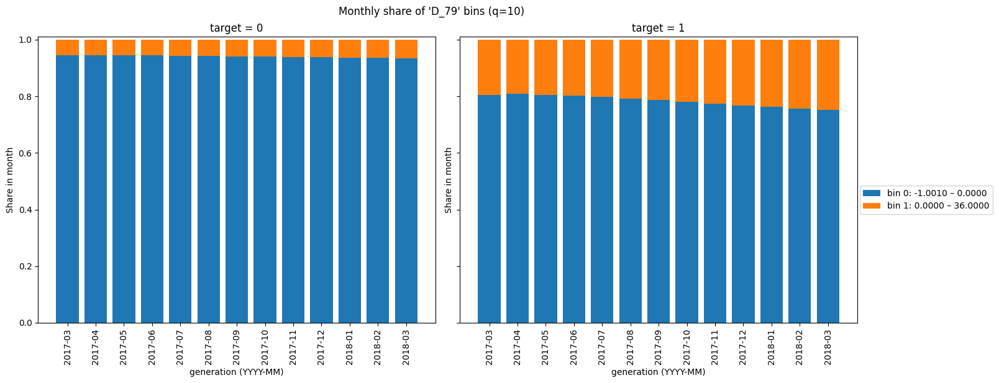

 21%|██        | 32/151 [04:05<15:34,  7.85s/it]

-------------------------
feat = D_80
-------------------------


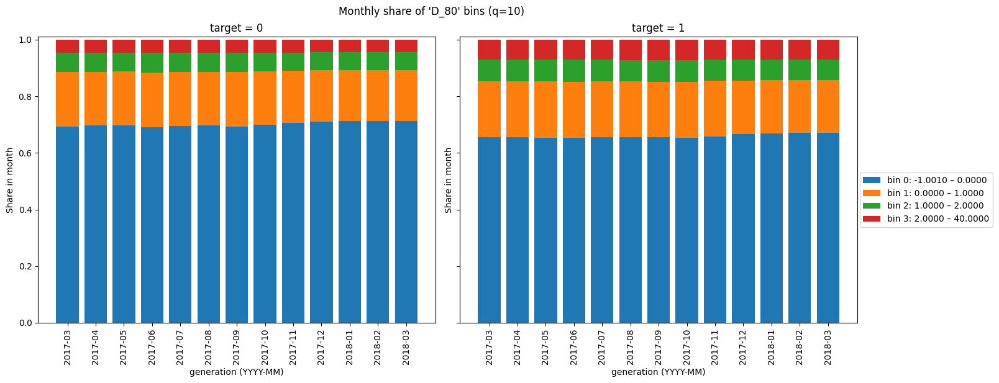

 22%|██▏       | 33/151 [04:13<15:19,  7.79s/it]

-------------------------
feat = D_81
-------------------------


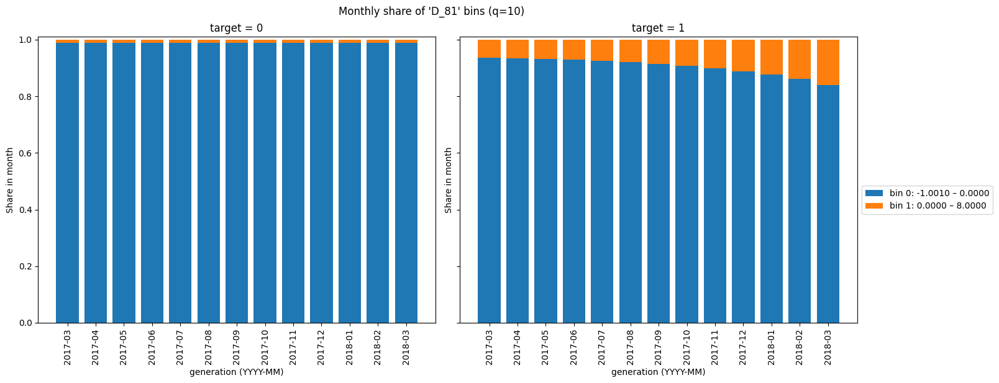

 23%|██▎       | 34/151 [04:20<14:36,  7.49s/it]

-------------------------
feat = D_82
-------------------------


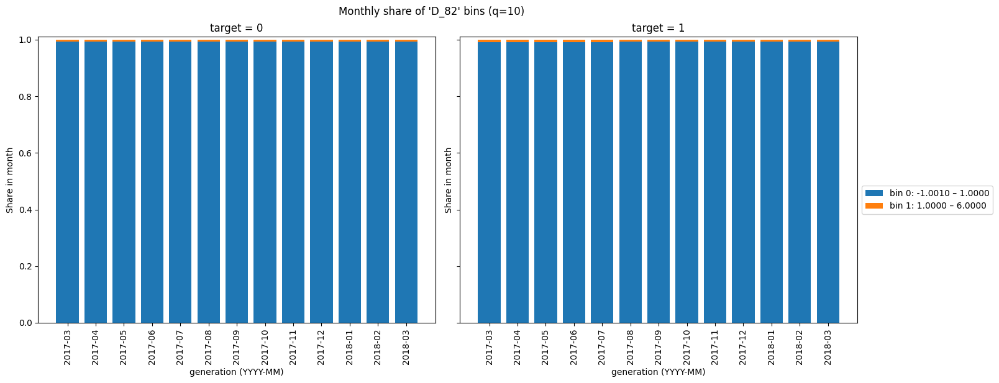

 23%|██▎       | 35/151 [04:27<14:21,  7.42s/it]

-------------------------
feat = D_83
-------------------------


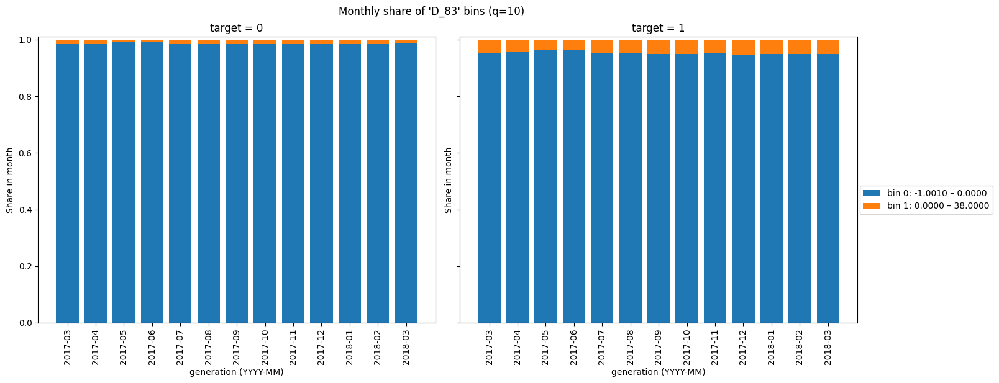

 24%|██▍       | 36/151 [04:34<13:54,  7.25s/it]

-------------------------
feat = D_84
-------------------------


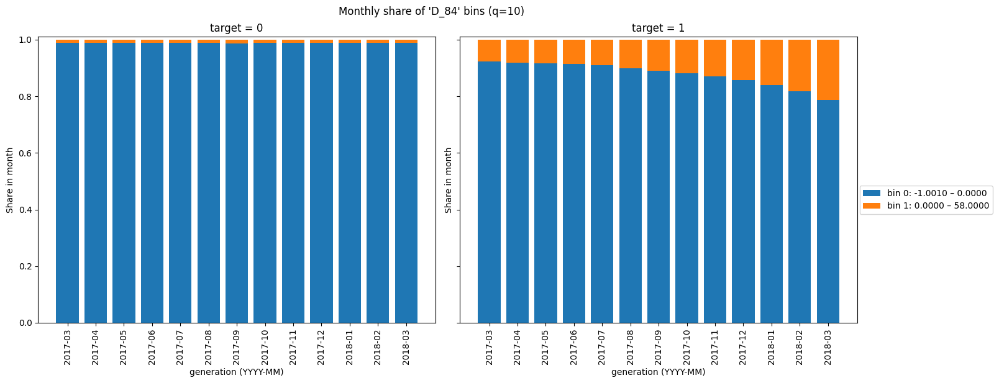

 25%|██▍       | 37/151 [04:41<13:29,  7.10s/it]

-------------------------
feat = D_86
-------------------------


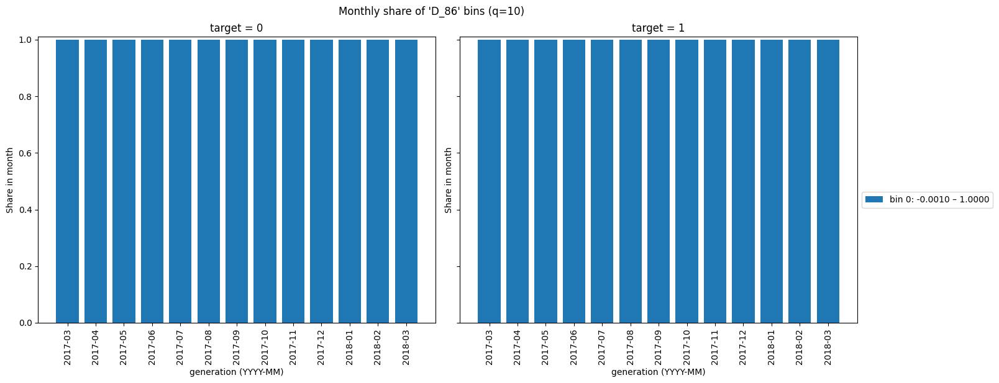

 25%|██▌       | 38/151 [04:48<13:26,  7.14s/it]

-------------------------
feat = D_87
-------------------------


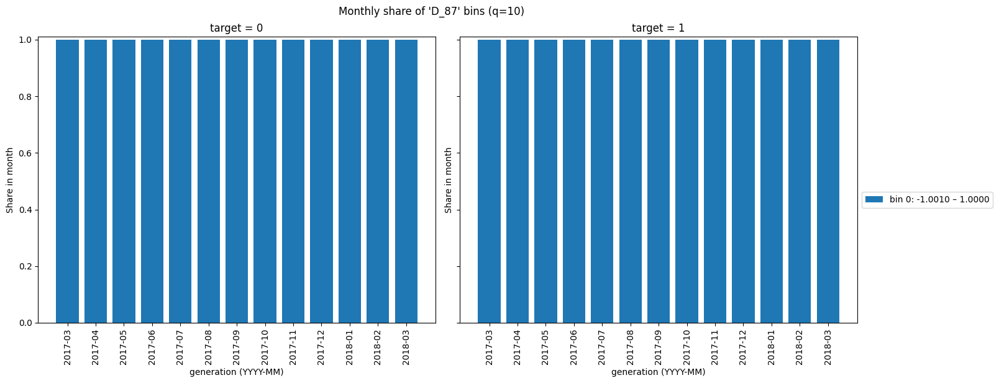

 26%|██▌       | 39/151 [04:56<13:49,  7.41s/it]

-------------------------
feat = D_89
-------------------------


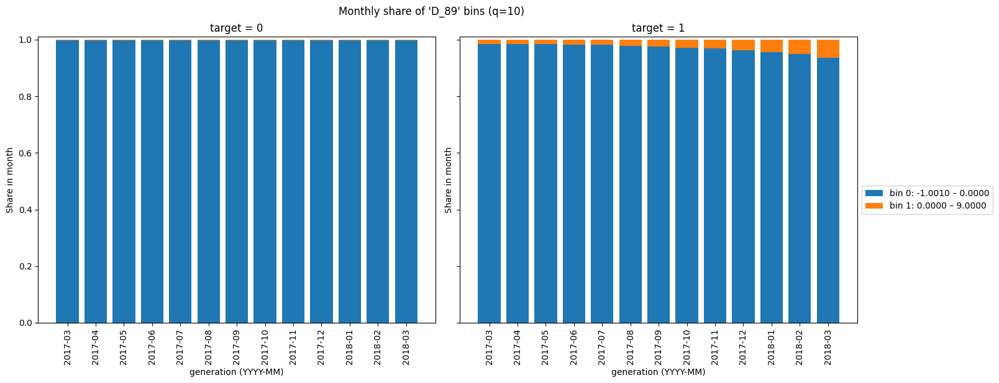

 26%|██▋       | 40/151 [05:04<14:02,  7.59s/it]

-------------------------
feat = D_91
-------------------------


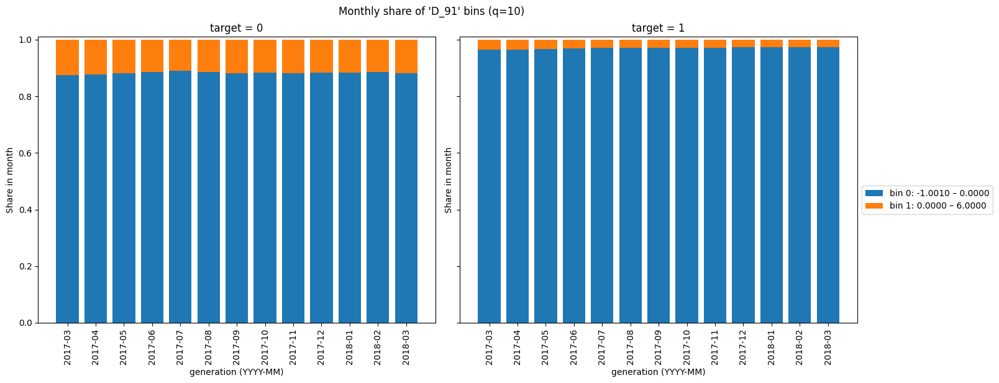

 27%|██▋       | 41/151 [05:13<14:27,  7.89s/it]

-------------------------
feat = D_92
-------------------------


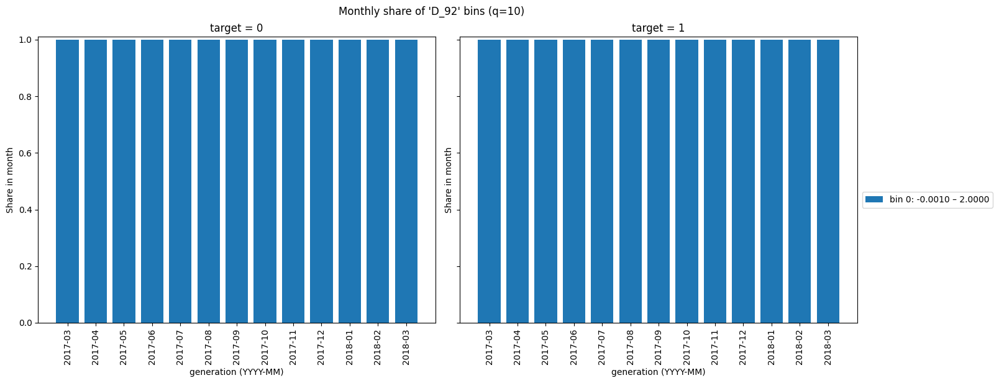

 28%|██▊       | 42/151 [05:22<14:54,  8.21s/it]

-------------------------
feat = D_93
-------------------------


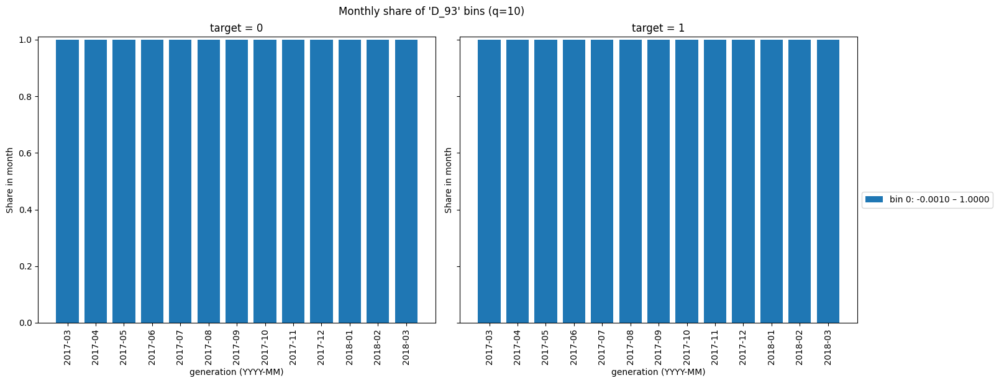

 28%|██▊       | 43/151 [05:29<14:35,  8.11s/it]

-------------------------
feat = D_94
-------------------------


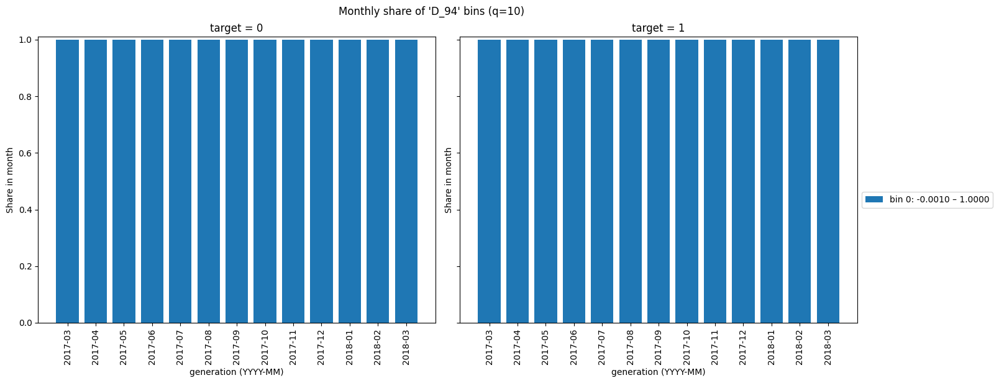

 29%|██▉       | 44/151 [05:36<13:52,  7.78s/it]

-------------------------
feat = D_96
-------------------------


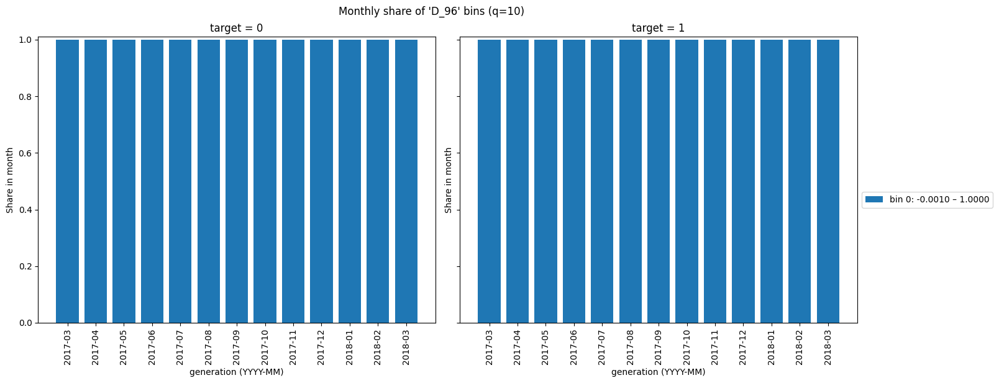

 30%|██▉       | 45/151 [05:44<13:33,  7.67s/it]

-------------------------
feat = D_102
-------------------------


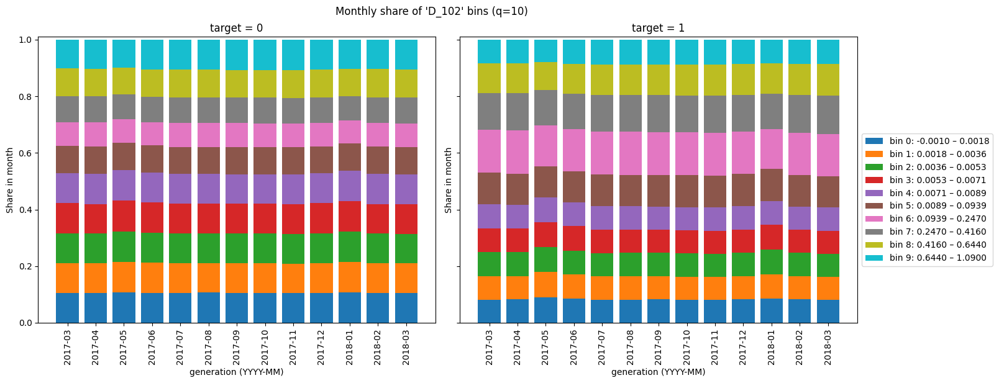

 30%|███       | 46/151 [05:51<13:09,  7.52s/it]

-------------------------
feat = D_104
-------------------------


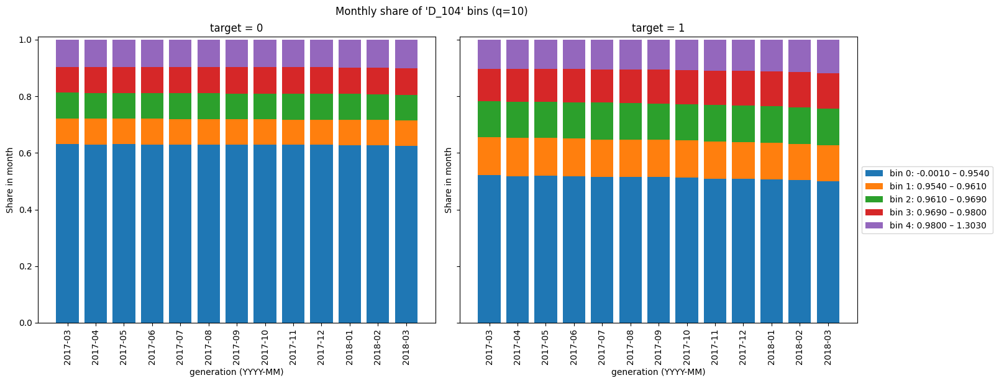

 31%|███       | 47/151 [05:58<12:38,  7.30s/it]

-------------------------
feat = D_105
-------------------------


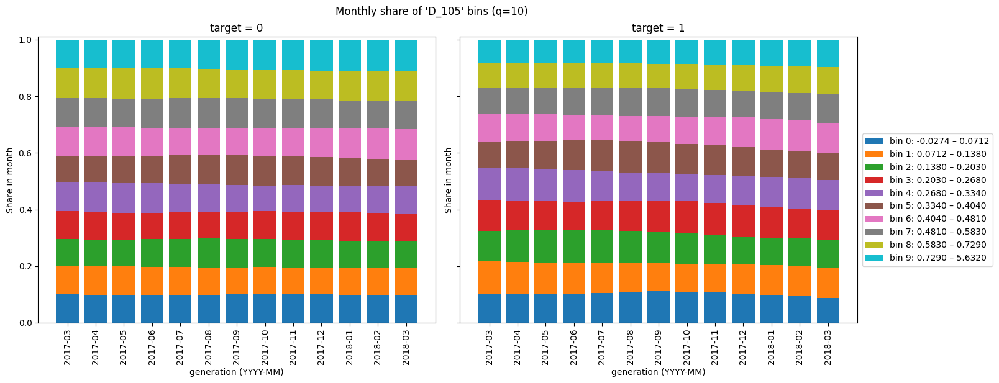

 32%|███▏      | 48/151 [06:05<12:18,  7.17s/it]

-------------------------
feat = D_106
-------------------------


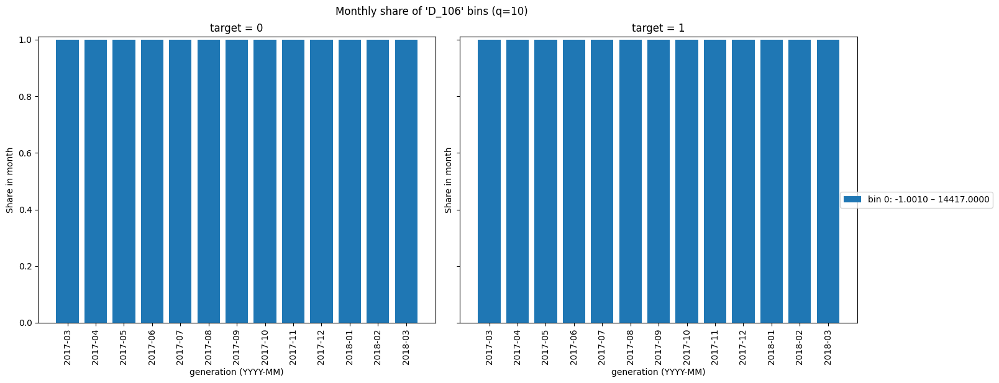

 32%|███▏      | 49/151 [06:12<12:04,  7.10s/it]

-------------------------
feat = D_107
-------------------------


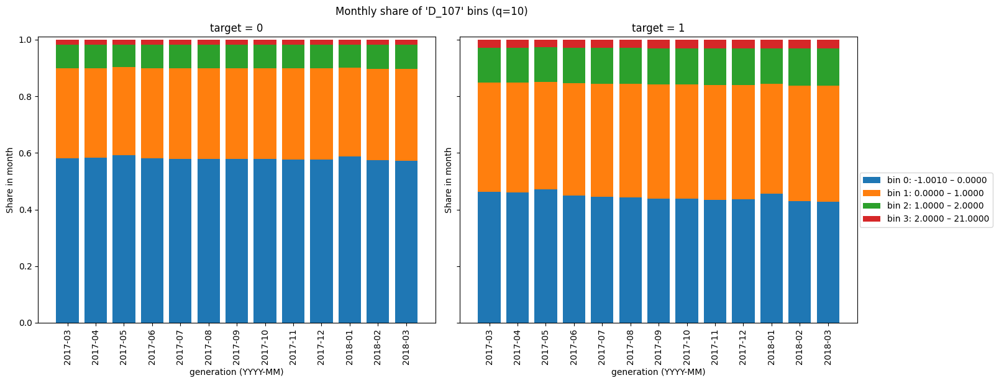

 33%|███▎      | 50/151 [06:19<11:51,  7.04s/it]

-------------------------
feat = D_108
-------------------------


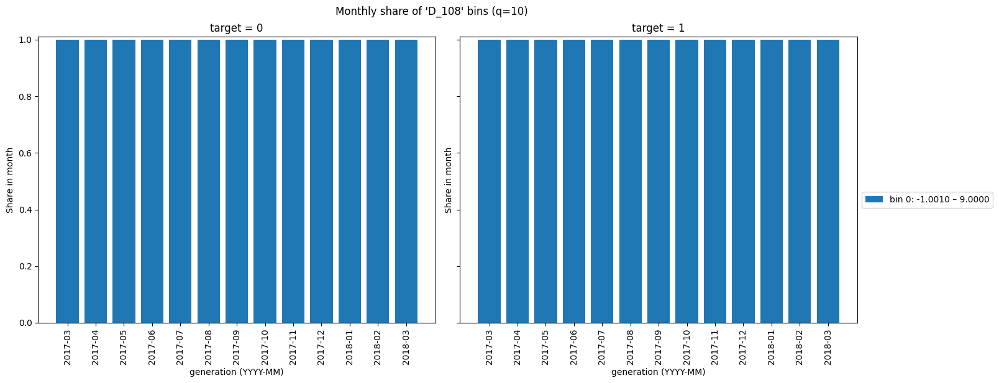

 34%|███▍      | 51/151 [06:25<11:42,  7.02s/it]

-------------------------
feat = D_109
-------------------------


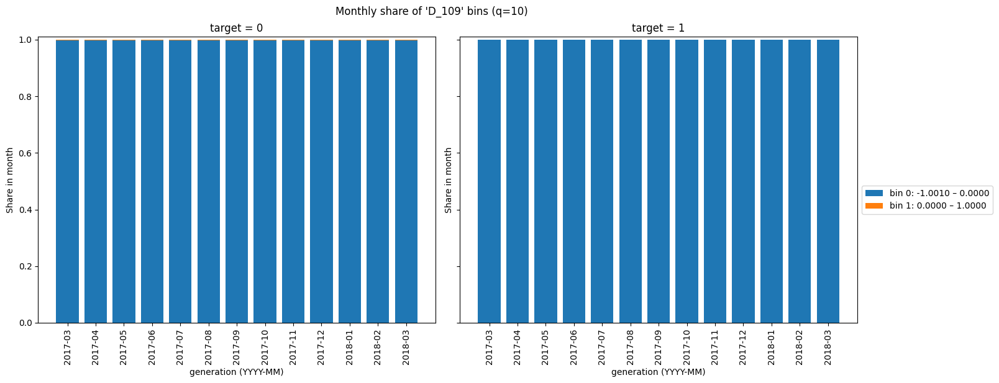

 34%|███▍      | 52/151 [06:33<11:42,  7.10s/it]

-------------------------
feat = D_111
-------------------------


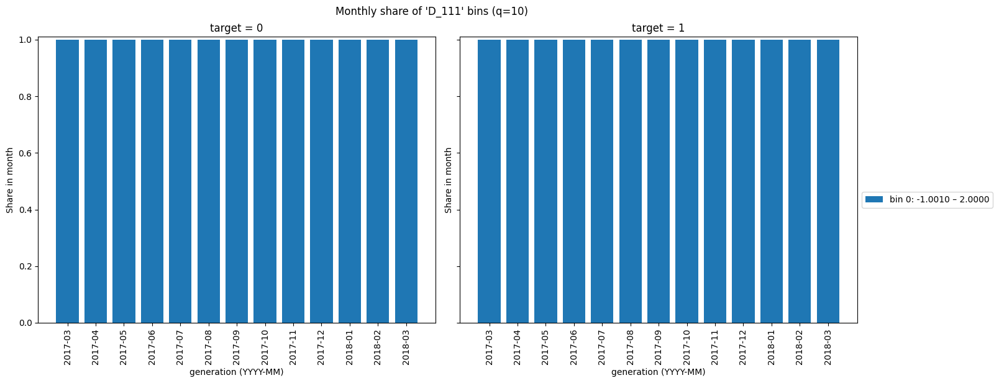

 35%|███▌      | 53/151 [06:40<11:32,  7.07s/it]

-------------------------
feat = D_112
-------------------------


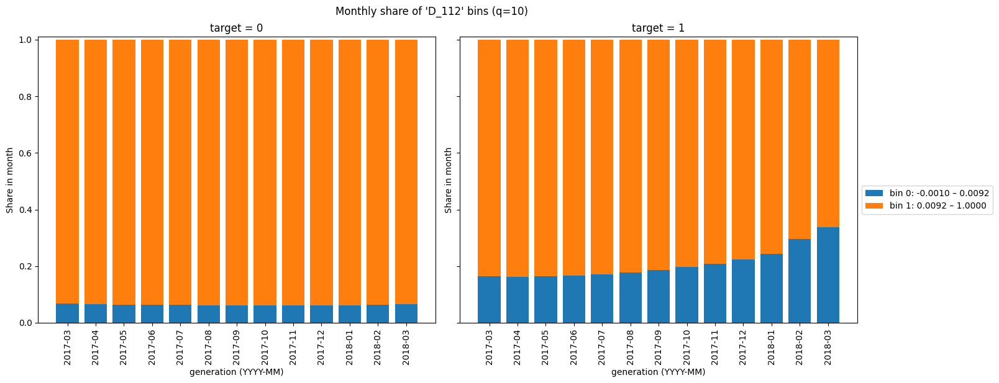

 36%|███▌      | 54/151 [06:47<11:34,  7.16s/it]

-------------------------
feat = D_113
-------------------------


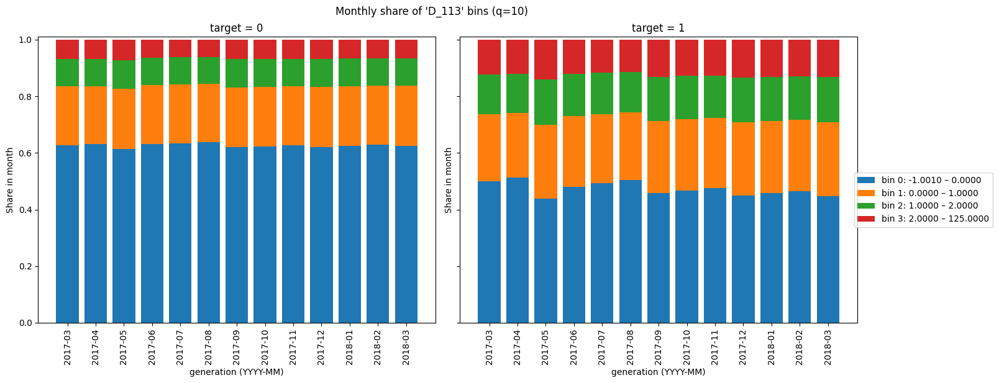

 36%|███▋      | 55/151 [06:54<11:17,  7.05s/it]

-------------------------
feat = D_115
-------------------------


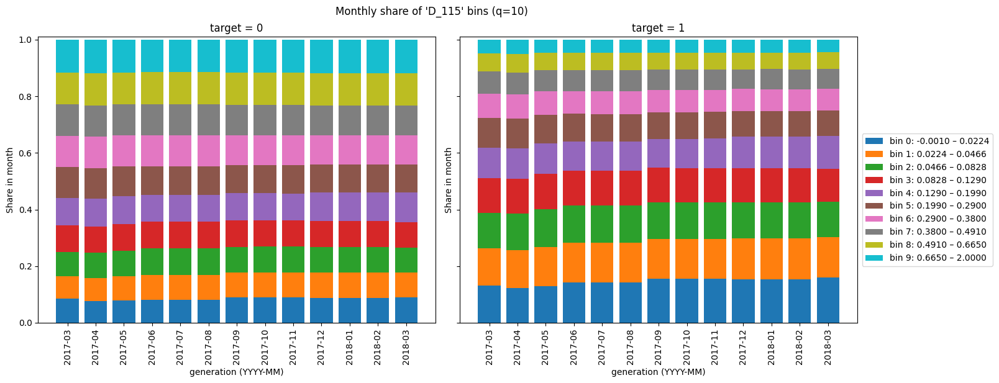

 37%|███▋      | 56/151 [07:01<11:12,  7.08s/it]

-------------------------
feat = D_119
-------------------------


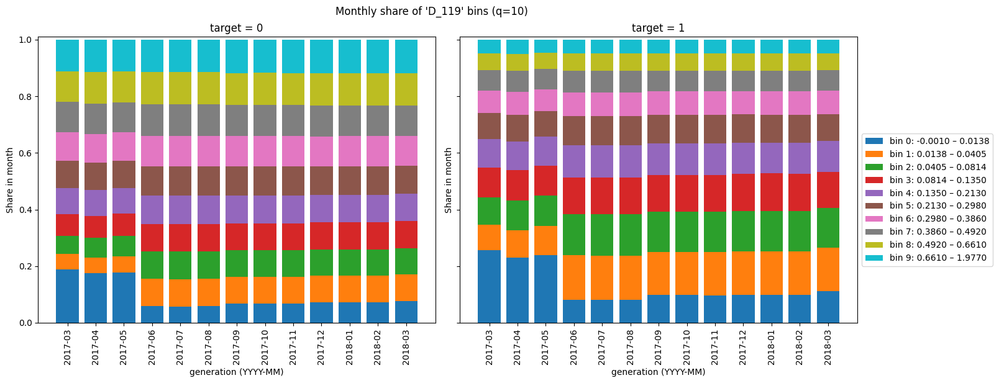

 38%|███▊      | 57/151 [07:08<11:05,  7.08s/it]

-------------------------
feat = D_121
-------------------------


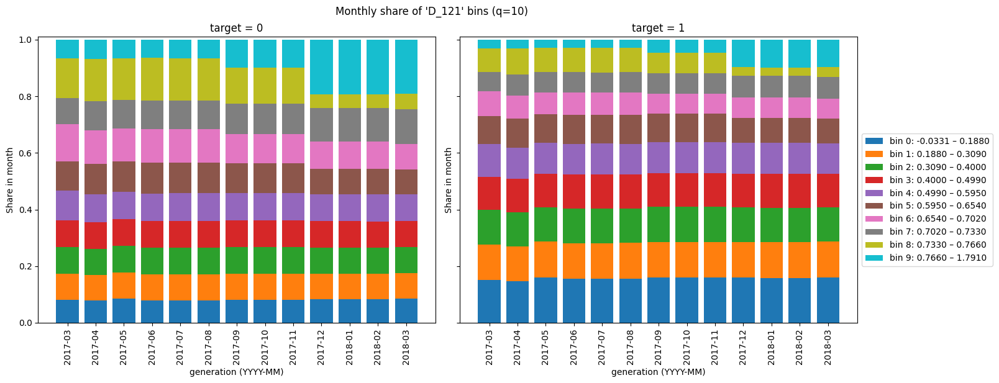

 38%|███▊      | 58/151 [07:16<11:08,  7.18s/it]

-------------------------
feat = D_122
-------------------------


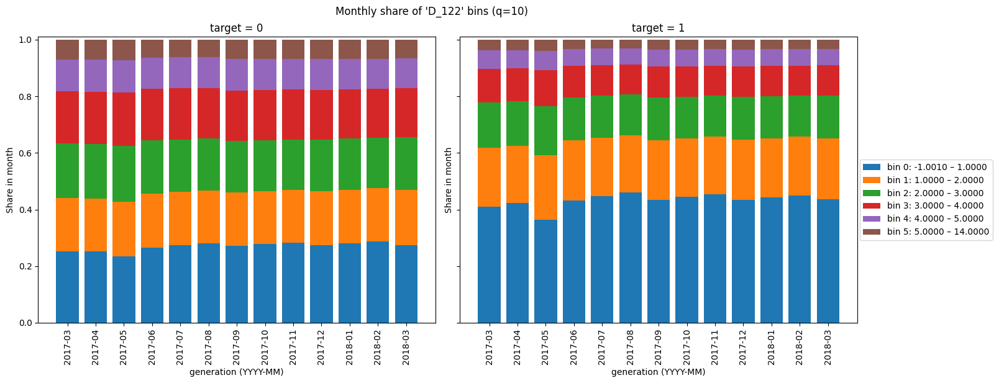

 39%|███▉      | 59/151 [07:22<10:49,  7.06s/it]

-------------------------
feat = D_123
-------------------------


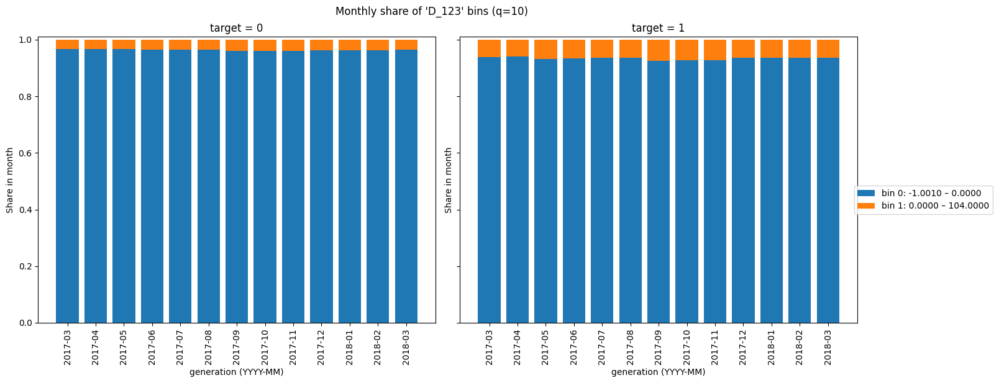

 40%|███▉      | 60/151 [07:29<10:32,  6.95s/it]

-------------------------
feat = D_124
-------------------------


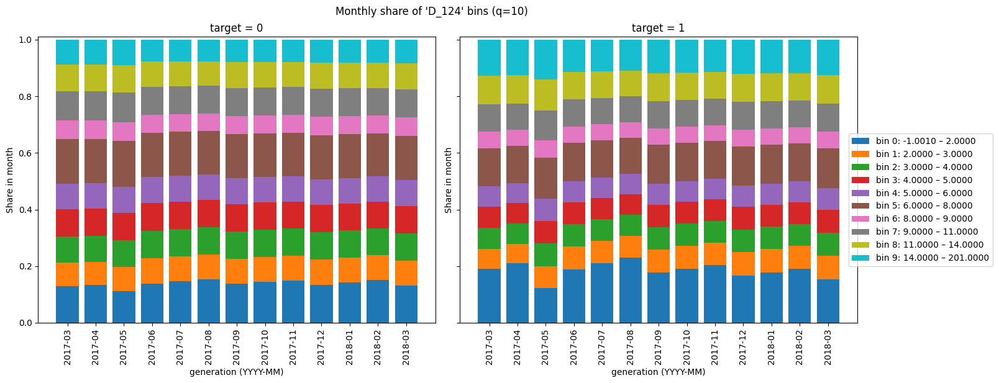

 40%|████      | 61/151 [07:36<10:34,  7.05s/it]

-------------------------
feat = D_125
-------------------------


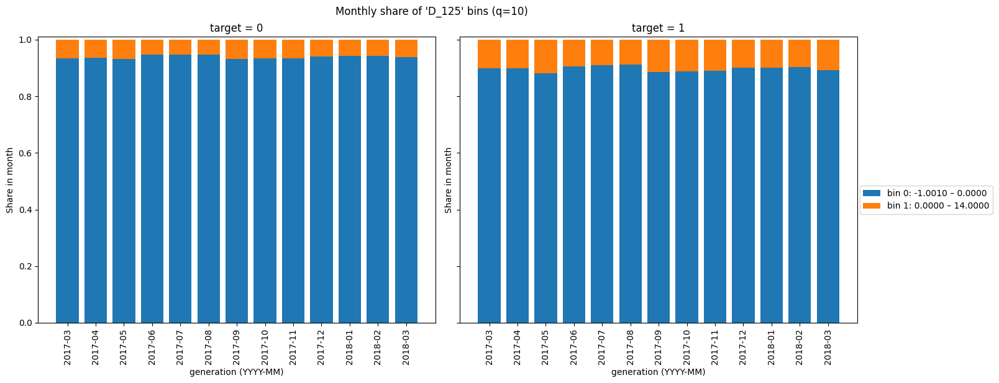

 41%|████      | 62/151 [07:44<10:33,  7.12s/it]

-------------------------
feat = D_127
-------------------------


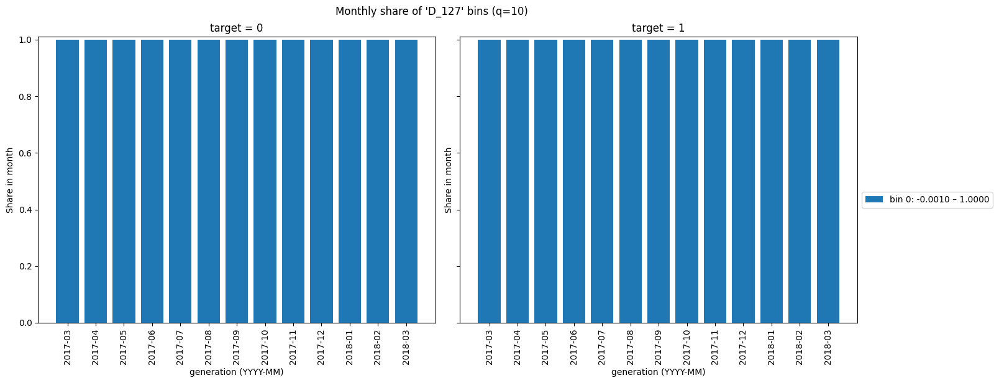

 42%|████▏     | 63/151 [07:51<10:32,  7.19s/it]

-------------------------
feat = D_128
-------------------------


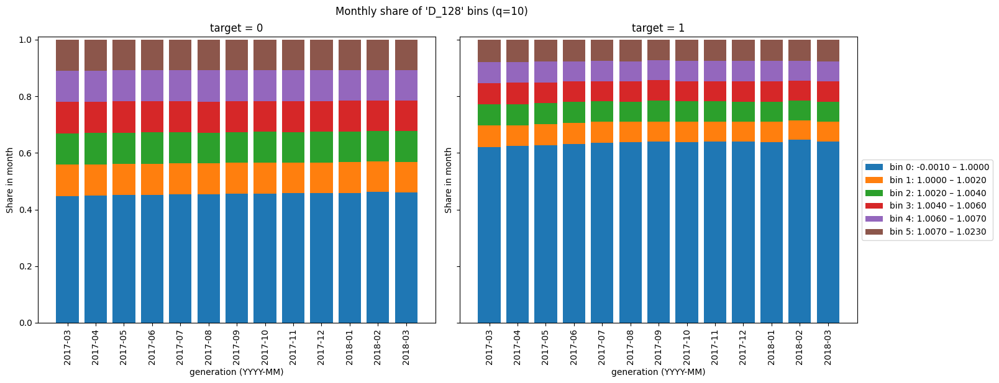

 42%|████▏     | 64/151 [07:59<10:39,  7.36s/it]

-------------------------
feat = D_129
-------------------------


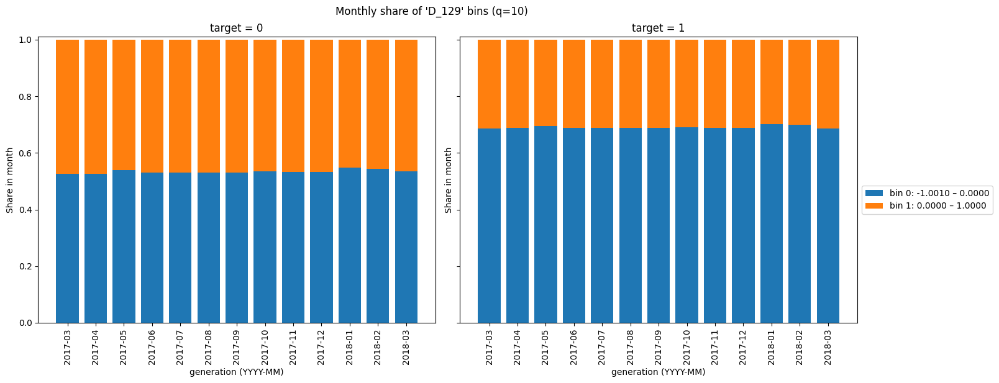

 43%|████▎     | 65/151 [08:06<10:23,  7.25s/it]

-------------------------
feat = D_130
-------------------------


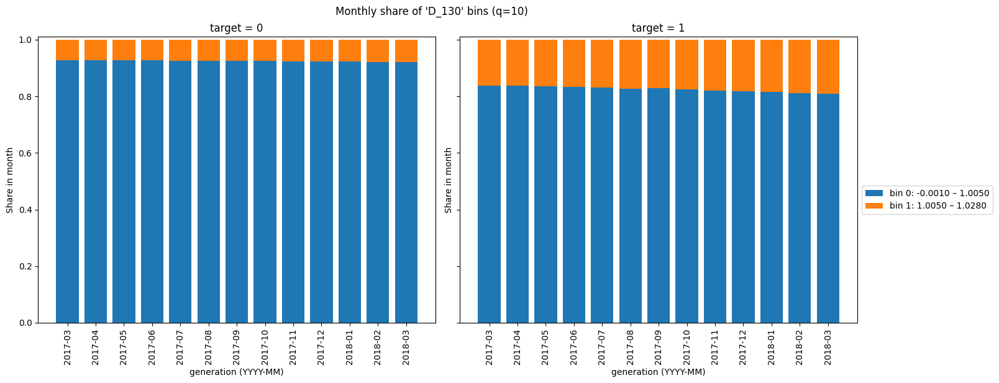

 44%|████▎     | 66/151 [08:13<10:21,  7.31s/it]

-------------------------
feat = D_131
-------------------------


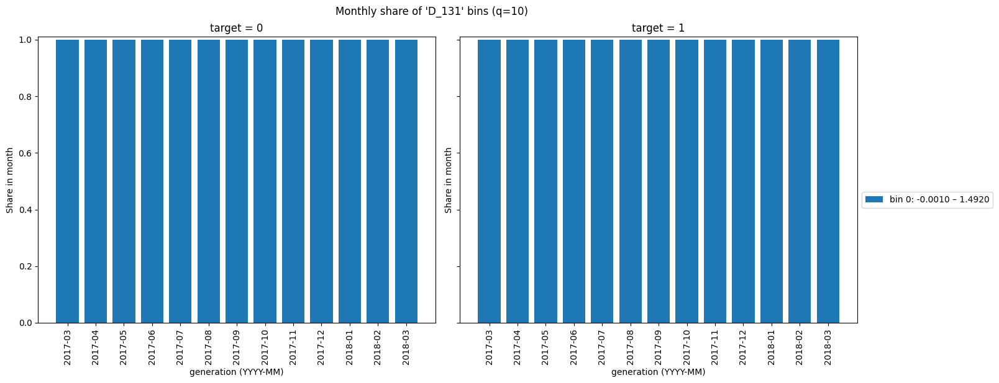

 44%|████▍     | 67/151 [08:21<10:26,  7.46s/it]

-------------------------
feat = D_132
-------------------------


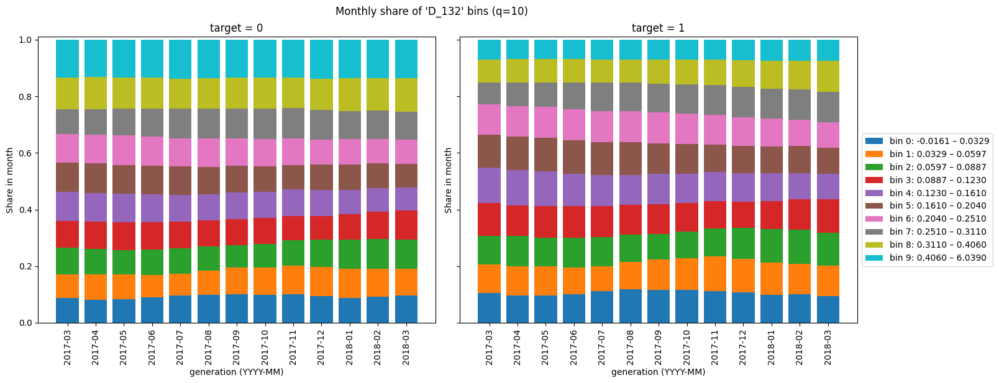

 45%|████▌     | 68/151 [08:28<10:18,  7.45s/it]

-------------------------
feat = D_133
-------------------------


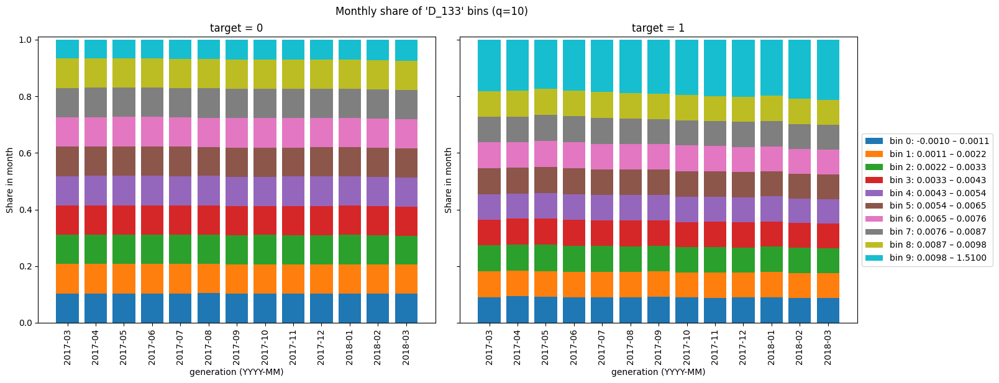

 46%|████▌     | 69/151 [08:36<10:05,  7.38s/it]

-------------------------
feat = D_135
-------------------------


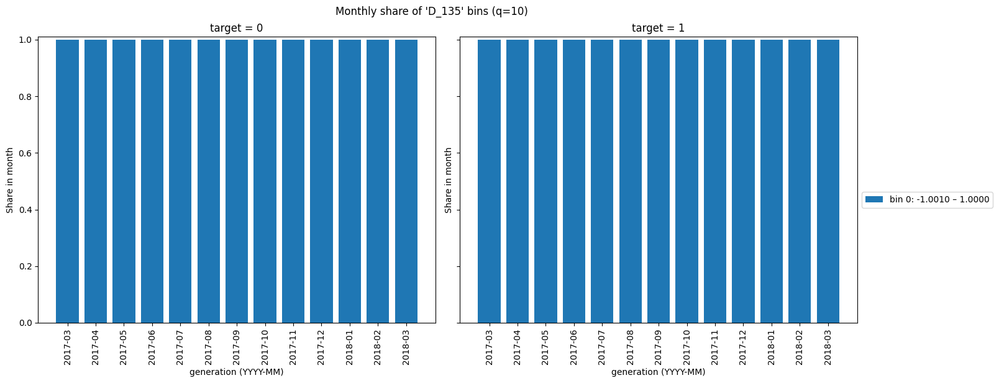

 46%|████▋     | 70/151 [08:43<09:57,  7.37s/it]

-------------------------
feat = D_139
-------------------------


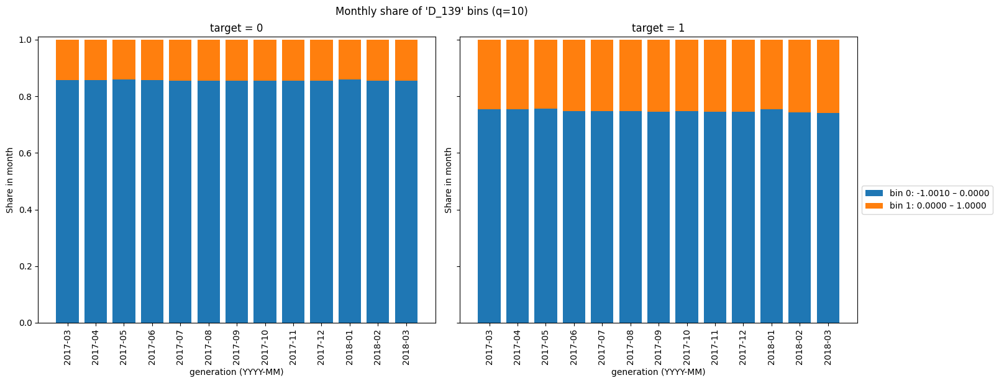

 47%|████▋     | 71/151 [08:50<09:43,  7.29s/it]

-------------------------
feat = D_140
-------------------------


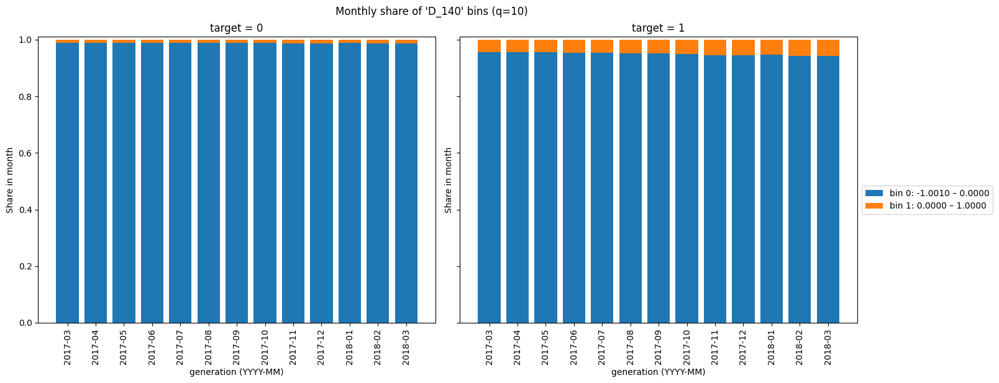

 48%|████▊     | 72/151 [08:58<09:39,  7.33s/it]

-------------------------
feat = D_142
-------------------------


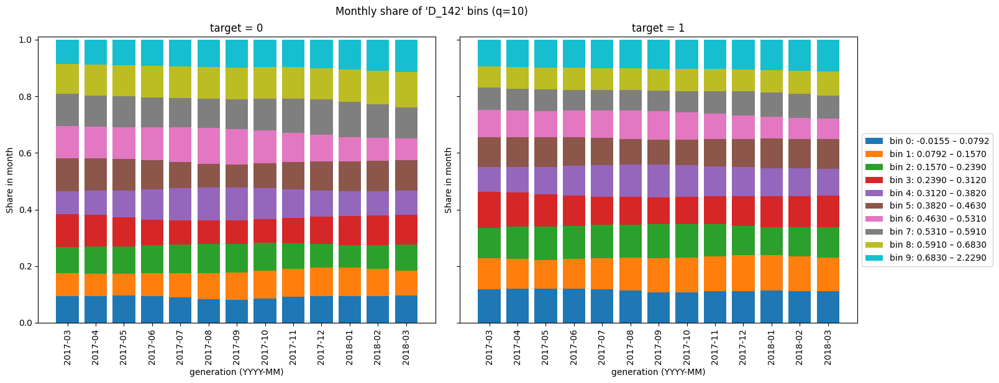

 48%|████▊     | 73/151 [09:06<09:51,  7.58s/it]

-------------------------
feat = D_144
-------------------------


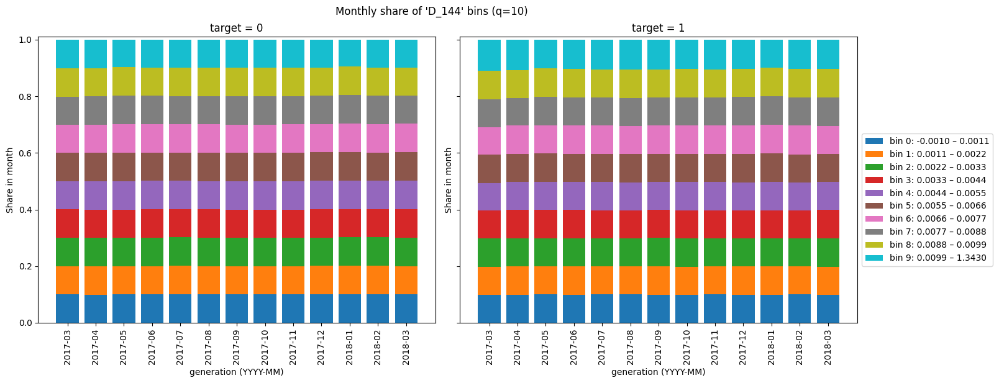

 49%|████▉     | 74/151 [09:13<09:41,  7.55s/it]

-------------------------
feat = D_145
-------------------------


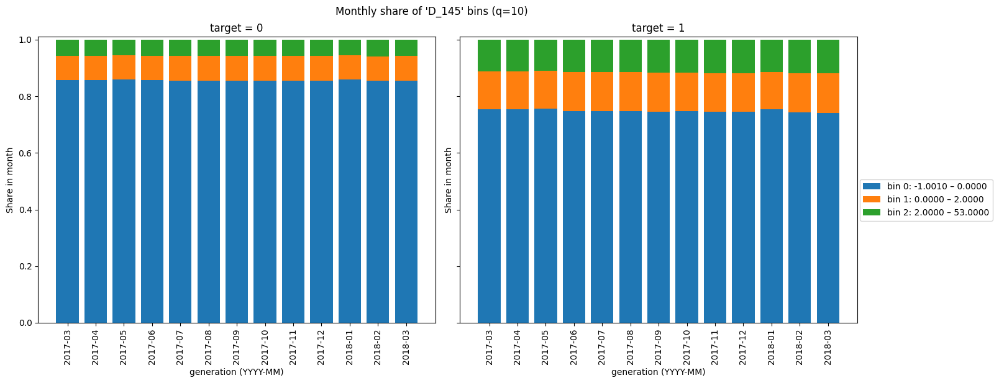

 50%|████▉     | 75/151 [09:21<09:35,  7.57s/it]

-------------------------
feat = S_3
-------------------------


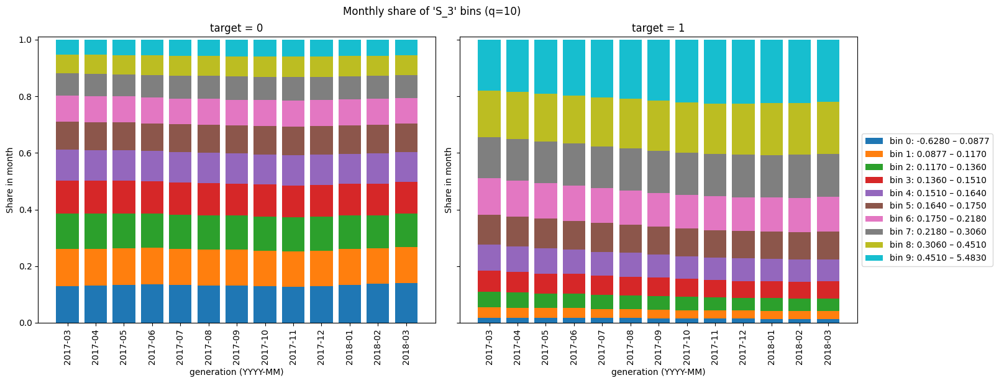

 50%|█████     | 76/151 [09:29<09:41,  7.76s/it]

-------------------------
feat = S_5
-------------------------


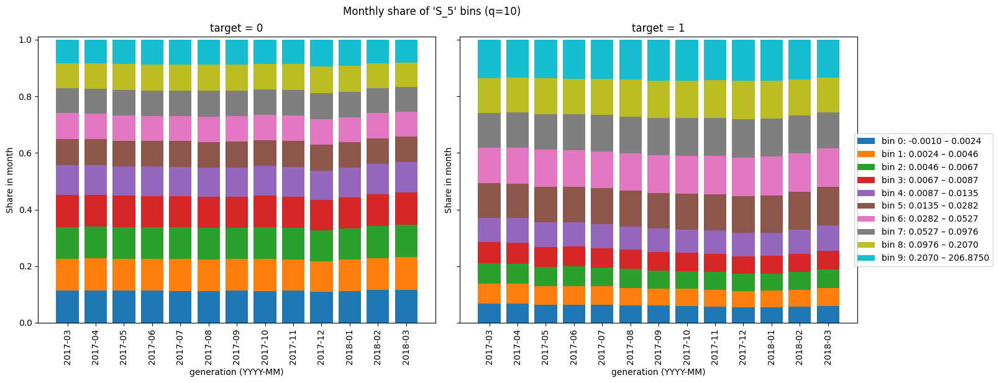

 51%|█████     | 77/151 [09:40<10:44,  8.71s/it]

-------------------------
feat = S_6
-------------------------


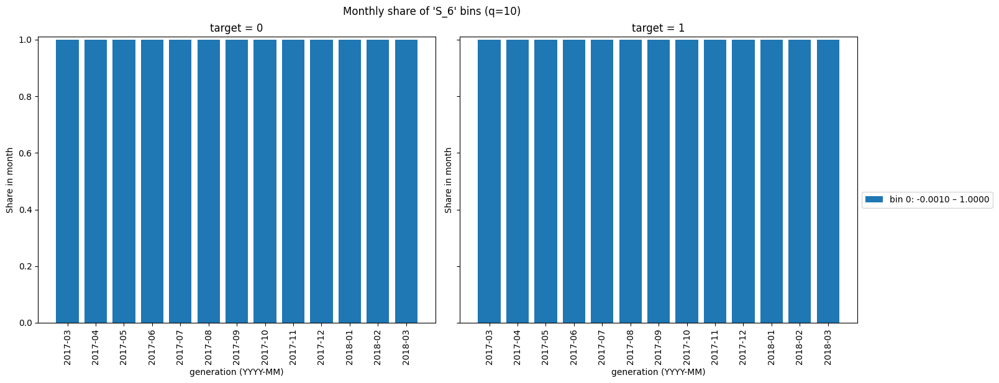

 52%|█████▏    | 78/151 [09:49<10:34,  8.70s/it]

-------------------------
feat = S_8
-------------------------


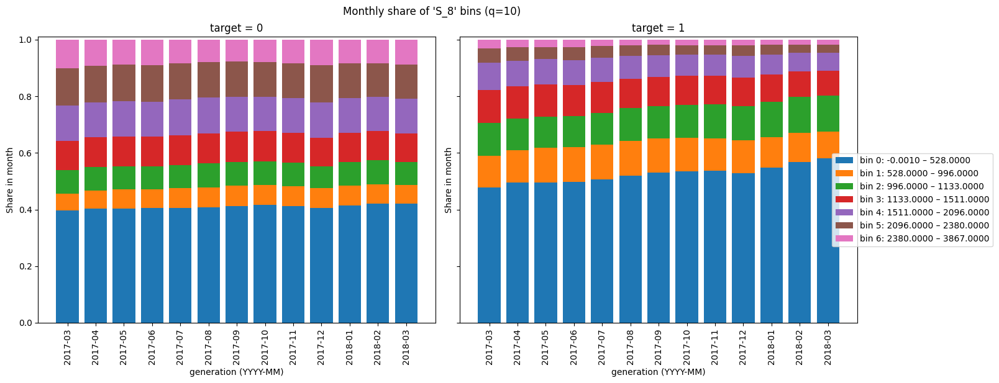

 52%|█████▏    | 79/151 [09:57<10:25,  8.69s/it]

-------------------------
feat = S_9
-------------------------


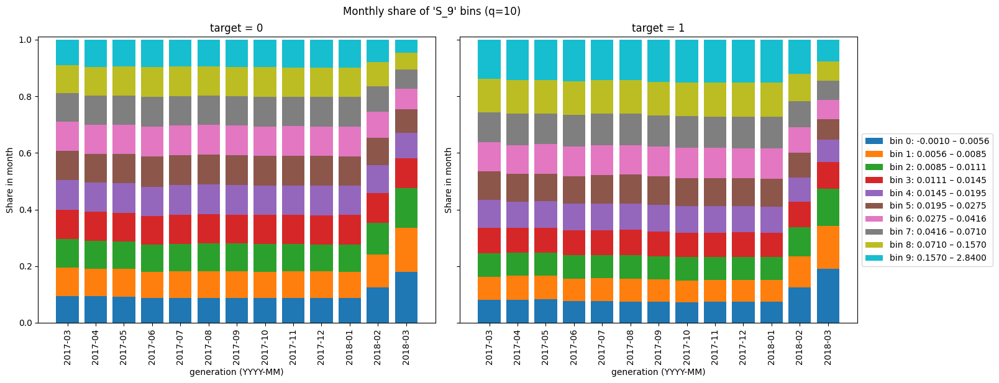

 53%|█████▎    | 80/151 [10:19<15:04, 12.75s/it]

-------------------------
feat = S_12
-------------------------


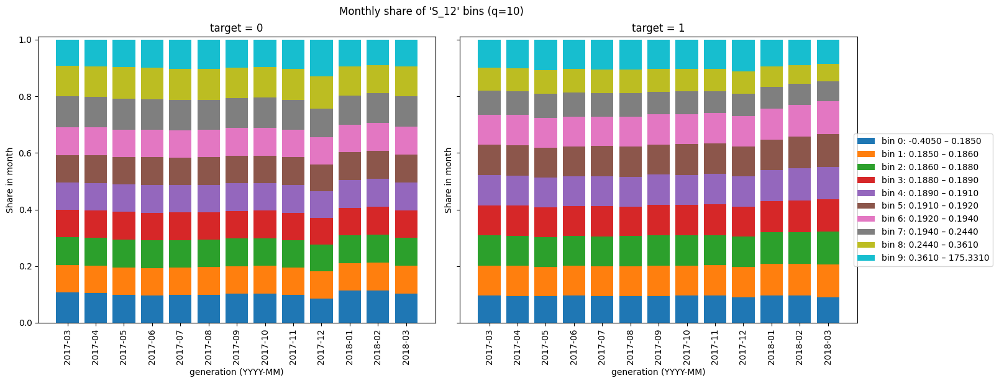

 54%|█████▎    | 81/151 [10:33<15:11, 13.03s/it]

-------------------------
feat = S_13
-------------------------


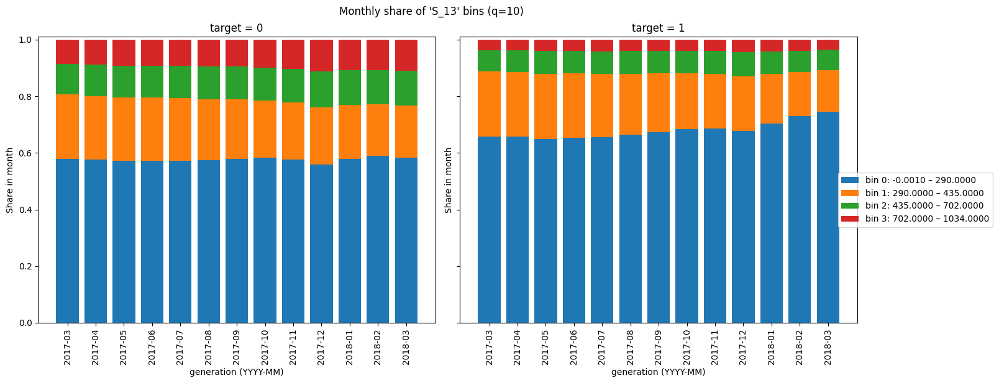

 54%|█████▍    | 82/151 [10:45<14:37, 12.72s/it]

-------------------------
feat = S_15
-------------------------


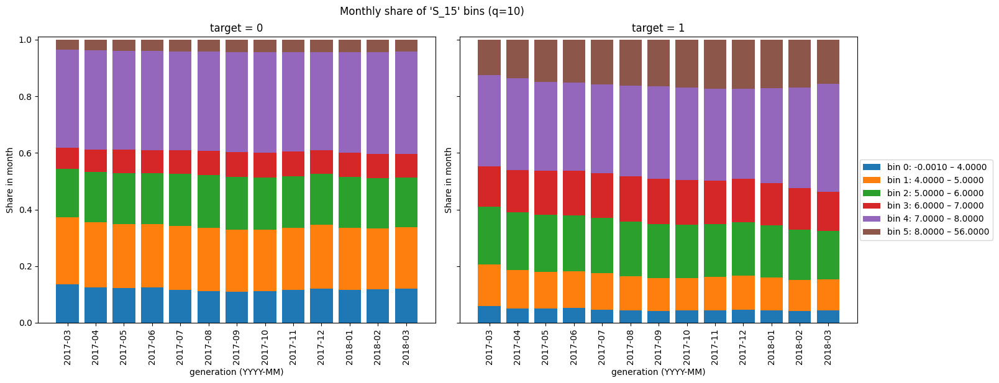

 55%|█████▍    | 83/151 [10:54<13:01, 11.49s/it]

-------------------------
feat = S_16
-------------------------


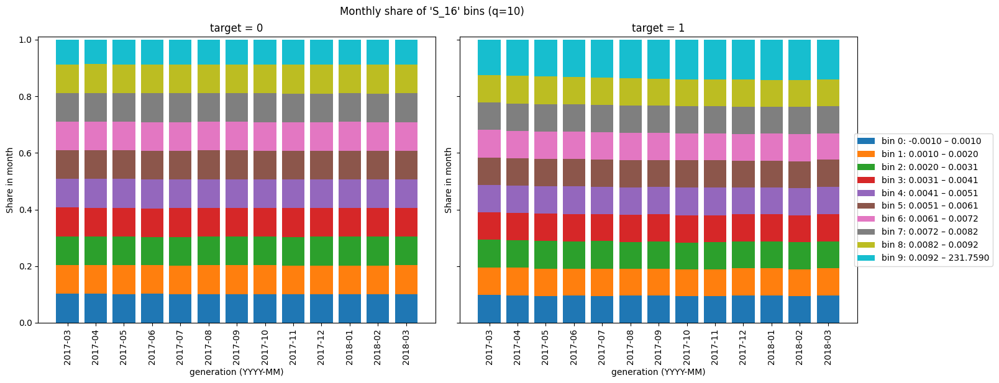

 56%|█████▌    | 84/151 [11:05<12:42, 11.38s/it]

-------------------------
feat = S_17
-------------------------


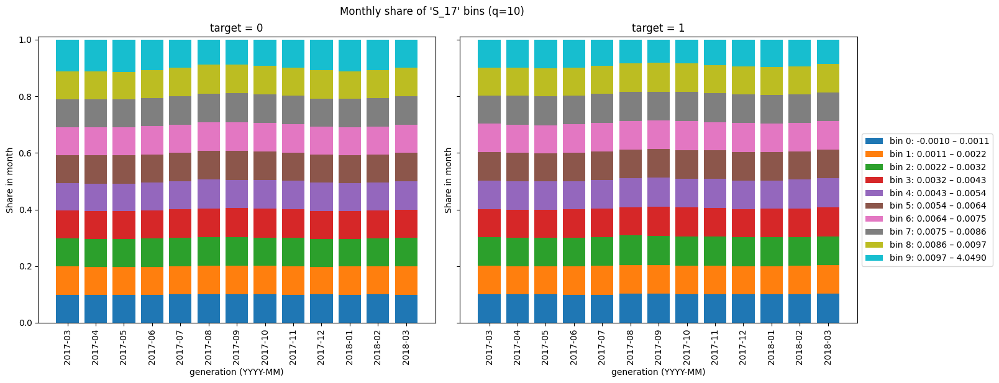

 56%|█████▋    | 85/151 [11:16<12:29, 11.35s/it]

-------------------------
feat = S_18
-------------------------


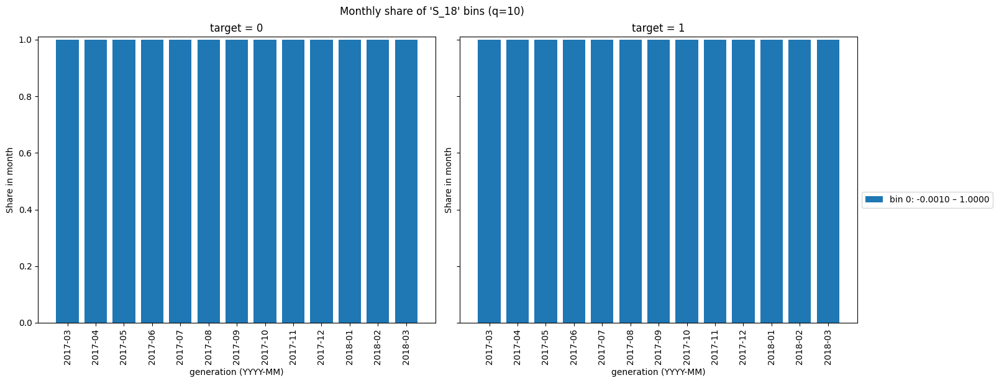

 57%|█████▋    | 86/151 [11:27<12:05, 11.16s/it]

-------------------------
feat = S_19
-------------------------


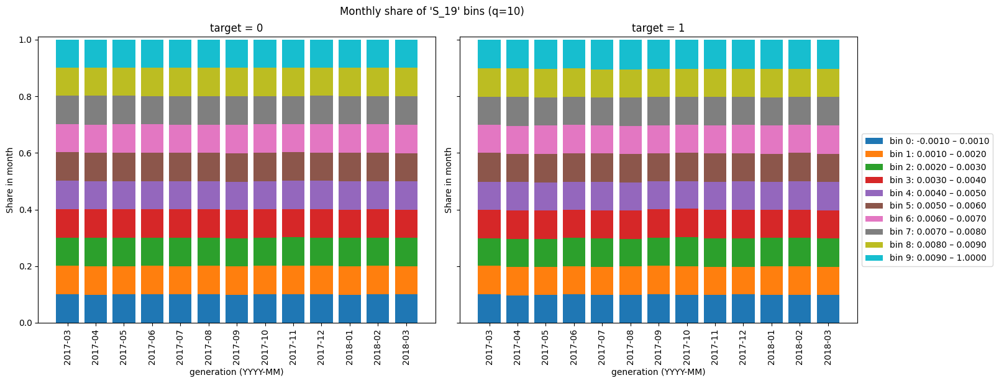

 58%|█████▊    | 87/151 [11:38<11:55, 11.18s/it]

-------------------------
feat = S_20
-------------------------


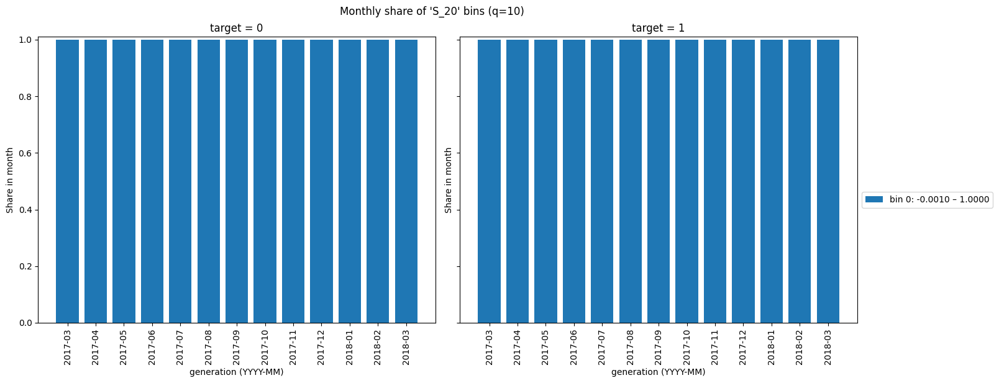

 58%|█████▊    | 88/151 [11:48<11:25, 10.87s/it]

-------------------------
feat = S_22
-------------------------


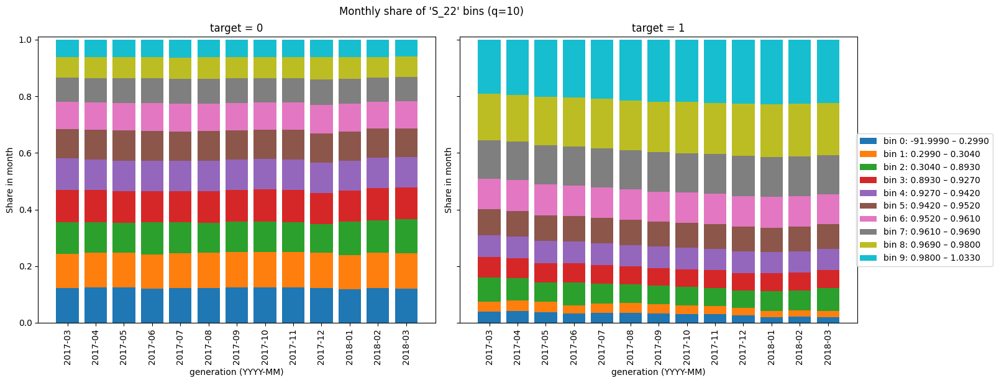

 59%|█████▉    | 89/151 [11:59<11:15, 10.89s/it]

-------------------------
feat = S_23
-------------------------


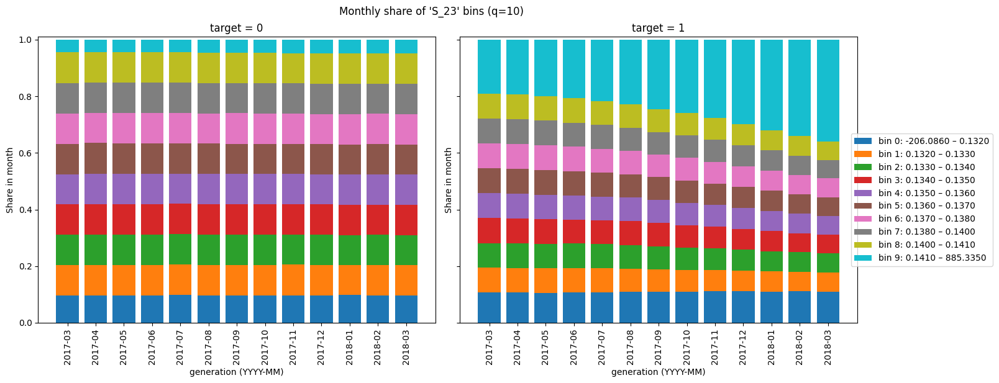

 60%|█████▉    | 90/151 [12:09<10:41, 10.52s/it]

-------------------------
feat = S_25
-------------------------


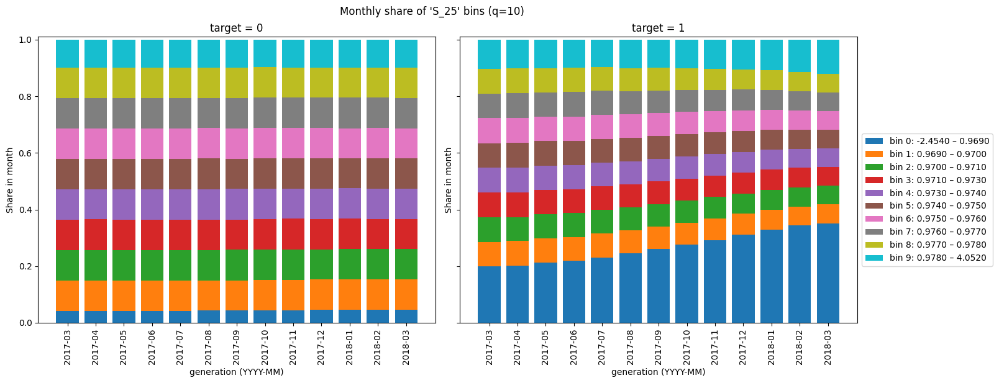

 60%|██████    | 91/151 [12:20<10:41, 10.69s/it]

-------------------------
feat = S_26
-------------------------


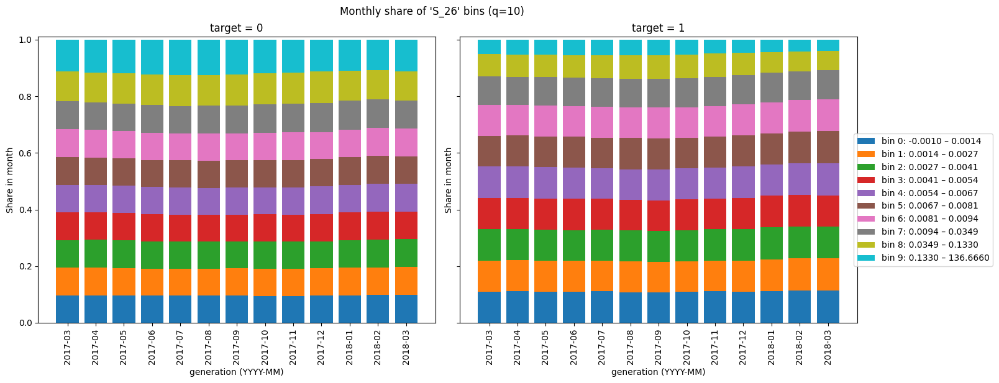

 61%|██████    | 92/151 [12:27<09:33,  9.73s/it]

-------------------------
feat = S_27
-------------------------


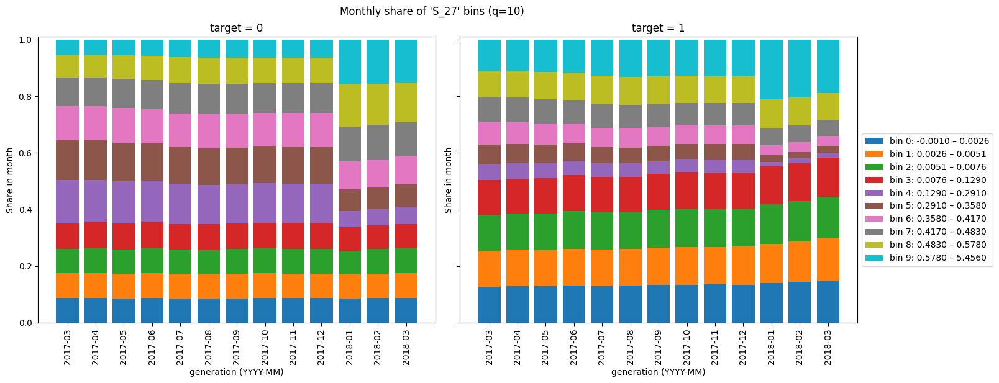

 62%|██████▏   | 93/151 [12:36<09:03,  9.37s/it]

-------------------------
feat = B_1
-------------------------


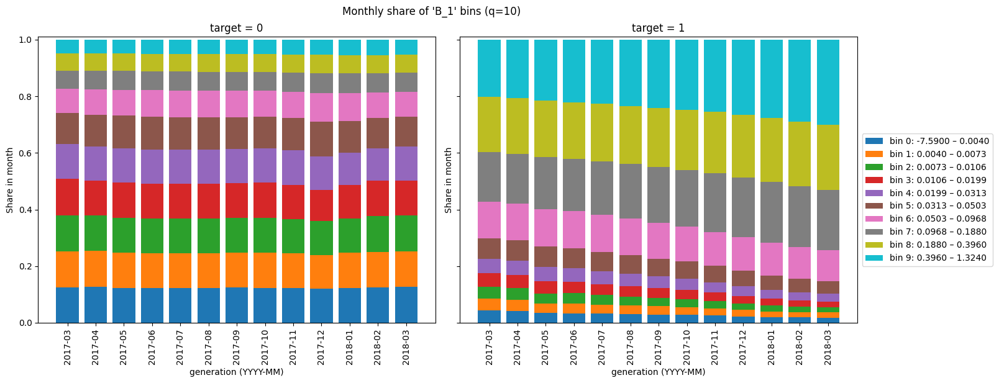

 62%|██████▏   | 94/151 [12:49<10:03, 10.59s/it]

-------------------------
feat = B_2
-------------------------


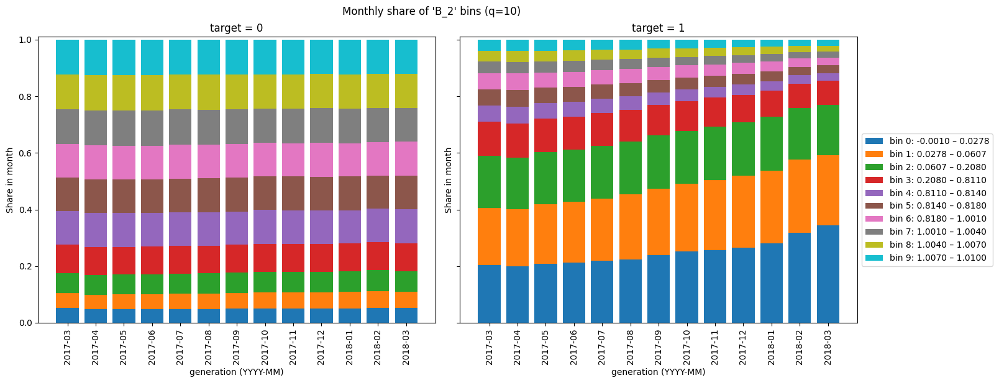

 63%|██████▎   | 95/151 [13:11<13:01, 13.95s/it]

-------------------------
feat = B_3
-------------------------


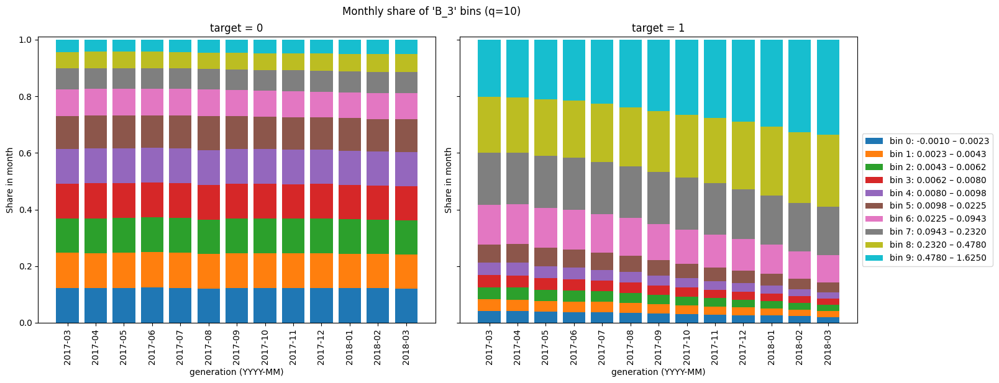

 64%|██████▎   | 96/151 [13:29<13:48, 15.06s/it]

-------------------------
feat = B_4
-------------------------


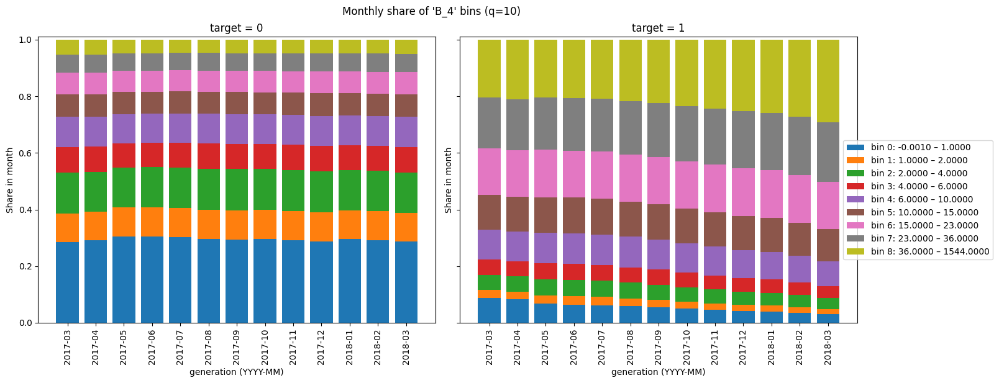

 64%|██████▍   | 97/151 [13:40<12:31, 13.91s/it]

-------------------------
feat = B_5
-------------------------


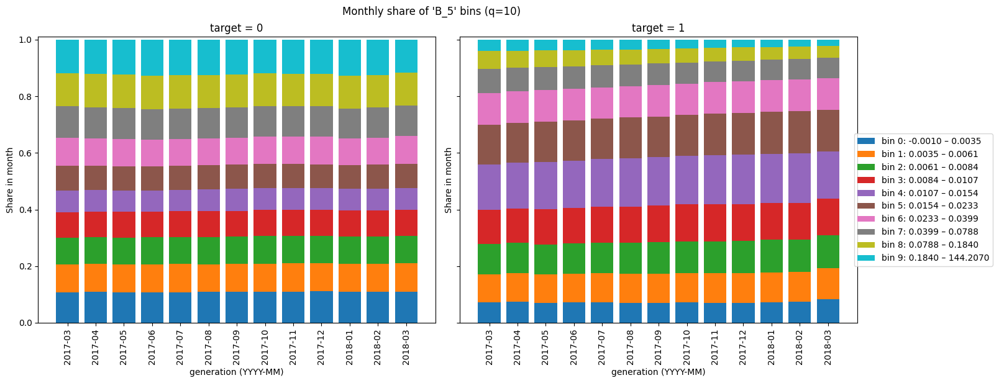

 65%|██████▍   | 98/151 [13:50<11:07, 12.60s/it]

-------------------------
feat = B_6
-------------------------


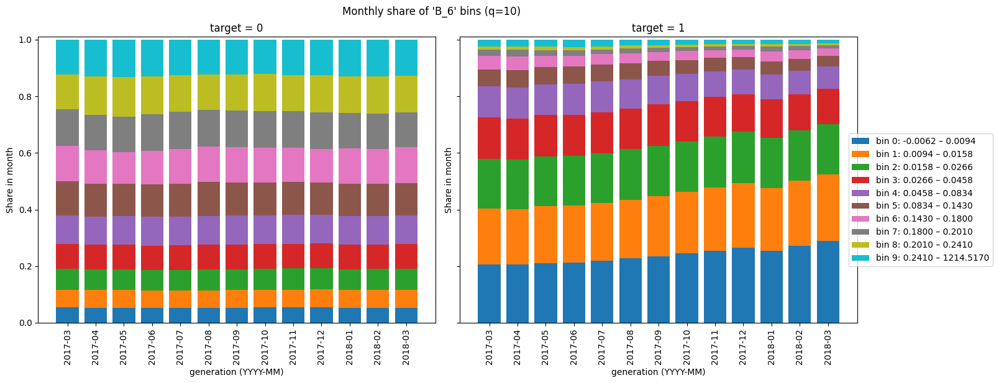

 66%|██████▌   | 99/151 [13:59<10:08, 11.71s/it]

-------------------------
feat = B_7
-------------------------


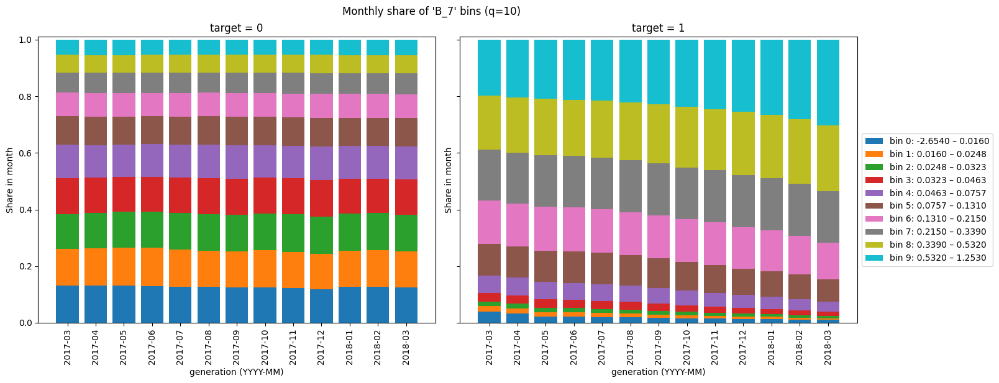

 66%|██████▌   | 100/151 [14:09<09:23, 11.05s/it]

-------------------------
feat = B_8
-------------------------


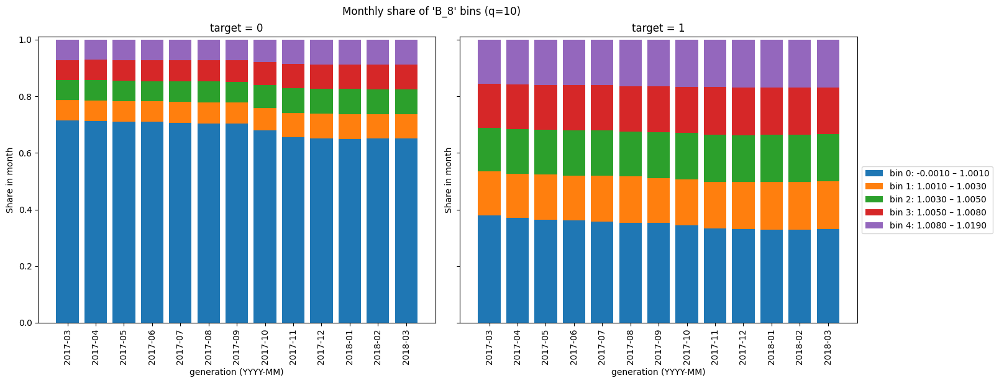

 67%|██████▋   | 101/151 [14:18<08:51, 10.62s/it]

-------------------------
feat = B_9
-------------------------


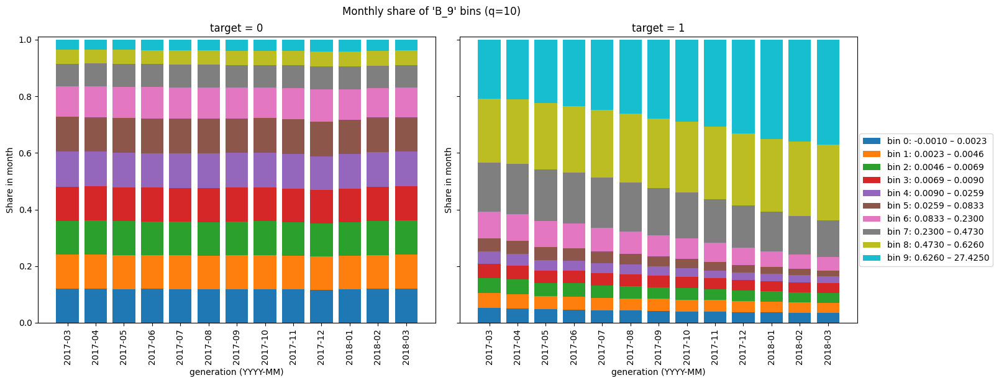

 68%|██████▊   | 102/151 [14:29<08:44, 10.70s/it]

-------------------------
feat = B_10
-------------------------


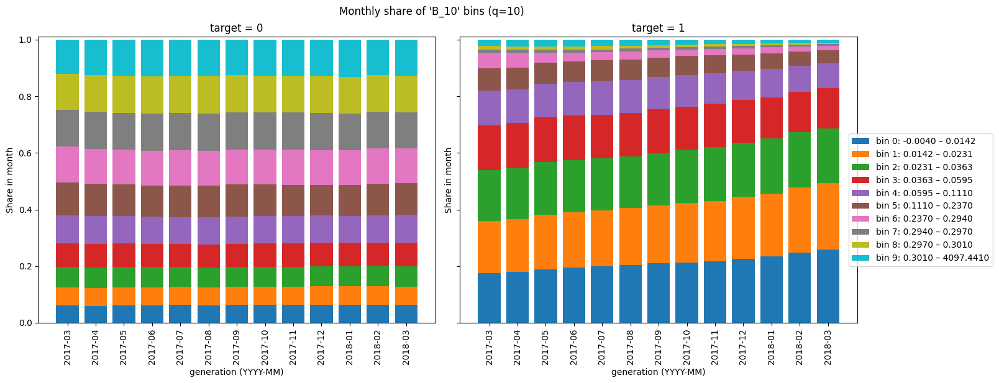

 68%|██████▊   | 103/151 [14:40<08:30, 10.63s/it]

-------------------------
feat = B_12
-------------------------


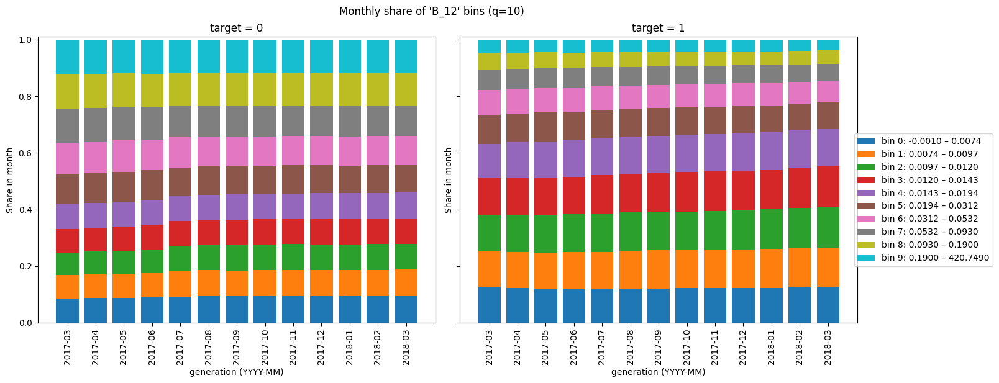

 69%|██████▉   | 104/151 [14:50<08:14, 10.51s/it]

-------------------------
feat = B_13
-------------------------


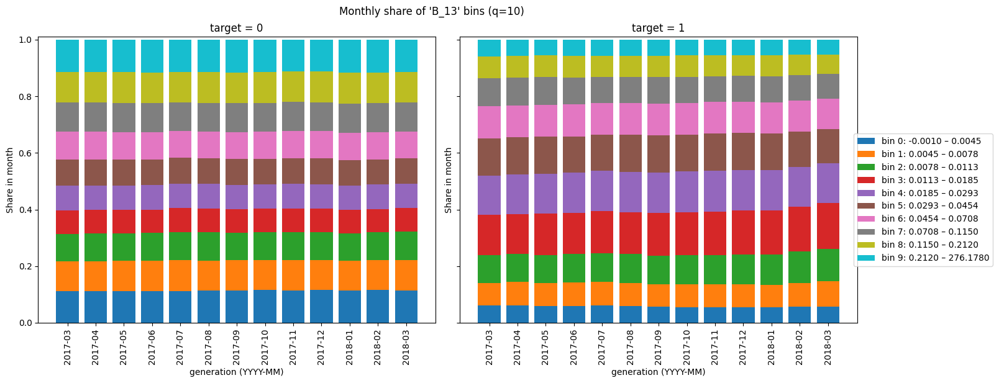

 70%|██████▉   | 105/151 [15:01<08:16, 10.80s/it]

-------------------------
feat = B_14
-------------------------


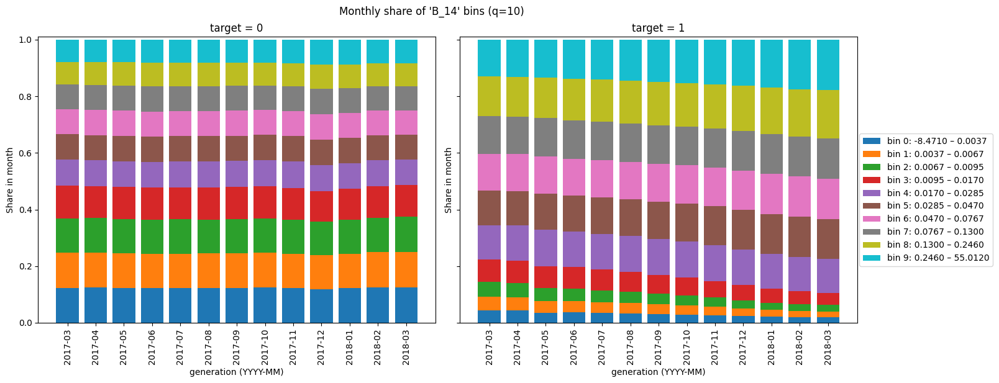

 70%|███████   | 106/151 [15:12<07:56, 10.60s/it]

-------------------------
feat = B_16
-------------------------


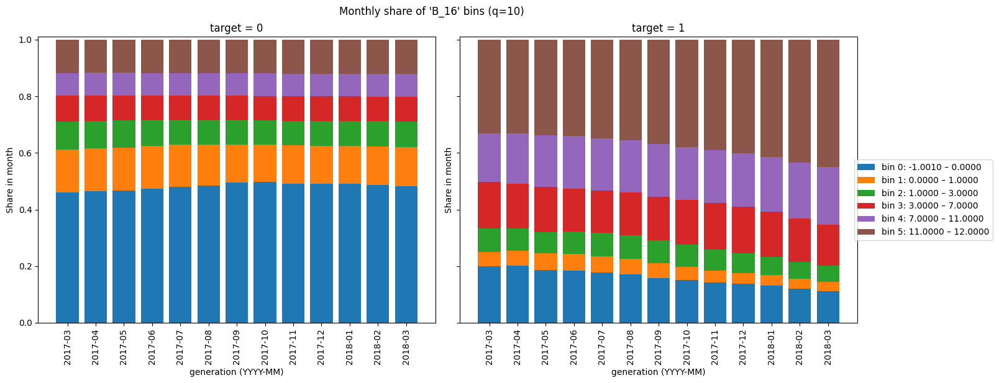

 71%|███████   | 107/151 [15:22<07:41, 10.49s/it]

-------------------------
feat = B_17
-------------------------


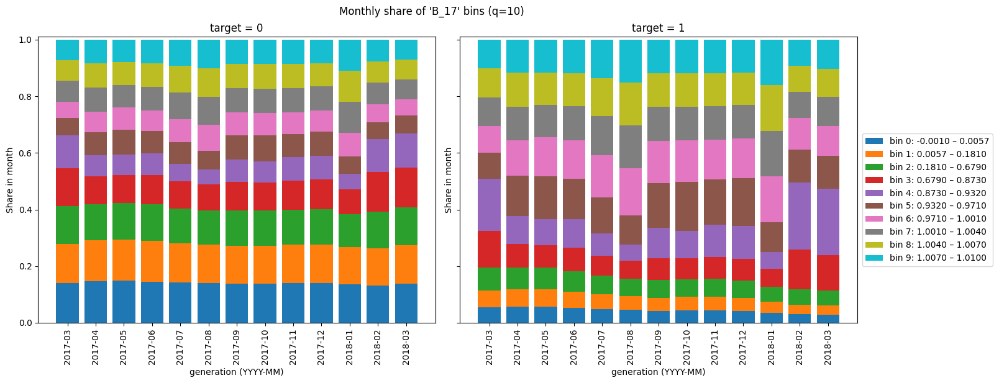

 72%|███████▏  | 108/151 [15:33<07:37, 10.63s/it]

-------------------------
feat = B_18
-------------------------


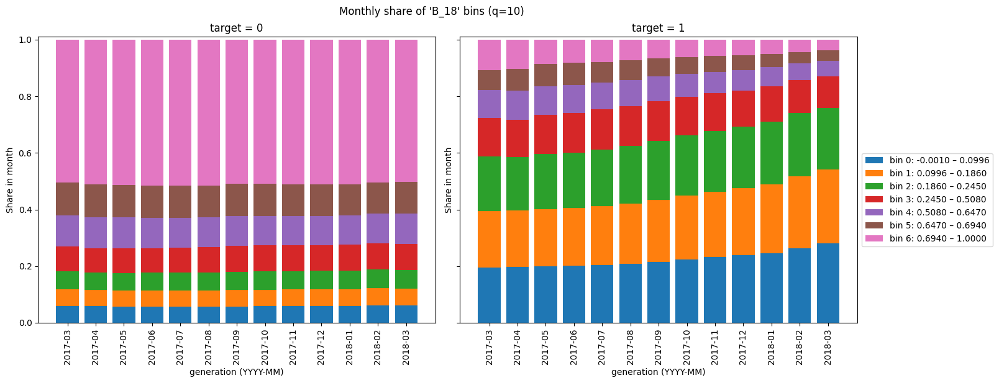

 72%|███████▏  | 109/151 [15:43<07:22, 10.53s/it]

-------------------------
feat = B_19
-------------------------


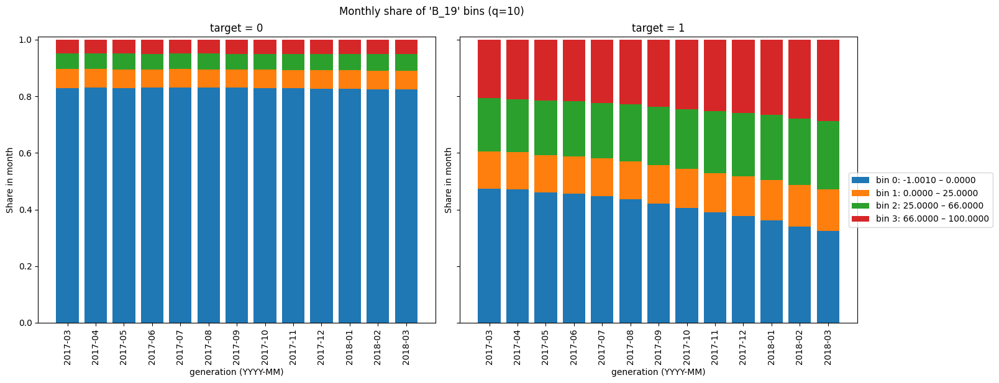

 73%|███████▎  | 110/151 [15:53<07:03, 10.34s/it]

-------------------------
feat = B_20
-------------------------


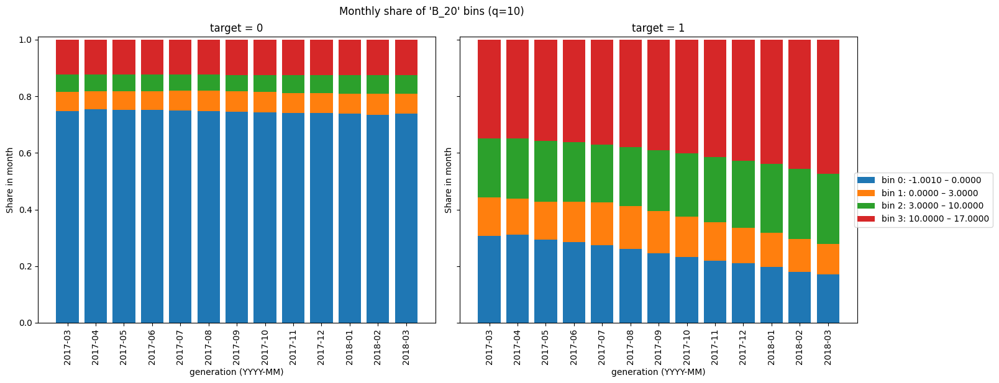

 74%|███████▎  | 111/151 [16:03<06:45, 10.13s/it]

-------------------------
feat = B_21
-------------------------


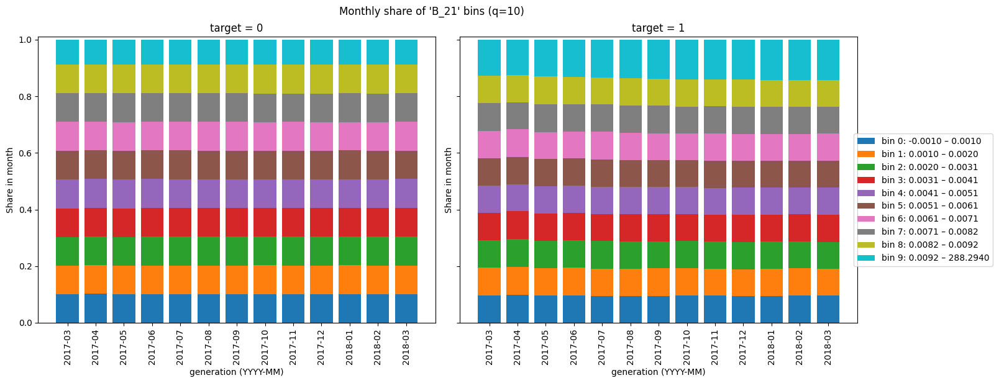

 74%|███████▍  | 112/151 [16:13<06:39, 10.23s/it]

-------------------------
feat = B_22
-------------------------


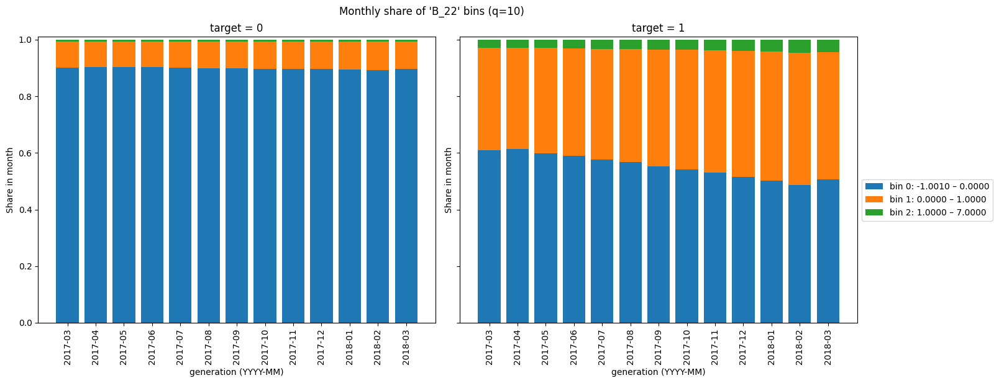

 75%|███████▍  | 113/151 [16:23<06:24, 10.13s/it]

-------------------------
feat = B_24
-------------------------


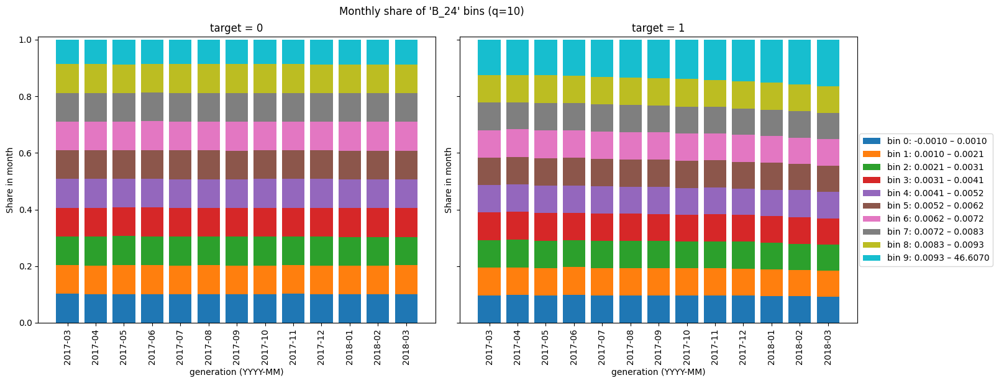

 75%|███████▌  | 114/151 [16:33<06:16, 10.17s/it]

-------------------------
feat = B_25
-------------------------


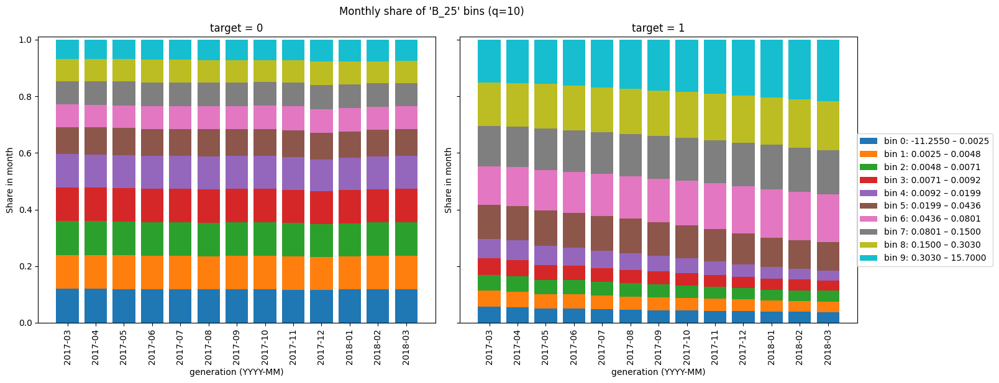

 76%|███████▌  | 115/151 [16:44<06:09, 10.28s/it]

-------------------------
feat = B_26
-------------------------


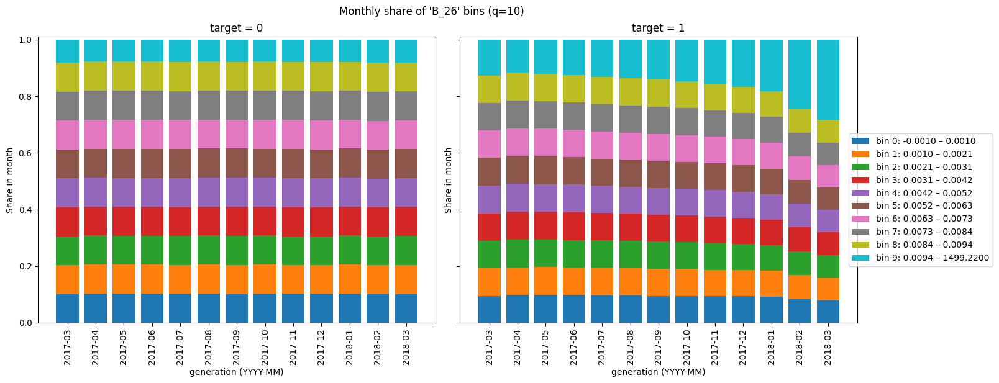

 77%|███████▋  | 116/151 [16:54<06:02, 10.35s/it]

-------------------------
feat = B_27
-------------------------


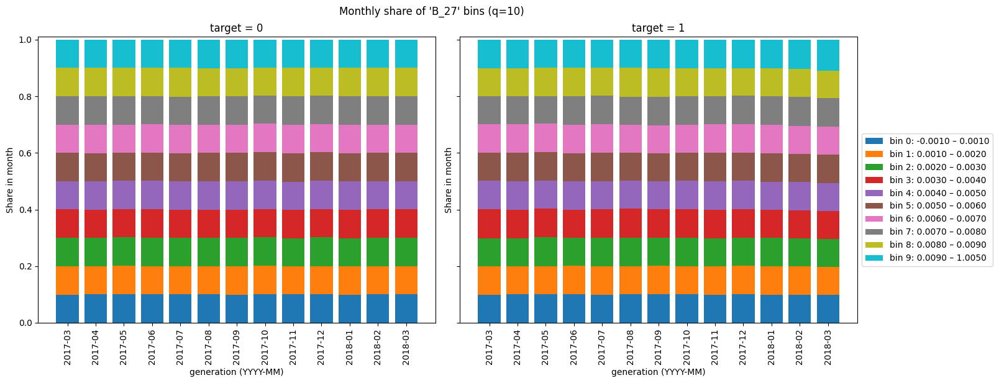

 77%|███████▋  | 117/151 [17:05<05:58, 10.54s/it]

-------------------------
feat = B_28
-------------------------


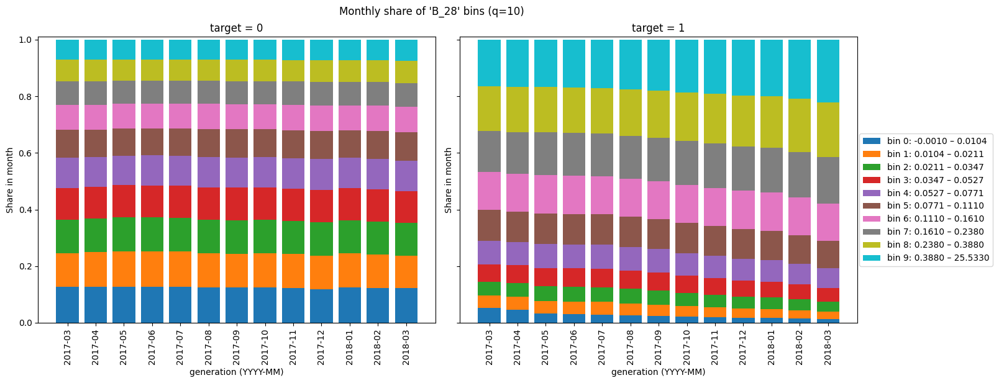

 78%|███████▊  | 118/151 [17:15<05:43, 10.41s/it]

-------------------------
feat = B_29
-------------------------


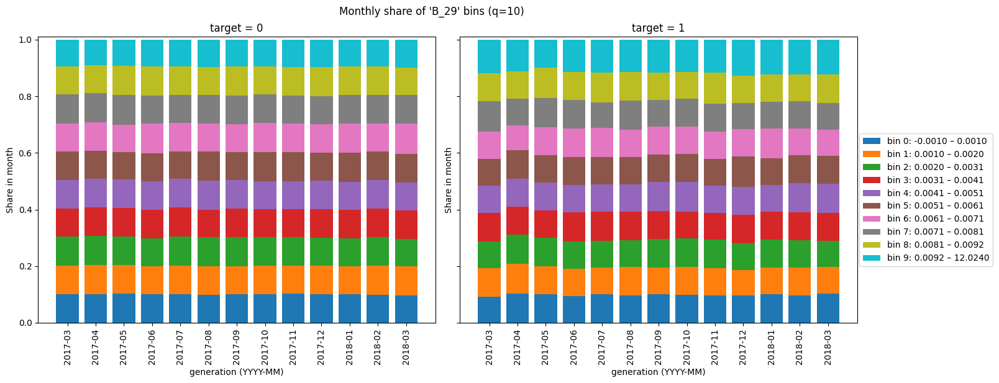

 79%|███████▉  | 119/151 [17:26<05:33, 10.44s/it]

-------------------------
feat = B_31
-------------------------


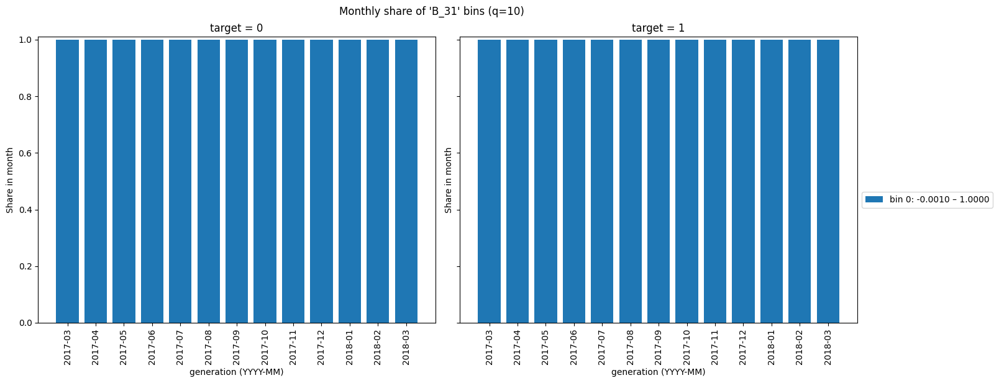

 79%|███████▉  | 120/151 [17:36<05:18, 10.28s/it]

-------------------------
feat = B_32
-------------------------


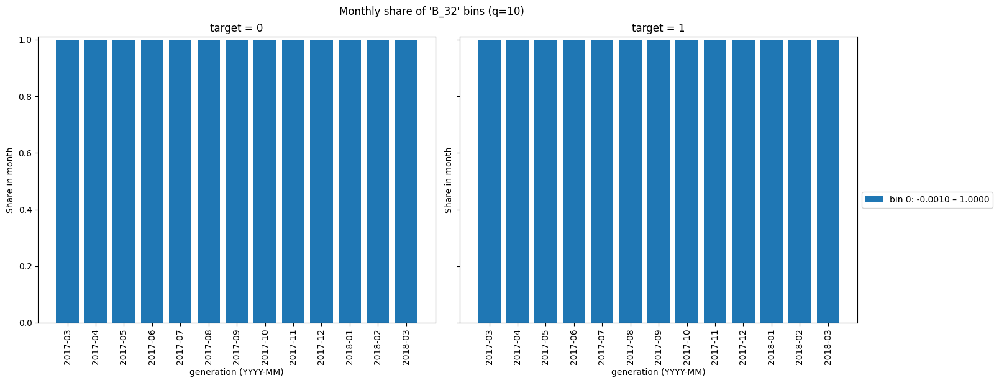

 80%|████████  | 121/151 [17:46<05:06, 10.23s/it]

-------------------------
feat = B_36
-------------------------


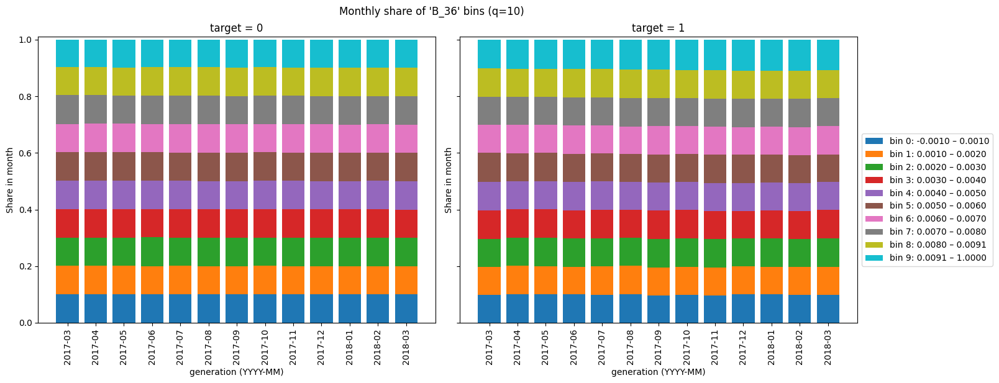

 81%|████████  | 122/151 [17:56<04:58, 10.31s/it]

-------------------------
feat = B_40
-------------------------


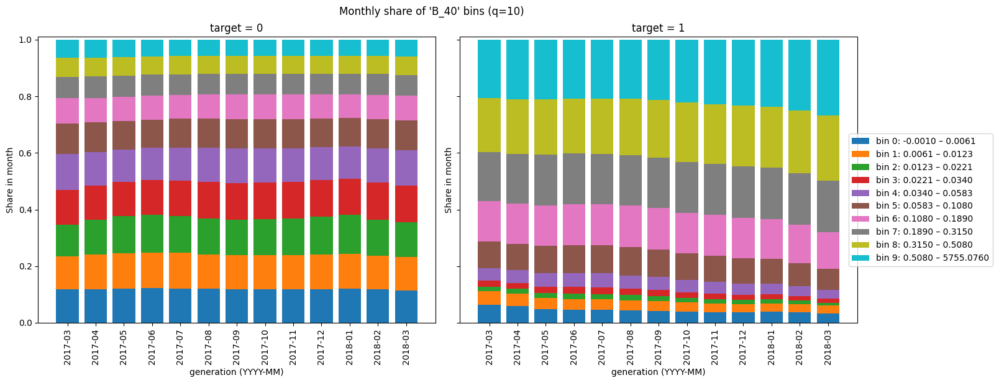

 81%|████████▏ | 123/151 [18:07<04:50, 10.36s/it]

-------------------------
feat = B_41
-------------------------


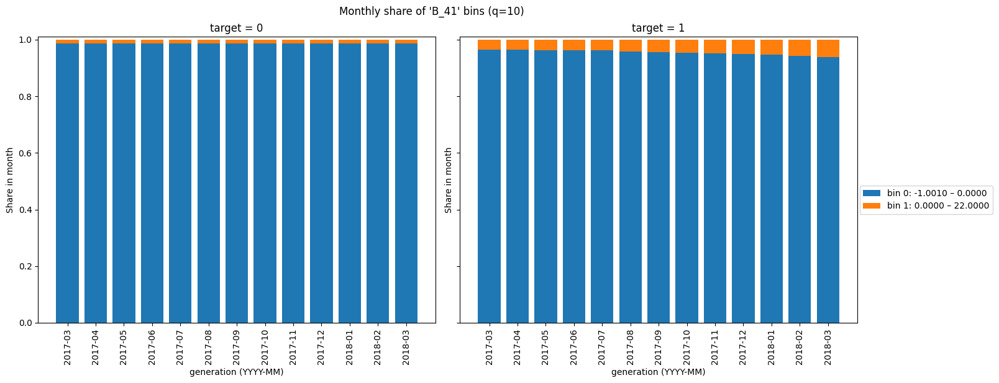

 82%|████████▏ | 124/151 [18:17<04:36, 10.23s/it]

-------------------------
feat = R_2
-------------------------


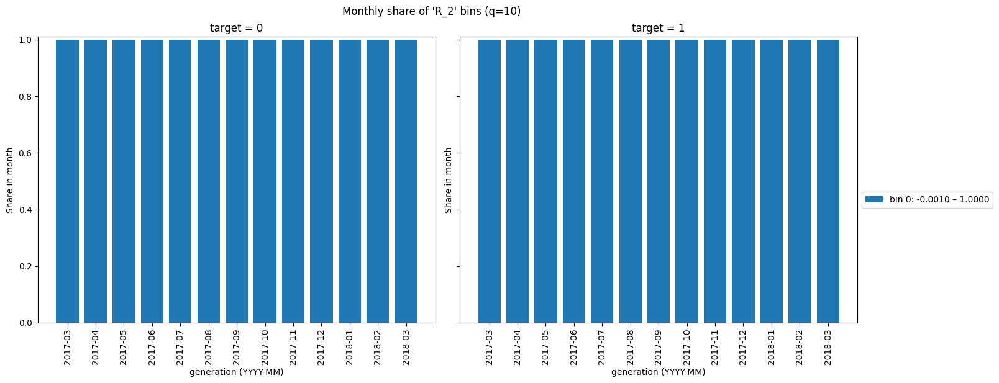

 83%|████████▎ | 125/151 [18:28<04:30, 10.39s/it]

-------------------------
feat = R_3
-------------------------


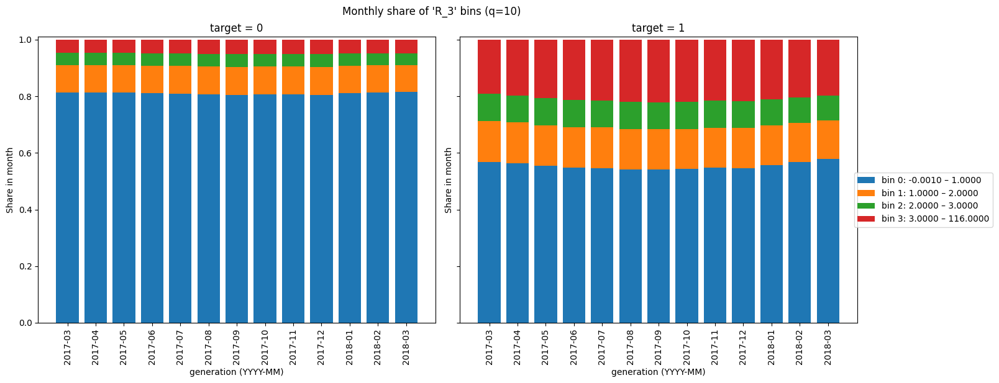

 83%|████████▎ | 126/151 [18:38<04:18, 10.34s/it]

-------------------------
feat = R_4
-------------------------


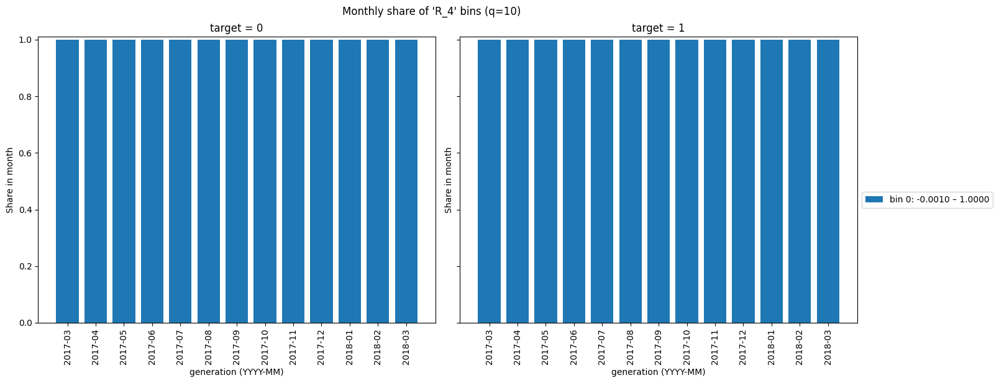

 84%|████████▍ | 127/151 [18:48<04:03, 10.17s/it]

-------------------------
feat = R_5
-------------------------


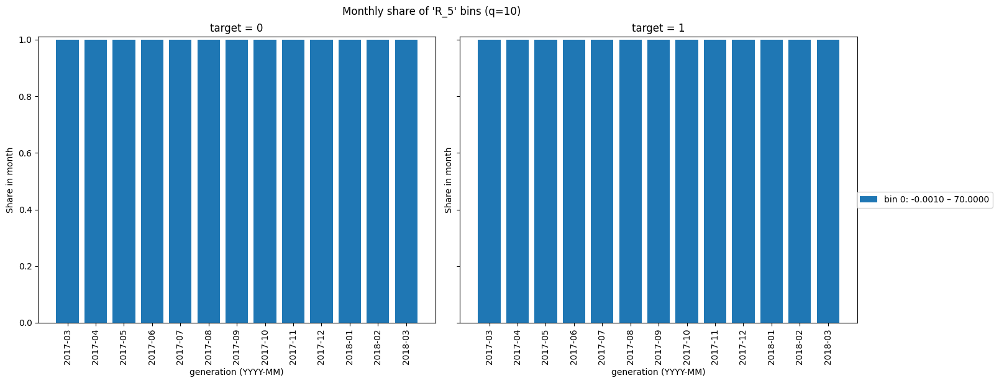

 85%|████████▍ | 128/151 [18:57<03:52, 10.10s/it]

-------------------------
feat = R_6
-------------------------


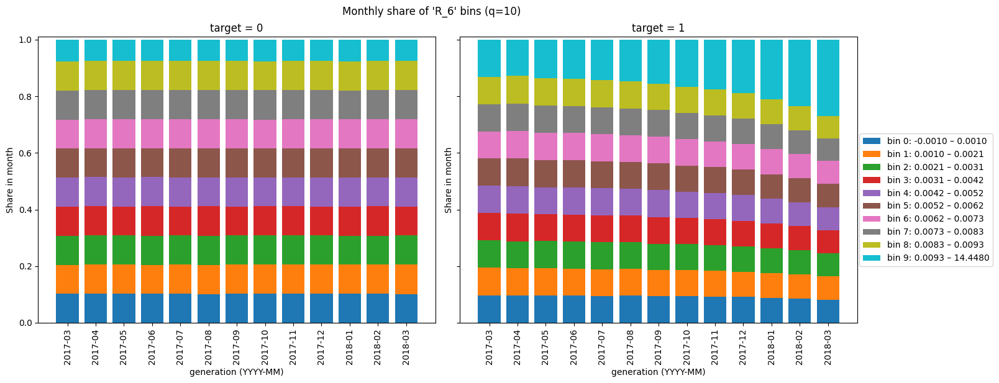

 85%|████████▌ | 129/151 [19:08<03:45, 10.23s/it]

-------------------------
feat = R_7
-------------------------


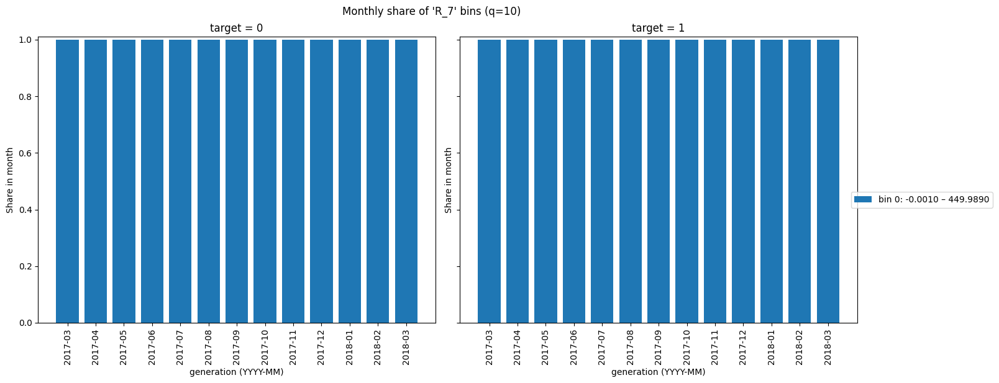

 86%|████████▌ | 130/151 [19:18<03:34, 10.21s/it]

-------------------------
feat = R_8
-------------------------


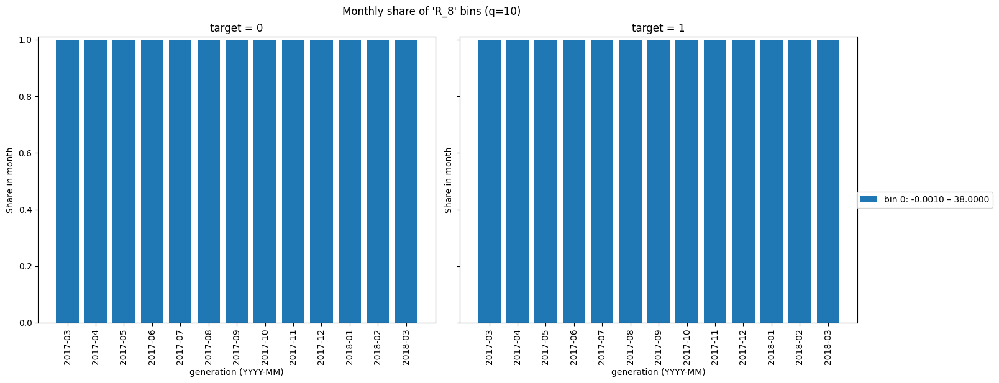

 87%|████████▋ | 131/151 [19:29<03:26, 10.30s/it]

-------------------------
feat = R_9
-------------------------


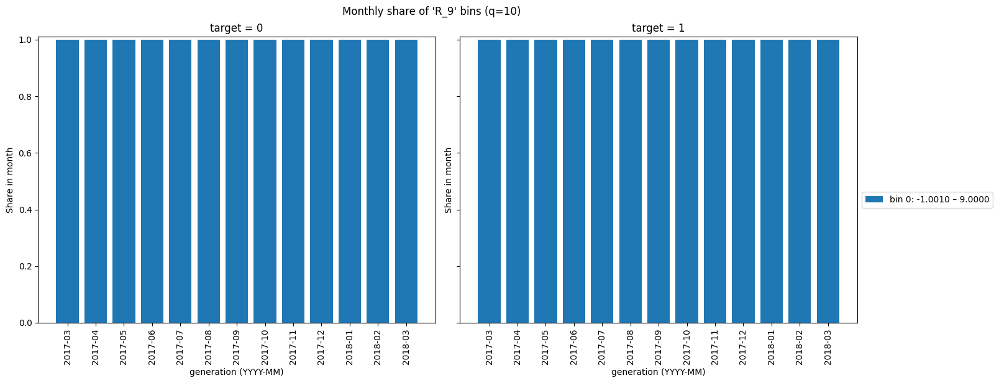

 87%|████████▋ | 132/151 [19:39<03:14, 10.26s/it]

-------------------------
feat = R_10
-------------------------


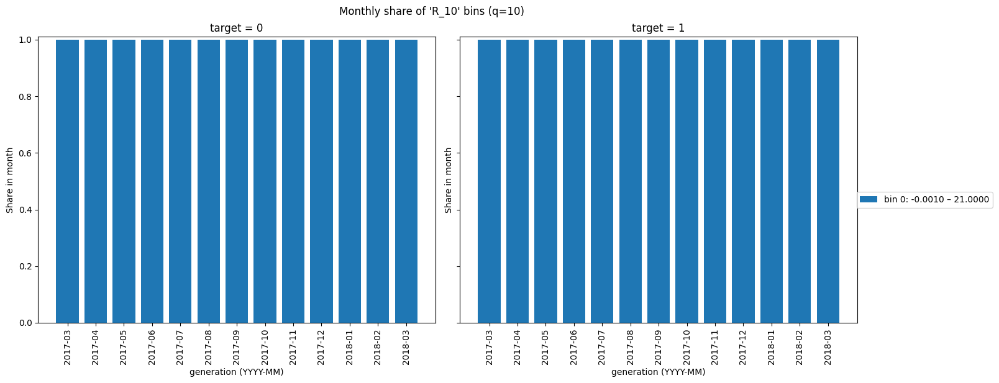

 88%|████████▊ | 133/151 [19:49<03:03, 10.22s/it]

-------------------------
feat = R_11
-------------------------


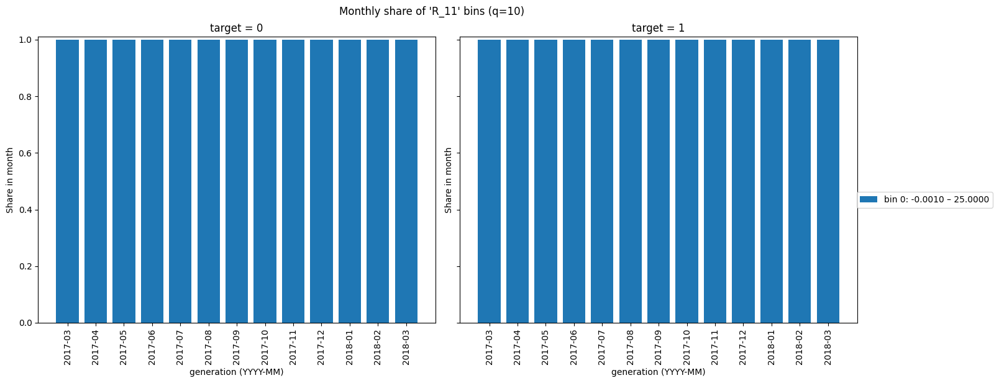

 89%|████████▊ | 134/151 [19:59<02:53, 10.19s/it]

-------------------------
feat = R_12
-------------------------


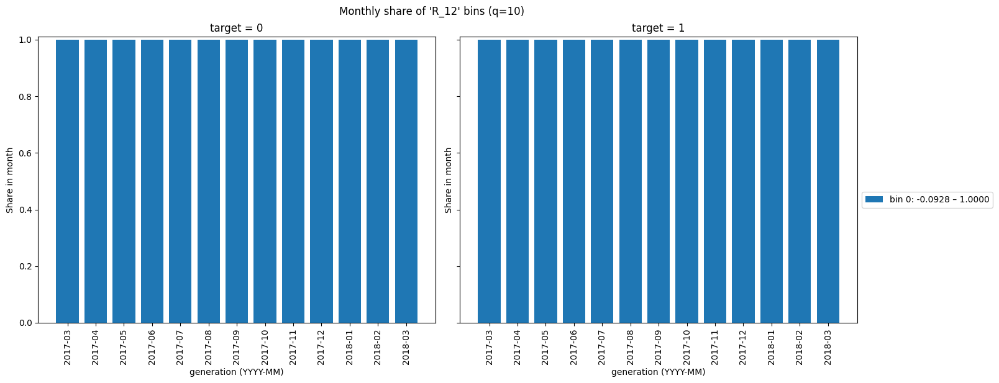

 89%|████████▉ | 135/151 [20:07<02:34,  9.66s/it]

-------------------------
feat = R_13
-------------------------


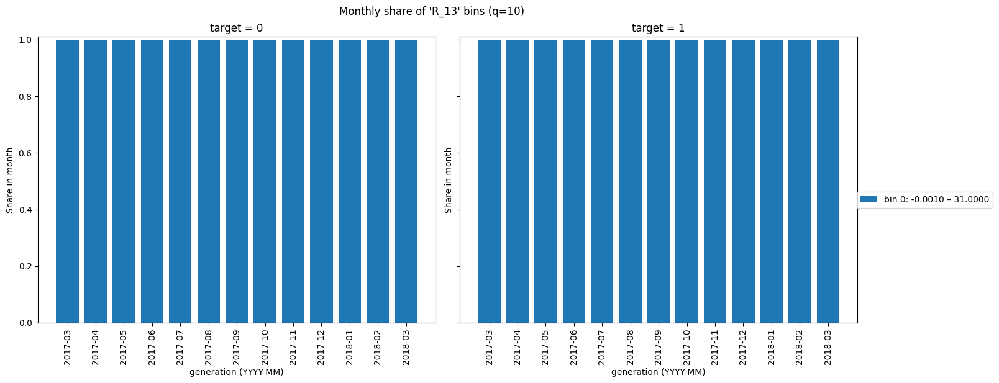

 90%|█████████ | 136/151 [20:18<02:30, 10.06s/it]

-------------------------
feat = R_14
-------------------------


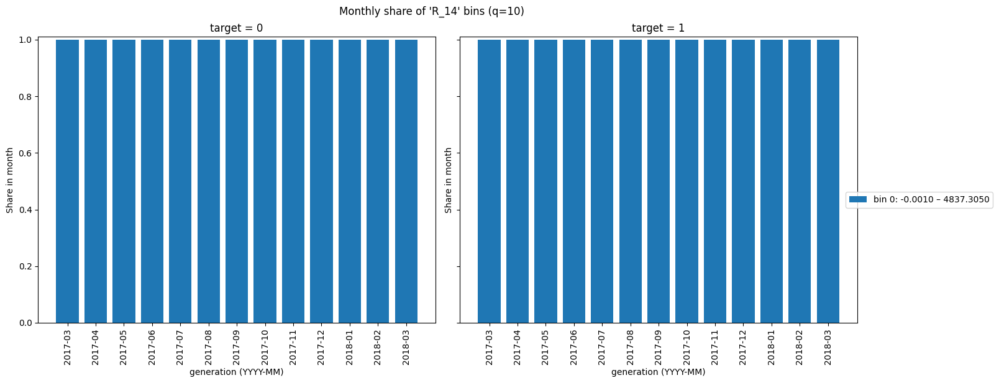

 91%|█████████ | 137/151 [20:29<02:20, 10.06s/it]

-------------------------
feat = R_15
-------------------------


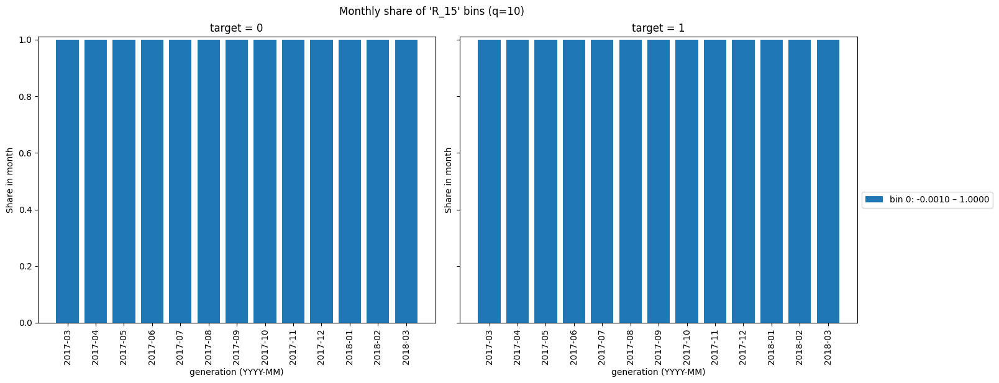

 91%|█████████▏| 138/151 [20:39<02:10, 10.07s/it]

-------------------------
feat = R_16
-------------------------


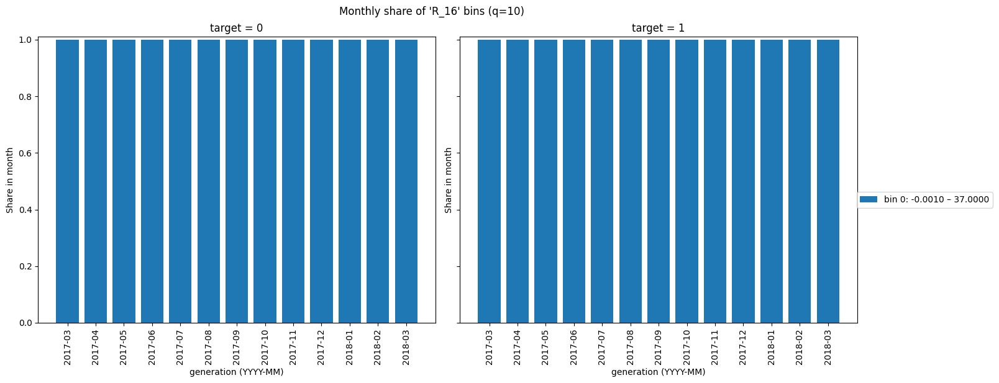

 92%|█████████▏| 139/151 [20:48<01:58,  9.91s/it]

-------------------------
feat = R_17
-------------------------


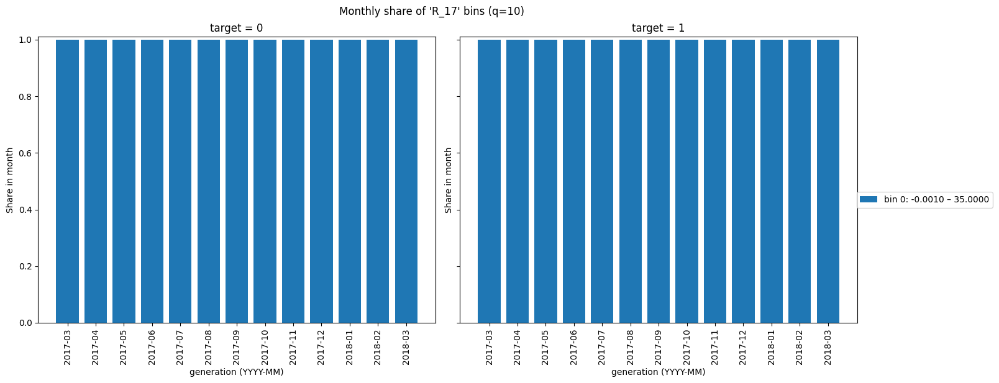

 93%|█████████▎| 140/151 [20:57<01:47,  9.73s/it]

-------------------------
feat = R_18
-------------------------


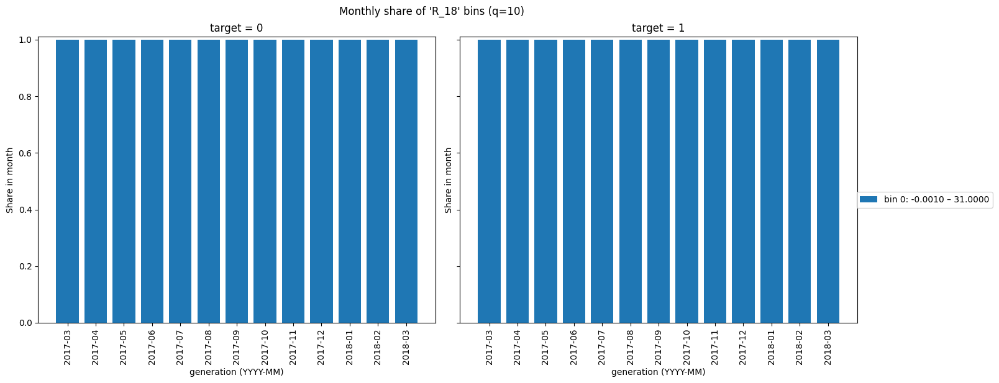

 93%|█████████▎| 141/151 [21:07<01:36,  9.67s/it]

-------------------------
feat = R_19
-------------------------


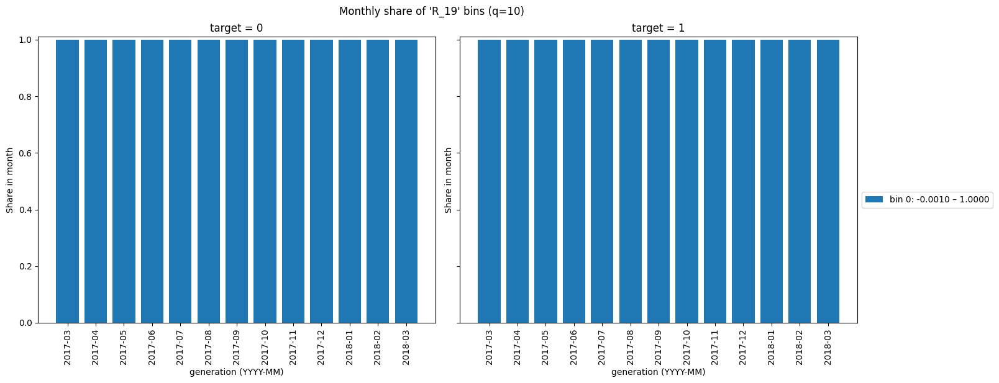

 94%|█████████▍| 142/151 [21:17<01:26,  9.63s/it]

-------------------------
feat = R_20
-------------------------


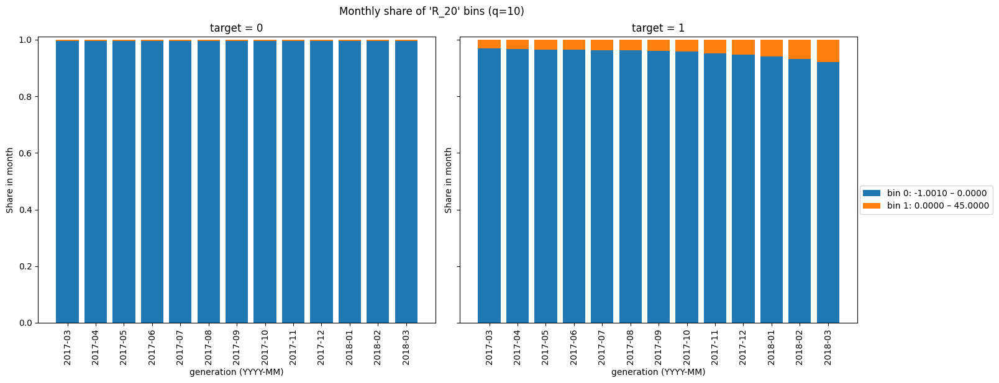

 95%|█████████▍| 143/151 [21:27<01:18,  9.86s/it]

-------------------------
feat = R_21
-------------------------


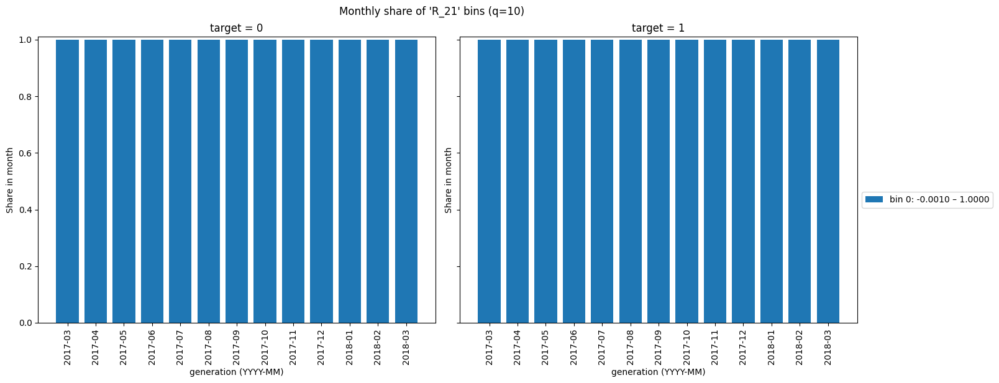

 95%|█████████▌| 144/151 [21:37<01:09,  9.99s/it]

-------------------------
feat = R_22
-------------------------


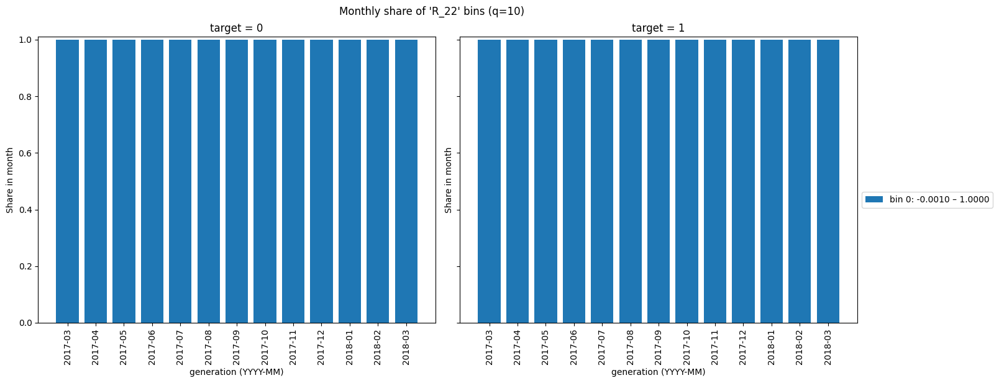

 96%|█████████▌| 145/151 [21:47<00:59,  9.99s/it]

-------------------------
feat = R_23
-------------------------


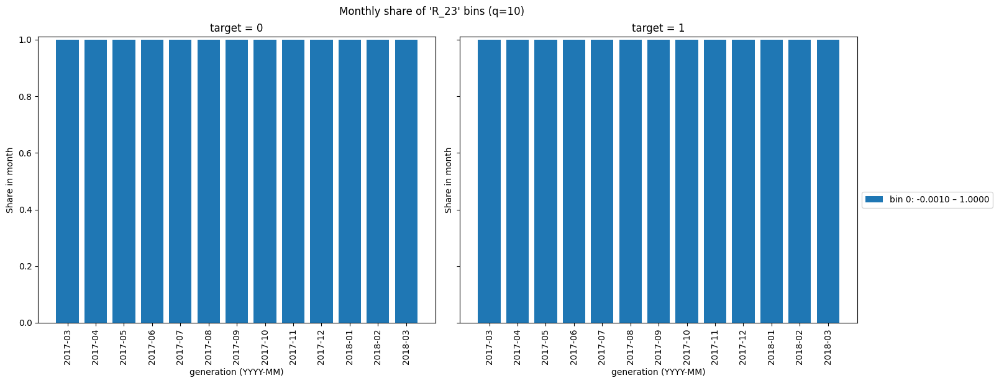

 97%|█████████▋| 146/151 [21:57<00:49,  9.97s/it]

-------------------------
feat = R_24
-------------------------


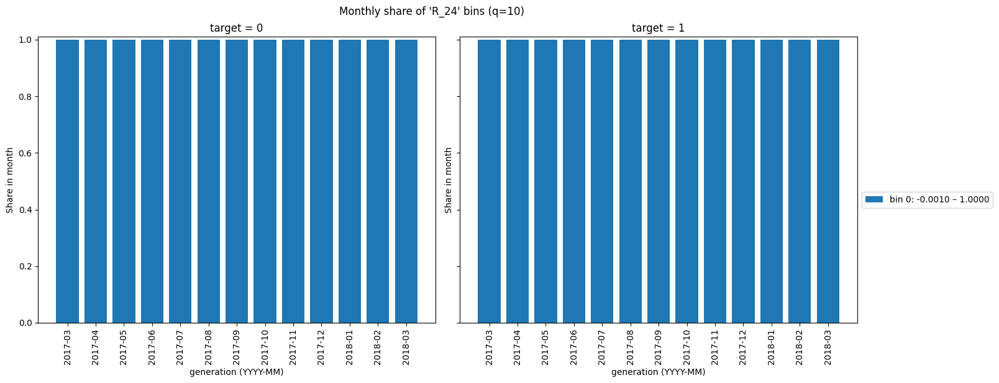

 97%|█████████▋| 147/151 [22:06<00:38,  9.72s/it]

-------------------------
feat = R_25
-------------------------


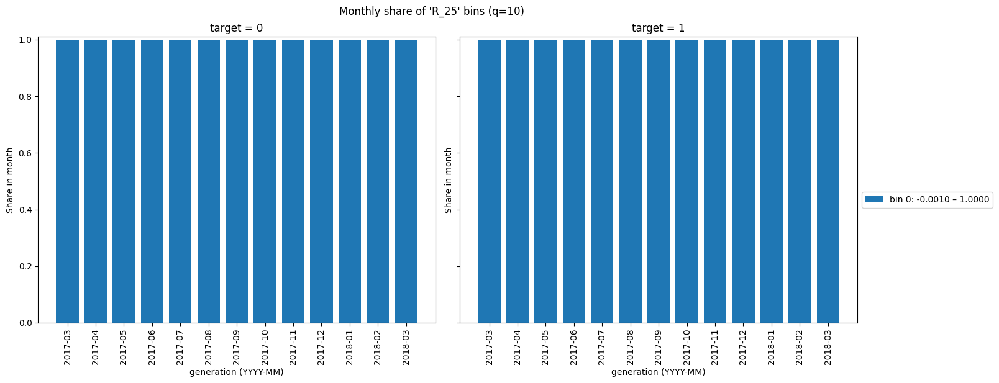

 98%|█████████▊| 148/151 [22:16<00:29,  9.69s/it]

-------------------------
feat = R_26
-------------------------


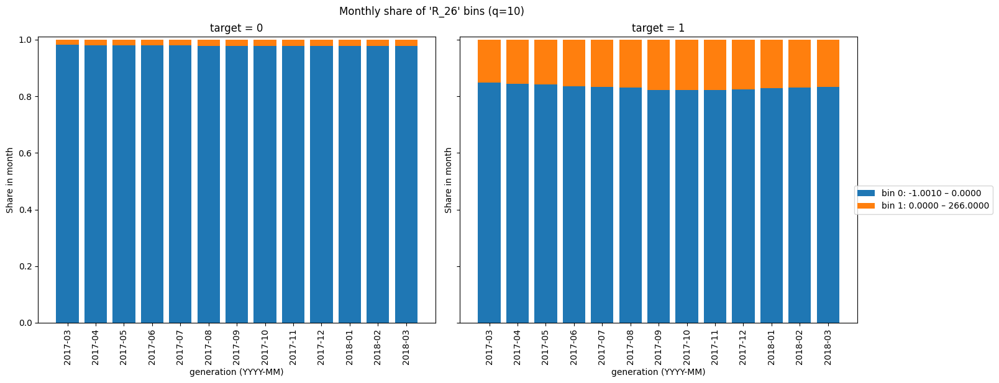

 99%|█████████▊| 149/151 [22:26<00:19,  9.70s/it]

-------------------------
feat = R_27
-------------------------


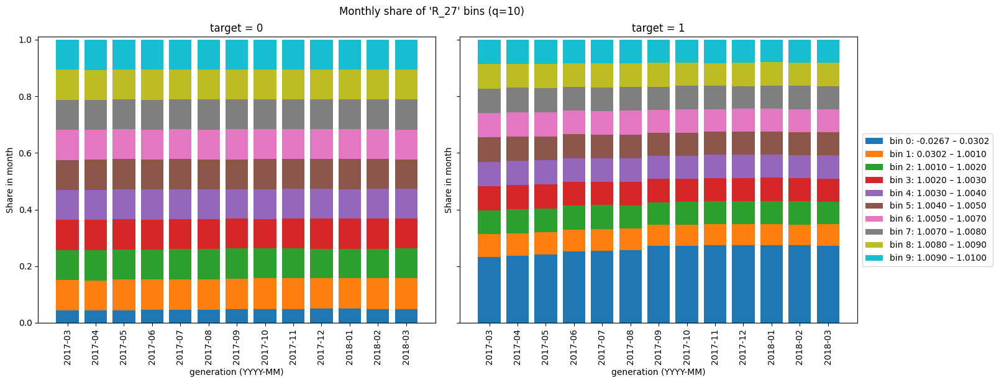

 99%|█████████▉| 150/151 [22:36<00:09,  9.96s/it]

-------------------------
feat = R_28
-------------------------


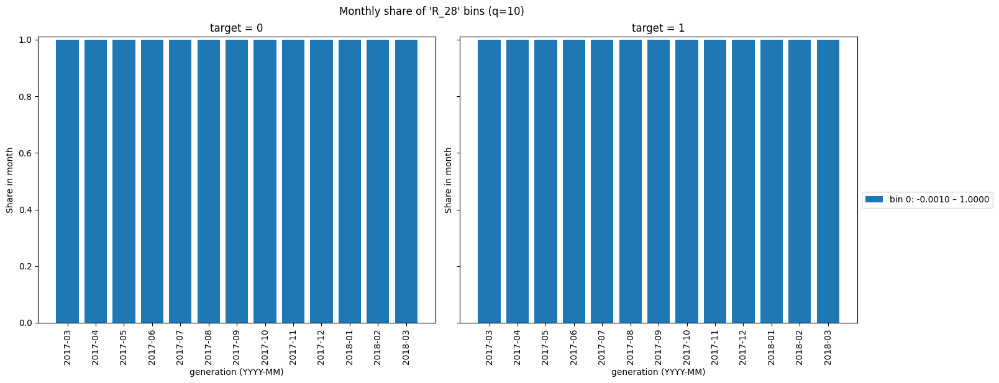

100%|██████████| 151/151 [22:46<00:00,  9.05s/it]


In [84]:
for col in tqdm(num_features):
    print("-"*25)
    print(f"feat = {col}")
    print("-"*25)
    plot_distr(df_train, col)

In [85]:
len(cat_features)

11

  0%|          | 0/11 [00:00<?, ?it/s]

-------------------------
feat = B_30
-------------------------


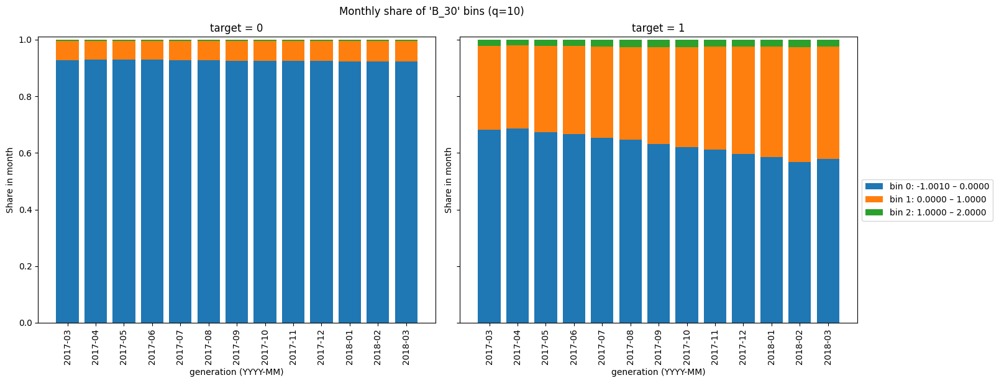

  9%|▉         | 1/11 [00:11<01:53, 11.33s/it]

-------------------------
feat = B_38
-------------------------


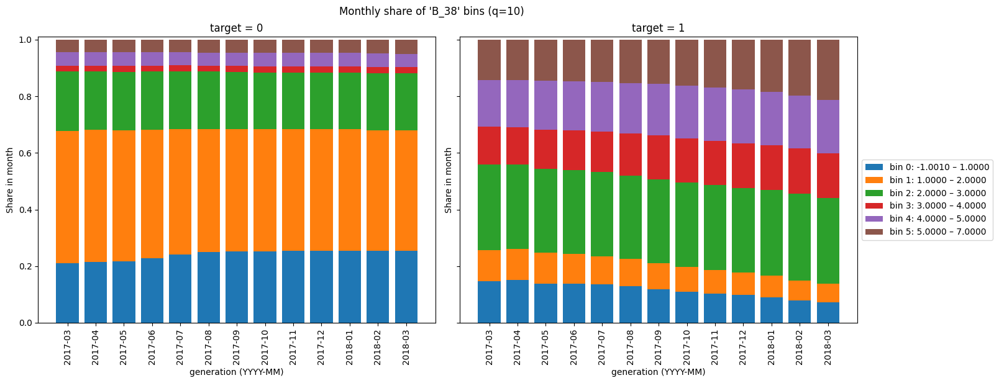

 18%|█▊        | 2/11 [00:28<02:11, 14.65s/it]

-------------------------
feat = D_114
-------------------------


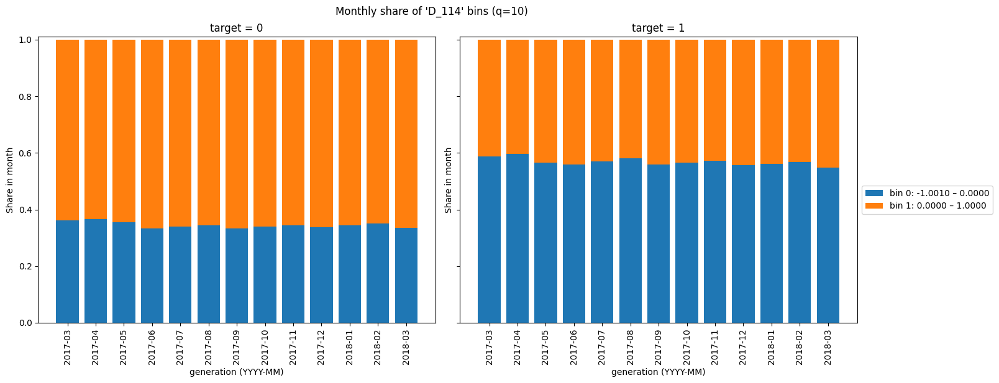

 27%|██▋       | 3/11 [00:38<01:40, 12.57s/it]

-------------------------
feat = D_116
-------------------------


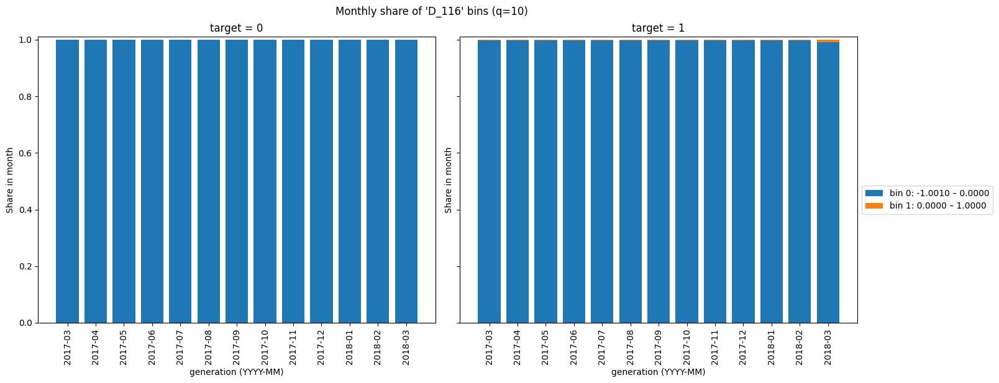

 36%|███▋      | 4/11 [00:48<01:20, 11.44s/it]

-------------------------
feat = D_117
-------------------------


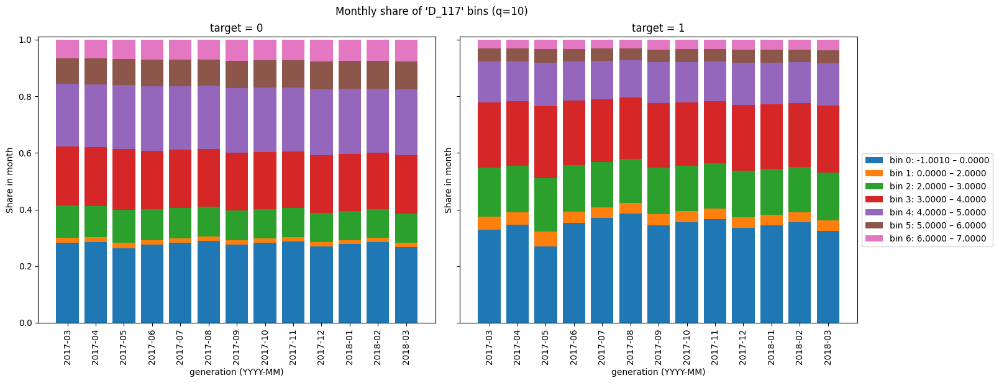

 45%|████▌     | 5/11 [00:57<01:05, 10.87s/it]

-------------------------
feat = D_120
-------------------------


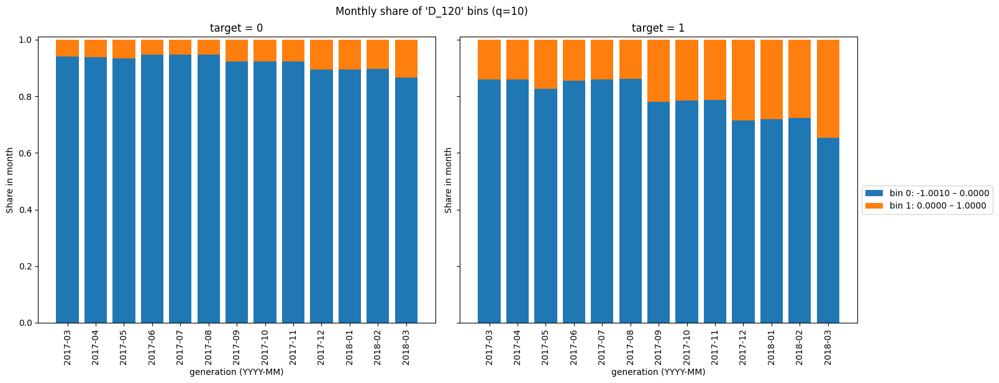

 55%|█████▍    | 6/11 [01:07<00:52, 10.47s/it]

-------------------------
feat = D_126
-------------------------


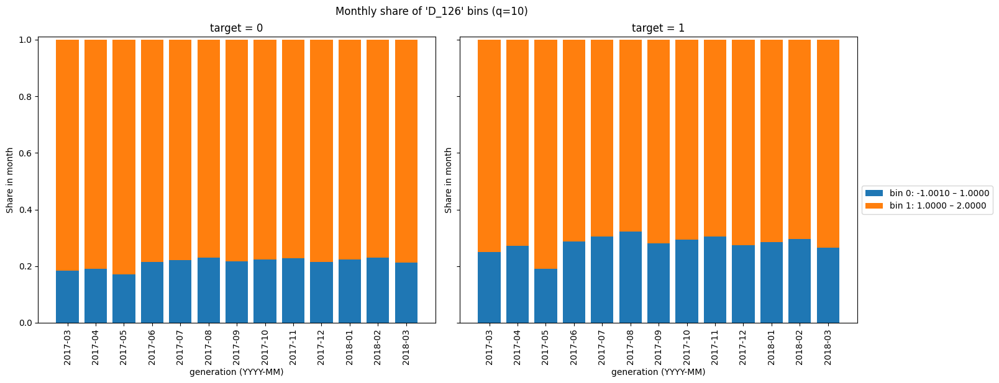

 64%|██████▎   | 7/11 [01:17<00:41, 10.28s/it]

-------------------------
feat = D_63
-------------------------


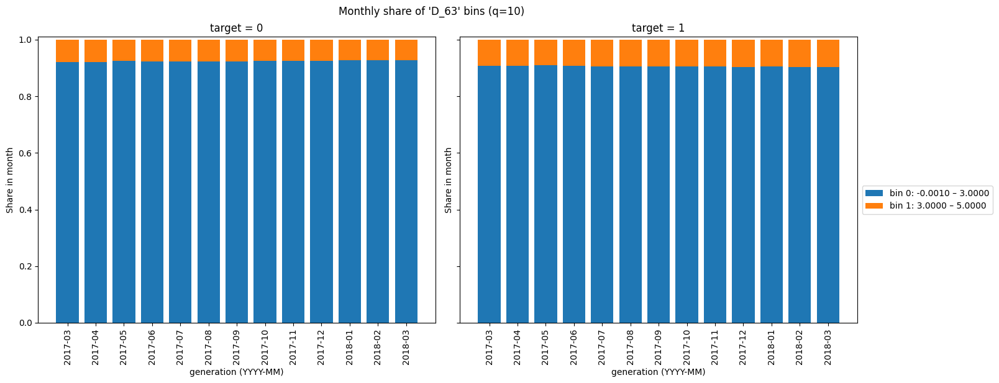

 73%|███████▎  | 8/11 [01:27<00:30, 10.02s/it]

-------------------------
feat = D_64
-------------------------


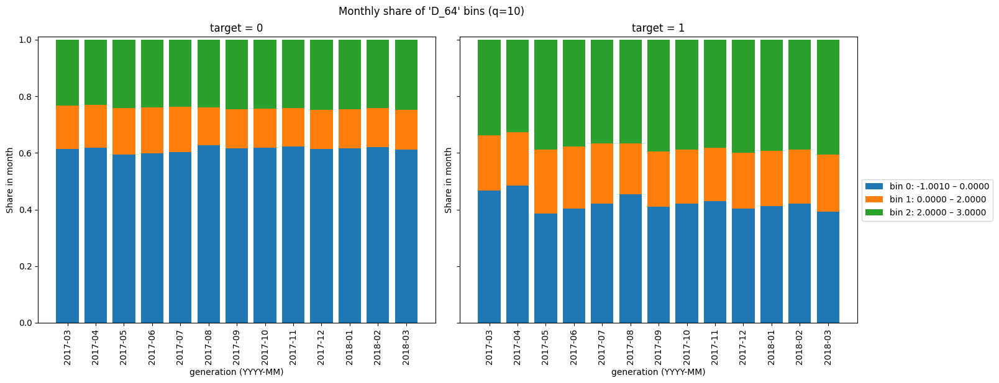

 82%|████████▏ | 9/11 [01:35<00:19,  9.66s/it]

-------------------------
feat = D_66
-------------------------


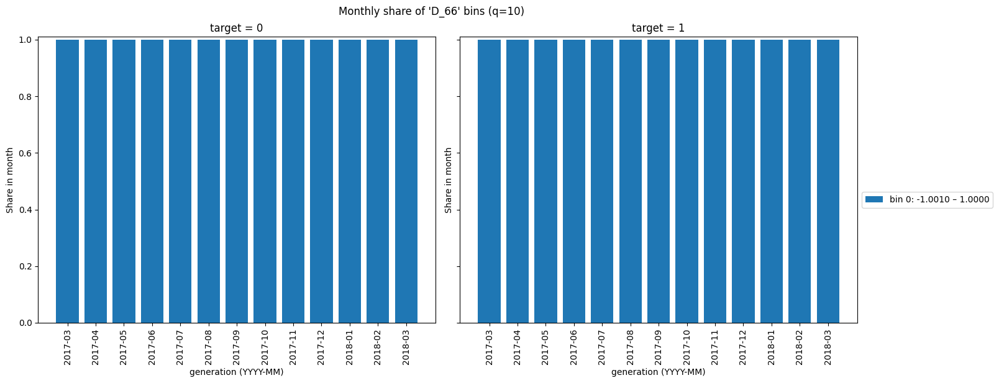

 91%|█████████ | 10/11 [01:45<00:09,  9.61s/it]

-------------------------
feat = D_68
-------------------------


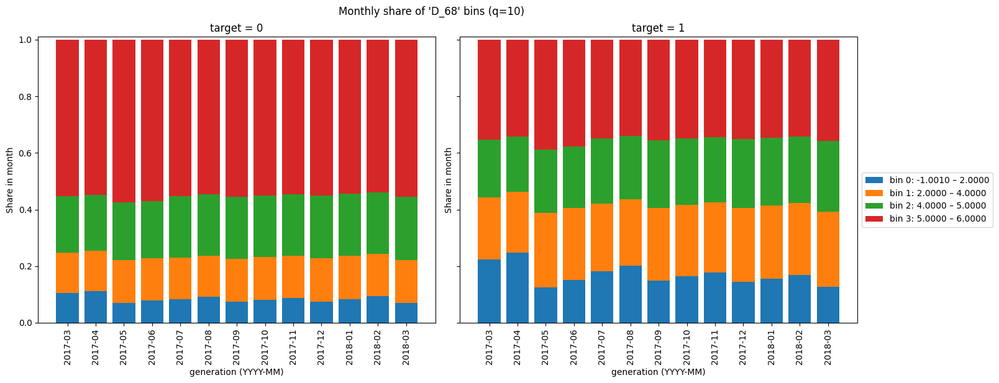

100%|██████████| 11/11 [01:55<00:00, 10.47s/it]


In [86]:
for col in tqdm(cat_features):
    print("-"*25)
    print(f"feat = {col}")
    print("-"*25)
    plot_distr(df_train, col)

### Категориальные признаки

In [97]:
cat_features

['B_30',
 'B_38',
 'D_114',
 'D_116',
 'D_117',
 'D_120',
 'D_126',
 'D_63',
 'D_64',
 'D_66',
 'D_68']

In [98]:
df_train.B_30.value_counts()

B_30
 0    4710663
 1     763955
 2      54817
-1       2016
Name: count, dtype: int64

In [99]:
df_test.B_30.value_counts()

B_30
 0    9618034
 1    1640895
 2     101916
-1       2917
Name: count, dtype: int64

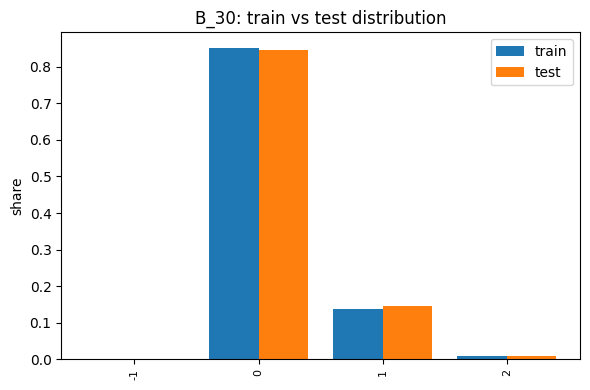

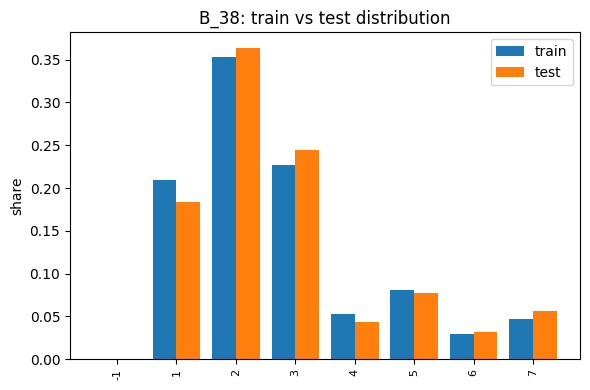

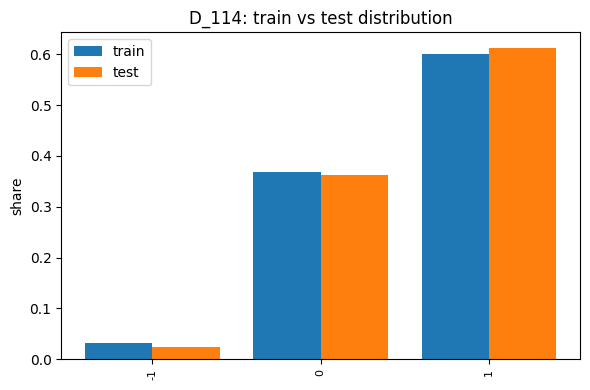

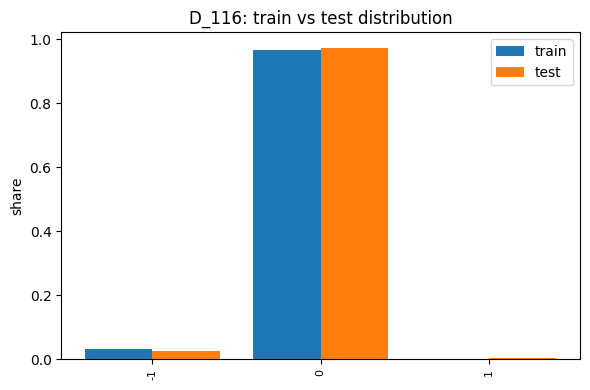

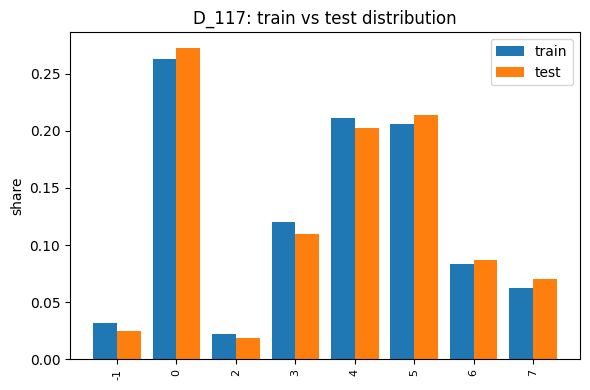

...

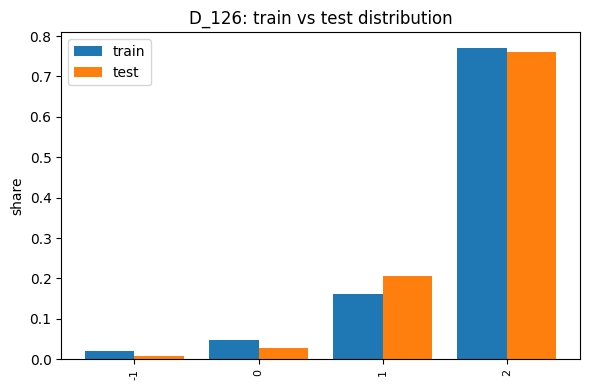

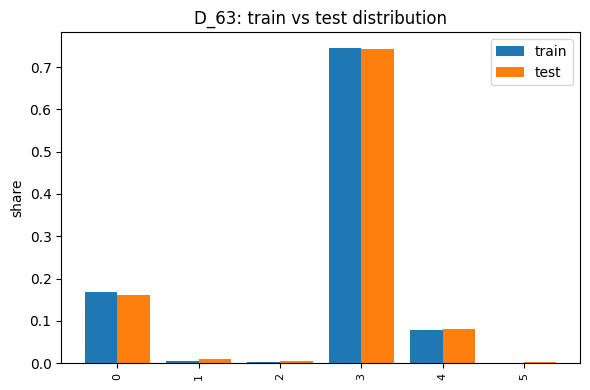

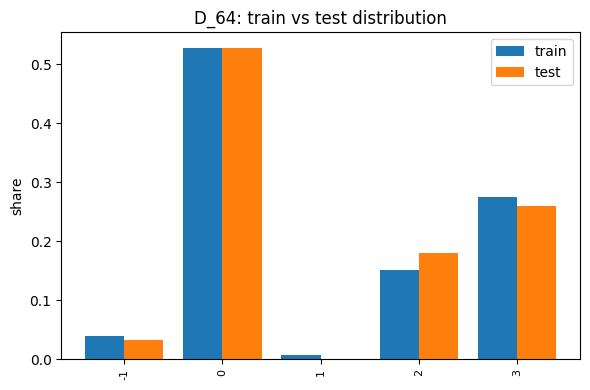

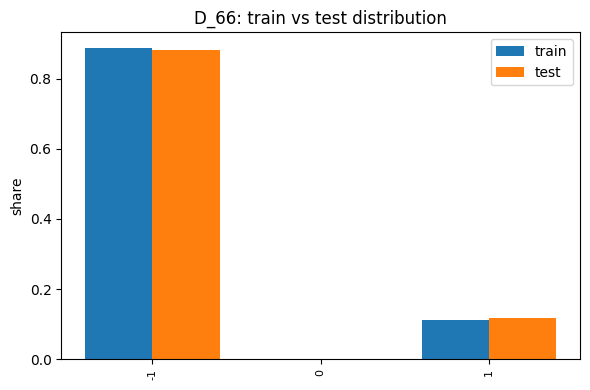

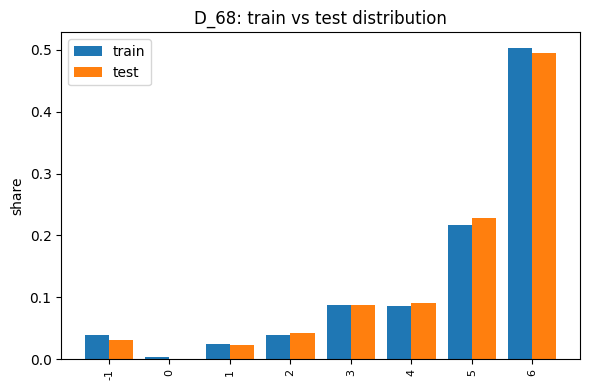

In [103]:
plot_cat_hist(df_train, df_test, cat_features, normalize=True)

In [ ]:
df_train.D_66.value_counts()

D_66
-1    4908097
 1     617066
 0       6288
Name: count, dtype: int64

In [105]:
df_test.D_66.value_counts()

D_66
-1    10013928
 1     1349834
Name: count, dtype: int64